info:
untuk mempermudah navigasi, silahkan akses Tabel of Contents pada link berikut https://shorturl.at/CQWY4

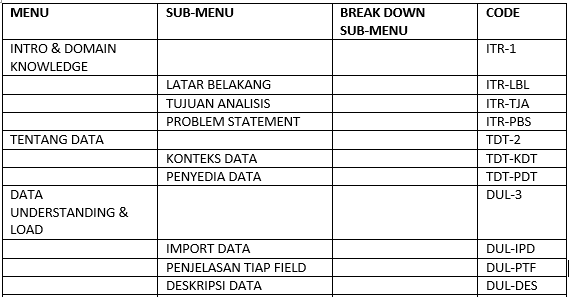

Kode pada tiap title berguna untuk mempermudah menuju bagian yang kita inginkan, anda bisa menggunakan fungsi find / ctrl+f untuk melakukan search berdasarkan kode yang ada di table of contents.

> # INTRO & DOMAIN KNOWLEDGE

code = ITR-1

Dipersiapkan oleh: Andi Setianto

**LATAR BELAKANG** (ITR-LBL)


Kota Boston merupakan salah satu kota tertua dan terkaya di Amerika Serikat, namun menjadi suatu ironi ketika mengetahui fakta bahwa kejahatan di kota Boston meningkat secara signifikan dari tahun ke tahun terutama dalam perampokan, pencurian dan pencurian mobil. Berdasarkan data Uniform Crime Reports (UCR), kota Boston dinobatkan sebagai kota dengan jumlah kejahatan terbanyak dibandingkan kota-kota lainnya. Departemen Kepolisian Boston (BPD) memberikan laporan tentang kejahatan yang terjadi di kota Boston antara 14 Juni 2015 dan 3 September 2018, beserta informasi tentang sifat kejadian, waktu kejadian, dan tempat geografis Tempat di mana kejahatan itu terjadi.

Dengan adanya data yang sudah terdokumentasi, analis kejahatan Departemen Kepolisian Boston berharap dapat memberikan wawasan untuk pengambilan keputusan, misalnya rumusan mengenai jumlah polisi yang tepat untuk berpatroli dan menyiagakan daerah rawan kejahatan, dan ingin meningkatkan kecepatan dan kesiagaan dalam merespon tindak kejahatan ataupun panggilan dari masyarakat yang terjadi di kota Boston, sehingga baik pencegahan ataupun penindakan dapat dijalankan secara tepat sasaran dan efektif.

**TUJUAN ANALISIS** (ITR-TJA)

1. Membantu Boston Police Department dalam membuat kebijakan yang efektif dan efisien dalam merespon tindak kejahatan/ panggilan masyarakat yang terjadi di kota Boston
2. Menjadi referensi yang dapat membantu fungsi/aspek pencegahan kejahatan yang ada di Kota Boston
3. Membantu menurunkan angka kejahatan di Boston

**PROBLEM STATEMENT** (ITR-TBS)

Dalam mencapai tujuan analisis tersebut, maka muncul pertanyaan yang akan kita jadikan haluan dalam analisa saat ini, yaitu:

1. Bagaimana kondisi / tren tindak kejahatan di Kota Boston dari waktu ke waktu? 
2. Jika ditinjau dari jenis/bentuk kejahatan yang terjadi, apakah ada informasi yang dapat kita ekstrasi dari jenis kejahatan yang terjadi di Kota Boston?
3. Bagaimana kondisi tindak kejahatan di Kota Boston jika ditinjau berdasarkan lokasi kejadian ataupun kondisi geografis? 
4. Berdasarkan data yang ada, apakah penanganan yang dilakukan oleh pihak kepolisian sudah tepat sasaran? 
5. Apakah ada faktor lain yang relevan dengan tindak kejahatan di Kota Boston? misalnya cuaca dalam rentang wakta yang tersedia dalam data set.

Maka secara garis besar, kita dapat melakukan analisa berdasarkan aspek 
1. WAKTU
2. JENIS / BENTUK KEJAHATAN
3. TKP / KONDISI GEOGRAFIS
4. TINDAKAN KEPOLISIAN
5. FAKTOR LAIN: CUACA


> # TENTANG DATA

code: TDT-2

**KONTEKS DATA** (TDT-KDT)

Merupakan data laporan insiden kejahatan disediakan oleh Departemen Kepolisian Boston (BPD) untuk mendokumentasikan detail awal seputar insiden yang ditanggapi oleh petugas BPD. Berupa kumpulan data yang berisi catatan dari sistem laporan insiden kejahatan, yang difokuskan untuk merekam jenis insiden serta kapan dan di mana itu terjadi. Jangkauan data yaitu pada 14 Juni 2015 hingga 3 September 2018.

**PENYEDIA DATA** (TDT-PDT)

Data tersebut disediakan oleh Analyze Boston. Apabila ingin mengakses lebih lanjut dapat melalui link berikut: https://www.kaggle.com/datasets/AnalyzeBoston/crimes-in-boston

> # DATA UNDERSTANDING & LOAD

code: DUL-3

**IMPORT DATA** (DUL-IPD)

In [1]:
# data analysis and wrangling
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import normaltest, chi2_contingency, mannwhitneyu, ttest_ind
import re

# visualization
import seaborn as sns
import plotly.express as px
from matplotlib.ticker import PercentFormatter
from matplotlib.ticker import MaxNLocator
import matplotlib.patheffects as pe
import json


In [2]:
# import data 
df = pd.read_csv("G:\DS\crime.csv", encoding_errors='ignore')

# df = pd.read_csv("D:\Crime in Boston\crime.csv", encoding_errors='ignore')


**PENJELASAN TIAP FIELD** (DUL-PTF)

In [3]:

df.head()

,INCIDENT_NUMBER,OFFENSE_CODE,OFFENSE_CODE_GROUP,OFFENSE_DESCRIPTION,DISTRICT,REPORTING_AREA,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,HOUR,UCR_PART,STREET,Lat,Long,Location
0,I182070945,619,Larceny,LARCENY ALL OTHERS,D14,808,NaN,2018-09-02 13:00:00,2018,9,Sunday,13,Part One,LINCOLN ST,42.357791,-71.139371,"(42.35779134, -71.13937053)"
1,I182070943,1402,Vandalism,VANDALISM,C11,347,NaN,2018-08-21 00:00:00,2018,8,Tuesday,0,Part Two,HECLA ST,42.306821,-71.060300,"(42.30682138, -71.06030035)"
2,I182070941,3410,Towed,TOWED MOTOR VEHICLE,D4,151,NaN,2018-09-03 19:27:00,2018,9,Monday,19,Part Three,CAZENOVE ST,42.346589,-71.072429,"(42.34658879, -71.07242943)"
3,I182070940,3114,Investigate Property,INVESTIGATE PROPERTY,D4,272,NaN,2018-09-03 21:16:00,2018,9,Monday,21,Part Three,NEWCOMB ST,42.334182,-71.078664,"(42.33418175, -71.07866441)"
4,I182070938,3114,Investigate Property,INVESTIGATE PROPERTY,B3,421,NaN,2018-09-03 21:05:00,2018,9,Monday,21,Part Three,DELHI ST,42.275365,-71.090361,"(42.27536542, -71.09036101)"


Berikut penjelasan dari data di atas :
1. INCIDENT_NUMBER : Merupakan primary key / penomoran yang bersifat unik untuk setiap kejadian yang terjadi
2. OFFENSE_CODE : Merupakan kode insiden yang terjadi
3. OFFENSE_CODE_GROUP : Merupakan kategori insiden yang terjadi
4. OFFENSE_DESCRIPTION : Deskripsi singkat yang menjelaskan terkait kejadian
5. DISTRICT : Kode distrik tempat terjadinya insiden
6. REPORTING_AREA : Kode area berdasarkan area/lokasi yang dilaporkan
7. SHOOTING : Field yang menunjukan apakah terjadi penemabakan atau tidak, bersifat True / Flase (Yes / No)
8. OCCURRED_ON_DATE : Tanggal dan waktu terjadinya insiden
9. YEAR : Tahun terjadinya insiden
10. MONTH : Bulan terjadinya insiden
11. DAY_OF_WEEK : Hari terjadinya insiden
12. HOUR : Jam terjadinya insiden
13. UCR_PART : Index Uniform Crime Report
14. STREET : Nama jalan tempat terjadinya insiden
15. Lat : Garis Lintang titik terjadinya insiden
16. Long : Garis Bujur titik terjadinya insiden
17. Location : Titik lokasi berdasarkan informasi garis lintang dan garis bujur

Selanjutnya kita akan mencoba melihat data yang ada dalam data set offense_code, mari kita lihat apakah data ini perlu kita libatkan dalam object pengamatan atau tidak.

In [4]:
df_offense = pd.read_csv("G:\DS\offense_codes.csv", encoding = 'latin')

In [5]:
display(df_offense.head(), df_offense.tail())

,CODE,NAME
0,612,LARCENY PURSE SNATCH - NO FORCE
1,613,LARCENY SHOPLIFTING
2,615,LARCENY THEFT OF MV PARTS & ACCESSORIES
3,1731,INCEST
4,3111,LICENSE PREMISE VIOLATION


,CODE,NAME
571,1806,DRUGS - CLASS B TRAFFICKING OVER 18 GRAMS
572,1807,DRUGS - CLASS D TRAFFICKING OVER 50 GRAMS
573,1610,HUMAN TRAFFICKING - COMMERCIAL SEX ACTS
574,2010,HOME INVASION
575,1620,HUMAN TRAFFICKING - INVOLUNTARY SERVITUDE


Dataset OFFENSE_CODE adalah penjelasan dari kode kejahatan pada dataset CRIME. Namun pada dataset CRIME terdapat kolom `offense_description`. Sehingga data tersebut penting kita gunakan untuk memperjelas dataset crime.csv.

**DESKRIPSI DATA** (DUL-DES)

In [6]:
#melihat jumlah kolom dan baris pada DataFrame
df.shape

(319073, 17)

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 319073 entries, 0 to 319072
Data columns (total 17 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   INCIDENT_NUMBER      319073 non-null  object 
 1   OFFENSE_CODE         319073 non-null  int64  
 2   OFFENSE_CODE_GROUP   319073 non-null  object 
 3   OFFENSE_DESCRIPTION  319073 non-null  object 
 4   DISTRICT             317308 non-null  object 
 5   REPORTING_AREA       319073 non-null  object 
 6   SHOOTING             1019 non-null    object 
 7   OCCURRED_ON_DATE     319073 non-null  object 
 8   YEAR                 319073 non-null  int64  
 9   MONTH                319073 non-null  int64  
 10  DAY_OF_WEEK          319073 non-null  object 
 11  HOUR                 319073 non-null  int64  
 12  UCR_PART             318983 non-null  object 
 13  STREET               308202 non-null  object 
 14  Lat                  299074 non-null  float64
 15  Long             

In [8]:
df.describe()

,OFFENSE_CODE,YEAR,MONTH,HOUR,Lat,Long
count,319073.000000,319073.000000,319073.000000,319073.000000,299074.000000,299074.000000
mean,2317.546956,2016.560586,6.609719,13.118205,42.214381,-70.908272
std,1185.285543,0.996344,3.273691,6.294205,2.159766,3.493618
min,111.000000,2015.000000,1.000000,0.000000,-1.000000,-71.178674
25%,1001.000000,2016.000000,4.000000,9.000000,42.297442,-71.097135
50%,2907.000000,2017.000000,7.000000,14.000000,42.325538,-71.077524
75%,3201.000000,2017.000000,9.000000,18.000000,42.348624,-71.062467
max,3831.000000,2018.000000,12.000000,23.000000,42.395042,-1.000000


In [9]:
df.describe(include='object')

,INCIDENT_NUMBER,OFFENSE_CODE_GROUP,OFFENSE_DESCRIPTION,DISTRICT,REPORTING_AREA,SHOOTING,OCCURRED_ON_DATE,DAY_OF_WEEK,UCR_PART,STREET,Location
count,319073,319073,319073,317308,319073,1019,319073,319073,318983,308202,319073
unique,282517,67,244,12,879,1,233229,7,4,4657,18194
top,I162030584,Motor Vehicle Accident Response,SICK/INJURED/MEDICAL - PERSON,B2,,Y,2017-06-01 00:00:00,Friday,Part Three,WASHINGTON ST,"(0.00000000, 0.00000000)"
freq,13,37132,18783,49945,20250,1019,29,48495,158553,14194,19999


Sebagai pendalaman awal, kita menemukan bahwa:

- DataFrame terdiri dari 319073 baris dan 17 kolom
- 4 kolom bertipe integer dan 2 kolom bertipe float
- 11 kolom berupa object / string
- Kolom occurred_date seharusnya berformate date, bukan object
- Ada 6 field yang mengandung null value, yaitu  DISTRICT, SHOOTING, UCR_PART, STREET, Lat, dan Long.
- Setiap field memiliki duplikat / tidak ada dataset yang sepenuhnya unik.
- Pada kolom INCIDENT_NUMBER jumlah data dan jumlah unique valuenya berbeda, padahal setiap kasus harusnya hanya memiliki satu unique value, sehingga ada indikasi data yang terduplikasi
- INCIDENT_NUMBER yang sama bisa saja terdiri dari beberapa jenis insiden kejahatan yang berbeda.
- 'Motor Vehicle Accident Response' adalah value yang paling sering muncul dari field OFFENSE_CODE_GROUP, terdapat sejumlah 67 jenis OFFENSE_CODE_GROUP yang ada dalam dataset crime.csv
- 'SICK/INJURED/MEDICAL - PERSON' adalah value yang paling sering muncul pada field OFFENSE_DESCRIPTION, terdapat sejumlah 244 jenis OFFENSE_DESCRIPTION yang ada dalam dataset crime.csv, jika dilihat dari data OFFENSE_CODE_GROUP yang terdiri dari 67 jenis, artinya dalam satu OFFENSE_CODE_GROUP terdapat beberapa OFFENSE_DESCRIPTION
- Terdapat 12 kode district
- Whitespace characters adalah data yang paling sering muncul pada field REPORTING_AREA , hal ini harus ditangani lebih lanjut.
- Kolom shooting hanya mengandung satu nilai, yaitu Y, namun di sisi lain nilau NULL juga sangat banyak, hal ini menjadi perhatian khusus yang harus ditangani
- OCCURED_ON_DATE berisi data tanggal dan waktu dengan format 'yyyy-mm-dd hh:mm:ss'
- Terdapat 7 nilai pada DAY_OF_WEEK, hal ini sudah tepat dengan jumlah hari secara universal.
- Terdapat 4 kategori pada field UCR_PART
- 'WASHINGTON ST' adalah nilai yang paling sering muncul pada field STREET, terdapat sejumlah 4657 street / nama jalan yang ada dalam dataset crime.csv
- Location merupakan kombinasi dari field Lat dan Long dengan nilai yang paling sering muncul yaitu '(0.00000000, 0.00000000)'
- Pada field Location terdapat value (-1.00000000, -1.00000000) dan (0.00000000, 0.00000000)

> # DATA CLEANING & MANIPULATION

code: DCM-4

**ANALISA DATA UNIK** (DCM-ADU)

Sebelumnya, mari kita breakdown data unik yang terkandung pada setiap field

In [10]:

pd.set_option('display.max_colwidth', None)
list1 = []
for col in df.columns :
    list1.append([col, df[col].nunique(), df.sort_values(col)[col].unique()])

tabel_unique = pd.DataFrame(columns=['Nama Kolum', 'Jumlah Data Unique', 'Unique Sample'],
                     data=list1)
tabel_unique

,Nama Kolum,Jumlah Data Unique,Unique Sample
0,INCIDENT_NUMBER,282517,"[142052550, I010370257-00, I030217815-08, I050310906-00, I060168073-00, I080542626-00, I090317057-00, I090321958-00, I100033064-00, I100222105-02, I100340225-00, I100636670-00, I110177502-00, I110261417-00, I110372326-00, I110551302-00, I110611058-00, I110694557-00, I120069826-00, I120189428-00, I120201612-00, I120260724-01, I120283195-00, I120470733-00, I120595668-00, I120719309-00, I120720047-00, I130007264-01, I130031413-00, I130041200-00, I130084703-00, I130126035-00, I130194606-00, I130202615-00, I130204032-00, I130304171-00, I130325877-00, I130371627-00, I130452692-00, I130513834-00, I130559249-00, I130626822-00, I130634867-00, I130731947-00, I130739503-00, I130769339-00, I130789976-00, I140036361-00, I140039570-00, I140041532-00, I140042060-00, I140056633-00, I140110321-00, I140148421-00, I140160427-01, I140173500-00, I140188130-00, I140254285-00, I140295154-00, I140300475-02, I140311903-00, I140319608-00, I140346143-00, I140356025-00, I140372066-00, I142002101-00, I142004681-00, I142010194-00, I142013220-00, I142014620-00, I142016089-00, I142017108-00, I142020701-00, I142020933-00, I142022633-00, I142023661-00, I142024796-00, I142025834-00, I142025900-00, I142029747-00, I142032469-00, I142033071-00, I142033219-00, I142034820-00, I142035471-00, I142036405-00, I142039468-00, I142041046-00, I142041685-01, I142042232-00, I142044610-00, I142045442-00, I142045856-00, I142045979-00, I142048539-00, I142049917-00, I142050174-00, I142050207-00, I142051855-00, I142052022-00, ...]"
1,OFFENSE_CODE,222,"[111, 112, 121, 123, 301, 311, 315, 334, 335, 338, 339, 349, 351, 361, 371, 381, 402, 403, 404, 413, 423, 432, 511, 520, 521, 522, 527, 530, 540, 541, 542, 547, 560, 561, 562, 611, 612, 613, 614, 615, 616, 617, 618, 619, 623, 624, 627, 629, 633, 634, 637, 639, 670, 706, 714, 724, 727, 735, 770, 801, 802, 803, 804, 900, 1001, 1002, 1102, 1105, 1106, 1107, 1108, 1109, 1201, 1300, 1302, 1304, 1402, 1415, 1501, 1502, 1503, 1504, 1510, 1601, 1602, 1603, 1605, 1610, 1620, 1805, 1806, 1807, 1810, 1815, 1825, 1830, 1831, 1832, 1841, 1842, ...]"
2,OFFENSE_CODE_GROUP,67,"[Aggravated Assault, Aircraft, Arson, Assembly or Gathering Violations, Auto Theft, Auto Theft Recovery, Ballistics, Biological Threat, Bomb Hoax, Burglary - No Property Taken, Commercial Burglary, Confidence Games, Counterfeiting, Criminal Harassment, Disorderly Conduct, Drug Violation, Embezzlement, Evading Fare, Explosives, Fire Related Reports, Firearm Discovery, Firearm Violations, Fraud, Gambling, HOME INVASION, HUMAN TRAFFICKING, HUMAN TRAFFICKING - INVOLUNTARY SERVITUDE, Harassment, Harbor Related Incidents, Homicide, INVESTIGATE PERSON, Investigate Person, Investigate Property, Landlord/Tenant Disputes, Larceny, Larceny From Motor Vehicle, License Plate Related Incidents, License Violation, Liquor Violation, Manslaughter, Medical Assistance, Missing Person Located, Missing Person Reported, Motor Vehicle Accident Response, Offenses Against Child / Family, Operating Under the Influence, Other, Other Burglary, Phone Call Complaints, Police Service Incidents, Prisoner Related Incidents, Property Found, Property Lost, Property Related Damage, Prostitution, Recovered Stolen Property, Residential Burglary, Restraining Order Violations, Robbery, Search Warrants, Service, Simple Assault, Towed, Vandalism, Verbal Disputes, Violations, Warrant Arrests]"
3,OFFENSE_DESCRIPTION,244,"[A&B HANDS, FEET, ETC. - MED. ATTENTION REQ., A&B ON POLICE OFFICER, ABDUCTION - INTICING, AFFRAY, AIRCRAFT INCIDENTS, ANIMAL ABUSE, ANIMAL CONTROL - DOG BITES - ETC., ANIMAL INCIDENTS, ANNOYING AND ACCOSTIN, ANNOYING AND ACCOSTING, ARSON, ASSAULT & BATTERY, ASSAULT & BATTERY D/W - KNIFE, ASSAULT & BATTERY D/W - OTHER, ASSAULT & BATTERY D/W - OTHER ON POLICE OFFICER, ASSAULT - AGGRAVATED, ASSAULT - AGGRAVATED - BATTERY, ASSAULT - SIMPLE, ASSAULT D/W - KNIFE ON POLICE OFFICER, ASSAULT D/W - OTHER, ASSAULT SIMPLE - BATTERY, AUTO THEFT,

Selain itu kita coba cek description yang serupa, karena pada sistem nantinya hal ini akan dianggap 2 value yang berbeda, maka nantinya harus ditangani lebih lanjut.

In [11]:

cek_word = list(df['OFFENSE_DESCRIPTION'].unique())

[word for word in cek_word if 'HOME INVASION' in word]


['HOME INVASION', 'ROBBERY - HOME INVASION']

Mari kita buat rekapitulasi yang mempermudah kita untuk cek data unik

In [12]:
dataDesc=[]
for i in df.columns:
    dataDesc.append([
        i,
        df[i].dtypes,
        df[i].nunique(),
        df[i].drop_duplicates().sample(2).values
    ])

pd.DataFrame(dataDesc, columns=[
    'Data Features',
    'Data Types',
    'Unique',
    'Unique Sample'
])

,Data Features,Data Types,Unique,Unique Sample
0,INCIDENT_NUMBER,object,282517,"[I152077663, I172036847]"
1,OFFENSE_CODE,int64,222,"[1864, 724]"
2,OFFENSE_CODE_GROUP,object,67,"[Warrant Arrests, Drug Violation]"
3,OFFENSE_DESCRIPTION,object,244,"[WEAPON - FIREARM - CARRYING / POSSESSING, ETC, ROBBERY - UNARMED - STREET]"
4,DISTRICT,object,12,"[A1, C6]"
5,REPORTING_AREA,object,879,"[452, 229]"
6,SHOOTING,object,1,"[nan, Y]"
7,OCCURRED_ON_DATE,object,233229,"[2017-12-26 22:30:00, 2016-04-24 09:28:00]"
8,YEAR,int64,4,"[2015, 2018]"
9,MONTH,int64,12,"[8, 1]"


Dari unique sample di atas dapat dilihat :

1. Field Incident Number:
- format penulisan diawali oleh huruf 'I' dan mengikuti pola 'I\d{9}(-\d{2})?'
- ada value yang tidak wajar yaitu '142052550'
2. Field OFFENSE_CODE_GROUP: secara umum penulisannya adalah capital each word, namun ada beberapa yang berbeda misalnya 'HOME INVASION', 'HUMAN TRAFFICKING' karena seluruhnya menggunakan huruf kapital.
3. Field DISTRICT: berisi A1, A15, A7, B2, B3, C11, C6, D14, D4, E13, E18, dan E5, sejauh ini masih aman, namun akan lebih baik jika dikonversi menjadi full name / penamaan distriknya (bukan kode)
4. Field OffENSE_DESCRIPTION terdapat value yang artinya serupa / hampir sama, yaitu 'HOME INVASION' yaitu 'ROBBERY - HOME INVASION' dan 'HOME INVASION'
5. Field YEAR, MONTH, DAY, dan HOUR sudah benar, mengiktu aturan yang berlaku secara universal, Misalnya MONTH mengandung 12, HOUR mengandung 24.

**ANALISA REDUNDANCY / DUPLICATE & PENANGANAN AWAL** (DCM-ARD)

Mari kita drop data yang duplicate / menghapus baris data yang memiliki nilai yang sama persis untuk tiap kolomnya

In [13]:
display(f'Ditemukan data duplikat sejumlah: {df.duplicated().sum()} baris', df[df.duplicated(keep=False)].head(6))

'Ditemukan data duplikat sejumlah: 23 baris'

,INCIDENT_NUMBER,OFFENSE_CODE,OFFENSE_CODE_GROUP,OFFENSE_DESCRIPTION,DISTRICT,REPORTING_AREA,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,HOUR,UCR_PART,STREET,Lat,Long,Location
318742,I152030570-00,3125,Warrant Arrests,WARRANT ARREST,E13,303,NaN,2016-10-29 08:25:00,2016,10,Saturday,8,Part Three,W WALNUT PARK,42.317207,-71.098799,"(42.31720702, -71.09879922)"
318745,I152030570-00,3125,Warrant Arrests,WARRANT ARREST,E13,303,NaN,2016-10-29 08:25:00,2016,10,Saturday,8,Part Three,W WALNUT PARK,42.317207,-71.098799,"(42.31720702, -71.09879922)"
318751,I152026775-00,3115,Investigate Person,INVESTIGATE PERSON,C6,936,NaN,2015-10-19 16:04:00,2015,10,Monday,16,Part Three,ORTON-MAROTTA WAY,42.338573,-71.055755,"(42.33857289, -71.05575501)"
318752,I152026775-00,3115,Investigate Person,INVESTIGATE PERSON,C6,936,NaN,2015-10-19 16:04:00,2015,10,Monday,16,Part Three,ORTON-MAROTTA WAY,42.338573,-71.055755,"(42.33857289, -71.05575501)"
318754,I152026488-00,3125,Warrant Arrests,WARRANT ARREST,A1,105,NaN,2017-01-31 10:00:00,2017,1,Tuesday,10,Part Three,FRUIT ST,42.362403,-71.069547,"(42.36240281, -71.06954652)"
318755,I152026488-00,3125,Warrant Arrests,WARRANT ARREST,A1,105,NaN,2017-01-31 10:00:00,2017,1,Tuesday,10,Part Three,FRUIT ST,42.362403,-71.069547,"(42.36240281, -71.06954652)"


In [14]:

df = df.drop_duplicates().reset_index().drop(columns='index')

Cek ulang setelah celaning data duplikat

In [15]:
# cek ulang
display(f'Jumlah data duplikat adalah: {df.duplicated().sum()} baris ', df[df.duplicated(keep=False)].head(6))

'Jumlah data duplikat adalah: 0 baris '

,INCIDENT_NUMBER,OFFENSE_CODE,OFFENSE_CODE_GROUP,OFFENSE_DESCRIPTION,DISTRICT,REPORTING_AREA,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,HOUR,UCR_PART,STREET,Lat,Long,Location


**ANALISA MISSING VALUES** (DCM-AMV)

Selanjutnya mari kita lihat missing values pada tiap field.

In [16]:

persentase = df.isna().sum() * 100 / len(df)
missing_value_df = pd.DataFrame({"total_missing" : df.isna().sum(),
                                 'percent_missing': persentase})
missing_value_df.sort_values('percent_missing',ascending=False)

,total_missing,percent_missing
SHOOTING,318031,99.680614
Long,19998,6.267983
Lat,19998,6.267983
STREET,10871,3.407303
DISTRICT,1765,0.553205
UCR_PART,90,0.028209
INCIDENT_NUMBER,0,0.000000
DAY_OF_WEEK,0,0.000000
HOUR,0,0.000000
YEAR,0,0.000000


<AxesSubplot: >

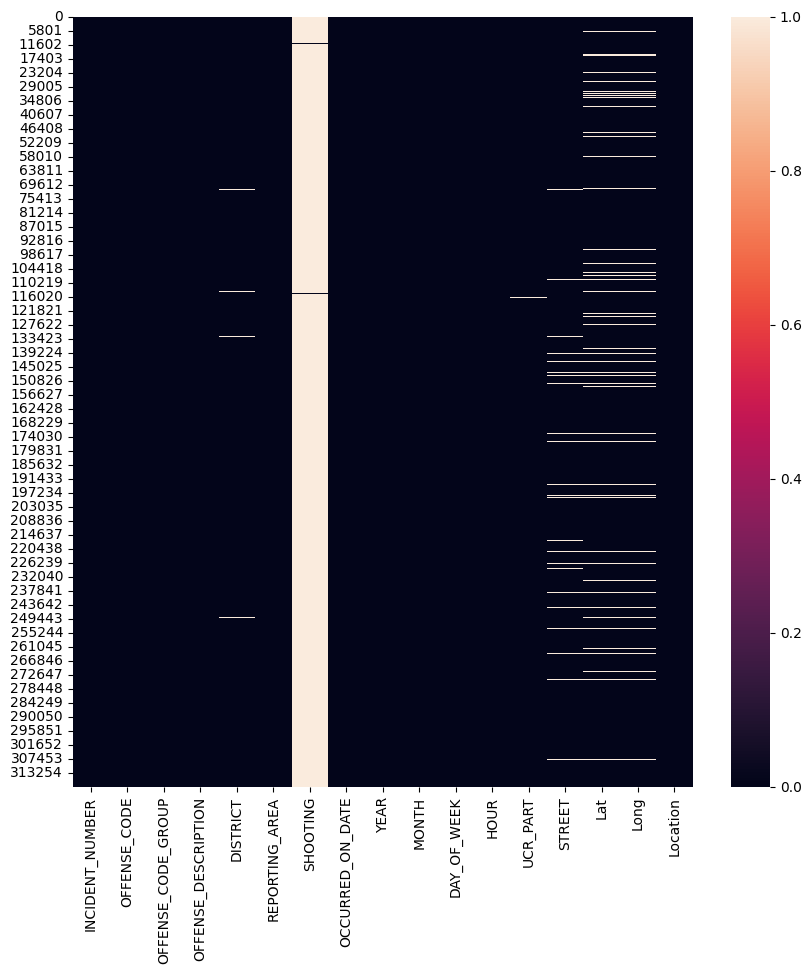

In [17]:
plt.figure(figsize=(10,10))
sns.heatmap(df[['INCIDENT_NUMBER',
                   'OFFENSE_CODE',
                   'OFFENSE_CODE_GROUP',
                   'OFFENSE_DESCRIPTION',
                   'DISTRICT',
                   'REPORTING_AREA',
                   'SHOOTING',
                   'OCCURRED_ON_DATE',
                   'YEAR',
                   'MONTH',
                   'DAY_OF_WEEK',
                   'HOUR',
                   'UCR_PART',
                   'STREET',
                   'Lat',
                   'Long',
                   'Location']].isna())


Secara umum penanganan missing value memiliki beberapa cara, pertama menghapus baris/kolom yang berisi missing value, namun cara ini tidak disarankan untuk menangani dataset kita.
Kedua, yaitu dengan mengisi data yang hilang, cara ini lebih disarankan. Ada beberapa metode yang bisa digunakan untuk mengisi missing value, cara yang paling baik adalah dengan mengisi data yang hilang dengan nilai sebenarnya atau nilai yang mendekati. Dalam kasus ini, kita akan mencoba mengisi missing value berdasarkan kolom lain yang secara domain knowledge memiliki makna yang hampir sama (misalnya district, street, dll). Jika masih ada kolom yang tidak bisa diisi, kita bisa mengisi dengan angka mean, median, atau modus. Sedangkan drop field menjadi pilihan terakhir.


Dari graph di atas kita menemukan fakta bahwa seluruh missing values bernilai di bawah 20%, kecuali kolom shooting. 
Apabila kita menggunakan prinsip pareto (20% persen object berpengaruh pada 80% lainnya), maka dapat diasumsikan missing values yang ada tidak akan memiliki pengaruh signifikan, sehingga tidak perlu kita drop. Namun untuk kolom shooting harus kita telaah lebih lanjut.

Penjalasan lebih rinci adalah sebagai berikut:

* District (0.55%): karena presentasi missing values di sini masih sangat kecil, maka kita jangan melakukan drop pada field tersebut, melainkan mengisi dengan value yang lain.

* Latitude & Longitude (6.26%) : jika dilihat dari presentasenya, missing values pada lat dan long berjumlah sama, atau tidak pincang / tidak berat sebelah, sehingga hampir dipastikan bahwa setiap lat memiliki pasangan pada field long. Selain itu sebaiknya kedua field tersebut tidak di-drop karena presentasenya masih sangat kecil. Kita juga bisa mempertimbangkan untuk melakukan pengisian missing values berdasarkan referensi yang ada pada Street ataupun District (karena adanya potensi untuk saling berkaitan)

* Street (3.41%): karena presentasi missing values di sini masih sangat kecil, maka kita jangan melakukan drop pada field tersebut, melainkan mengisi dengan value yang lain.  Kita juga bisa mempertimbangkan untuk melakukan pengisian missing values berdasarkan referensi yang ada pada Lat, Long, ataupun District (karena adanya potensi untuk saling berkaitan)

* Shooting (99.68%): Field ini seharusnya bersifat dikotomi, karena hanya memiliki jawaban YES atau NO, maka dari itu untuk missing values dapat kita asumsikan bahwa tidak terjadi penembakan (NO)

* UCR Part (0.03%): Dikarenakan jumlah missing value sangat kecil, maka dimasukkan value nan

**PENANGANGAN TIAP FIELD** (DCM-PTF)

* Field INCIDENT_NUMBER (DCM-PTF-INC)

Pada tahap ini kita perlu memastikan bahwa format penulisan di field INCIDENT_NUMBER sudah sesuai / konsisten,
yaitu dengan cara memastikan bahwa setiap data diawali dengan huruf 'I', selain itu format penulisan dan jumlah digitnya benar.

In [18]:
cek_kapital = len(df[df['INCIDENT_NUMBER'].str.contains('I') == False])
print(f"Ditemukan sejumlah {cek_kapital} data yang tidak diawali dengan huruf 'I'")

Ditemukan sejumlah 1 data yang tidak diawali dengan huruf 'I'


In [19]:
cek_format = len(df[df['INCIDENT_NUMBER'].str.contains('I\d{9}-\d{2}')])
print(f"Ditemukan sejumlah {cek_format} data yang memiliki pola 'I' NNNNNNNNN-NN ('N' adalah number)'")


Ditemukan sejumlah 330 data yang memiliki pola 'I' NNNNNNNNN-NN ('N' adalah number)'


Revisi data yang tidak sesuai, mengubah dengan karakter I pada awal value.

In [20]:

df['INCIDENT_NUMBER'] = df['INCIDENT_NUMBER'].replace(['142052550'],'I142052550')
df[df['INCIDENT_NUMBER'].str.contains('142052550')]


,INCIDENT_NUMBER,OFFENSE_CODE,OFFENSE_CODE_GROUP,OFFENSE_DESCRIPTION,DISTRICT,REPORTING_AREA,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,HOUR,UCR_PART,STREET,Lat,Long,Location
319049,I142052550,3125,Warrant Arrests,WARRANT ARREST,D4,903,NaN,2015-06-22 00:12:00,2015,6,Monday,0,Part Three,WASHINGTON ST,42.333839,-71.08029,"(42.33383935, -71.08029038)"


Memastikan formatnnya 'I\d{9}'

In [21]:
df['INCIDENT_NUMBER'] = df['INCIDENT_NUMBER'].apply(lambda string : string[:10])
df[df['INCIDENT_NUMBER'].str.contains('I\d{9}')].sample(10)

,INCIDENT_NUMBER,OFFENSE_CODE,OFFENSE_CODE_GROUP,OFFENSE_DESCRIPTION,DISTRICT,REPORTING_AREA,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,HOUR,UCR_PART,STREET,Lat,Long,Location
271610,I152101715,1102,Fraud,FRAUD - FALSE PRETENSE / SCHEME,E18,957,NaN,2015-12-09 14:29:00,2015,12,Wednesday,14,Part Two,CLIFFMONT ST,42.276682,-71.120653,"(42.27668221, -71.12065268)"
34517,I182033824,2662,Ballistics,BALLISTICS EVIDENCE/FOUND,B2,268,NaN,2018-05-05 01:02:00,2018,5,Saturday,1,Part Two,ADAMS ST,42.328740,-71.076244,"(42.32873966, -71.07624439)"
112715,I172058178,3502,Missing Person Located,MISSING PERSON - LOCATED,C11,344,NaN,2017-07-18 13:17:00,2017,7,Tuesday,13,Part Three,CORONA ST,42.301462,-71.068960,"(42.30146198, -71.06895960)"
218943,I162050653,1106,Confidence Games,FRAUD - CREDIT CARD / ATM FRAUD,C6,207,NaN,2016-06-26 00:34:00,2016,6,Sunday,0,Part Two,NORTHERN AVE,42.347785,-71.036189,"(42.34778480, -71.03618949)"
294877,I152076220,3301,Verbal Disputes,VERBAL DISPUTE,B3,467,NaN,2015-09-13 20:51:00,2015,9,Sunday,20,Part Three,WESTMORE RD,42.284692,-71.096215,"(42.28469164, -71.09621548)"
127423,I172042467,520,Residential Burglary,BURGLARY - RESIDENTIAL - FORCE,B3,454,NaN,2017-05-25 17:00:00,2017,5,Thursday,17,Part One,HARVARD ST,42.299015,-71.074818,"(42.29901488, -71.07481814)"
253256,I162013764,3207,Property Found,PROPERTY - FOUND,A1,122,NaN,2016-02-21 10:28:00,2016,2,Sunday,10,Part Three,TREMONT ST,42.350799,-71.065008,"(42.35079907, -71.06500775)"
141033,I172027820,614,Larceny From Motor Vehicle,LARCENY THEFT FROM MV - NON-ACCESSORY,D4,170,NaN,2017-04-10 10:58:00,2017,4,Monday,10,Part One,MASSACHUSETTS AVE,42.335621,-71.075824,"(42.33562126, -71.07582361)"
253656,I162013354,2900,Other,VAL - VIOLATION OF AUTO LAW - OTHER,B2,909,NaN,2016-02-19 19:41:00,2016,2,Friday,19,Part Two,CABOT ST,42.333382,-71.087454,"(42.33338200, -71.08745421)"
162881,I172004544,3301,Verbal Disputes,VERBAL DISPUTE,B3,450,NaN,2017-01-17 22:04:00,2017,1,Tuesday,22,Part Three,WHITFIELD ST,42.292760,-71.074866,"(42.29276044, -71.07486603)"


Kemudian mari kita cek apakah ada data INCIDENT_NUMBER yang duplikat atau tidak, secara fungsi field ini merepresentasikan nomor unik setiap kejadian yang dicatat oleh staf polisi atas sebuah tindak kriminalitas. 
Maka dari itu, perlu dilakukan cek duplikasi data atas kolom ini sebelum digunakan sebagai index dataset.

In [22]:
cek_dupli=df[df['INCIDENT_NUMBER'].duplicated()==True].sort_values('INCIDENT_NUMBER')
cek_dupli

,INCIDENT_NUMBER,OFFENSE_CODE,OFFENSE_CODE_GROUP,OFFENSE_DESCRIPTION,DISTRICT,REPORTING_AREA,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,HOUR,UCR_PART,STREET,Lat,Long,Location
319047,I030217815,3125,Warrant Arrests,WARRANT ARREST,E18,520,NaN,2015-07-09 13:38:00,2015,7,Thursday,13,Part Three,RIVER ST,42.255926,-71.123172,"(42.25592648, -71.12317207)"
319044,I060168073,3125,Warrant Arrests,WARRANT ARREST,E13,912,NaN,2018-01-27 14:01:00,2018,1,Saturday,14,Part Three,CENTRE ST,42.322838,-71.100967,"(42.32283759, -71.10096723)"
319041,I080542626,1848,Drug Violation,DRUGS - POSS CLASS B - INTENT TO MFR DIST DISP,A1,111,NaN,2015-08-12 12:00:00,2015,8,Wednesday,12,Part Two,BOYLSTON ST,42.352312,-71.063705,"(42.35231190, -71.06370510)"
319042,I080542626,1849,Drug Violation,"DRUGS - POSS CLASS B - COCAINE, ETC.",A1,111,NaN,2015-08-12 12:00:00,2015,8,Wednesday,12,Part Two,BOYLSTON ST,42.352312,-71.063705,"(42.35231190, -71.06370510)"
319039,I090317057,3125,Warrant Arrests,WARRANT ARREST,B3,458,NaN,2015-11-20 11:15:00,2015,11,Friday,11,Part Three,BLUE HILL AVE,42.301897,-71.085549,"(42.30189690, -71.08554944)"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
56,I182070873,3106,Property Related Damage,PROPERTY - ACCIDENTAL DAMAGE,B2,327,NaN,2018-09-03 15:38:00,2018,9,Monday,15,Part Three,WAYLAND ST,42.313689,-71.074271,"(42.31368925, -71.07427080)"
53,I182070875,2405,Disorderly Conduct,DISORDERLY CONDUCT,A1,116,NaN,2018-09-03 16:55:00,2018,9,Monday,16,Part Two,BEACH ST,42.351084,-71.059395,"(42.35108400, -71.05939500)"
41,I182070889,1841,Drug Violation,DRUGS - POSS CLASS A - INTENT TO MFR DIST DISP,NaN,,NaN,2018-09-03 18:05:00,2018,9,Monday,18,Part Two,NaN,42.306769,-71.084319,"(42.30676881, -71.08431925)"
40,I182070889,3125,Warrant Arrests,WARRANT ARREST,NaN,,NaN,2018-09-03 18:05:00,2018,9,Monday,18,Part Three,NaN,42.306769,-71.084319,"(42.30676881, -71.08431925)"


Kolom INCIDENT_NUMBER dapat mewakili dua atau lebih tindak kriminal yang berbeda sesuai nomor UCR.
Maka dilakukan filter kembali untuk INCIDENT_NUMBER yang mempunyai UCR_PART yang sama.

In [23]:

pd.crosstab(index=cek_dupli['INCIDENT_NUMBER'],columns=cek_dupli['UCR_PART'])

UCR_PART,Other,Part One,Part Three,Part Two
INCIDENT_NUMBER,,,,
I030217815,0,0,1,0
I060168073,0,0,1,0
I080542626,0,0,0,2
I090317057,0,0,1,0
I100033064,0,0,0,1
...,...,...,...,...
I182070837,0,0,1,0
I182070873,0,0,1,0
I182070875,0,0,0,1


Ini adalah contoh INCIDENT_NUMBER yang memiliki lebih dari satu row

In [24]:
df[df['INCIDENT_NUMBER']=='I080542626']


,INCIDENT_NUMBER,OFFENSE_CODE,OFFENSE_CODE_GROUP,OFFENSE_DESCRIPTION,DISTRICT,REPORTING_AREA,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,HOUR,UCR_PART,STREET,Lat,Long,Location
319040,I080542626,3125,Warrant Arrests,WARRANT ARREST,A1,111,NaN,2015-08-12 12:00:00,2015,8,Wednesday,12,Part Three,BOYLSTON ST,42.352312,-71.063705,"(42.35231190, -71.06370510)"
319041,I080542626,1848,Drug Violation,DRUGS - POSS CLASS B - INTENT TO MFR DIST DISP,A1,111,NaN,2015-08-12 12:00:00,2015,8,Wednesday,12,Part Two,BOYLSTON ST,42.352312,-71.063705,"(42.35231190, -71.06370510)"
319042,I080542626,1849,Drug Violation,"DRUGS - POSS CLASS B - COCAINE, ETC.",A1,111,NaN,2015-08-12 12:00:00,2015,8,Wednesday,12,Part Two,BOYLSTON ST,42.352312,-71.063705,"(42.35231190, -71.06370510)"


Dari sample data di atas dapat diartikan bahwa tiap satu incident number bisa terjadi beberapa offense_code, maka agar lebih unik sebaiknya field indident_number harus digabung dengan offense_code (semacam composite key), mari kita gabung kedual field tersebut dengan field baru yang bernama COMPOSITE_KEY

In [25]:
df.insert(1,'COMPOSITE_KEY',df['INCIDENT_NUMBER'].astype(str)+'-'+df['OFFENSE_CODE'].astype(str))



In [26]:
df[df['COMPOSITE_KEY'].duplicated()==True]

,INCIDENT_NUMBER,COMPOSITE_KEY,OFFENSE_CODE,OFFENSE_CODE_GROUP,OFFENSE_DESCRIPTION,DISTRICT,REPORTING_AREA,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,HOUR,UCR_PART,STREET,Lat,Long,Location
82376,I172090479,I172090479-3115,3115,Investigate Person,INVESTIGATE PERSON,A1,104,NaN,2017-10-29 16:52:00,2017,10,Sunday,16,Part Three,WASHINGTON ST,42.356486,-71.059281,"(42.35648631, -71.05928145)"
318723,I152041086,I152041086-2407,2407,Disorderly Conduct,ANNOYING AND ACCOSTIN,A1,111,NaN,2015-08-17 13:00:00,2015,8,Monday,13,Part Two,BOYLSTON ST,42.352368,-71.064543,"(42.35236776, -71.06454338)"
318751,I152026775,I152026775-3115,3115,INVESTIGATE PERSON,INVESTIGATE PERSON,C6,936,NaN,2015-10-19 16:04:00,2015,10,Monday,16,NaN,ORTON-MAROTTA WAY,42.338573,-71.055755,"(42.33857289, -71.05575501)"
318795,I152000618,I152000618-1503,1503,Firearm Violations,"WEAPON - OTHER - CARRYING / POSSESSING, ETC",B2,308,NaN,2015-07-20 18:48:00,2015,7,Monday,18,Part Two,BOWER ST,42.319968,-71.087150,"(42.31996758, -71.08715022)"
318847,I142033219,I142033219-1842,1842,Drug Violation,"DRUGS - POSS CLASS A - HEROIN, ETC.",D4,171,NaN,2016-01-04 17:20:00,2016,1,Monday,17,Part Two,HARRISON AVE,42.335119,-71.074917,"(42.33511904, -71.07491710)"
318875,I142020701,I142020701-802,802,Simple Assault,ASSAULT & BATTERY,C11,337,NaN,2015-10-14 01:00:00,2015,10,Wednesday,1,Part Two,COLUMBIA RD,42.306451,-71.077304,"(42.30645148, -71.07730382)"
318882,I142016089,I142016089-613,613,Larceny,LARCENY SHOPLIFTING $200 & OVER,C11,388,NaN,2015-10-10 09:30:00,2015,10,Saturday,9,Part One,DORCHESTER AVE,42.278399,-71.066363,"(42.27839920, -71.06636305)"
318946,I130731947,I130731947-2405,2405,Disorderly Conduct,DISORDERLY PERSON,D4,172,NaN,2015-07-22 22:00:00,2015,7,Wednesday,22,Part Two,MASSACHUSETTS AVE,42.333391,-71.073120,"(42.33339068, -71.07312006)"
318976,I130194606,I130194606-617,617,Larceny,LARCENY THEFT FROM BUILDING,D4,136,NaN,2016-02-02 19:30:00,2016,2,Tuesday,19,Part One,COMMONWEALTH AVE,42.351153,-71.081614,"(42.35115300, -71.08161374)"
318977,I130194606,I130194606-3115,3115,Investigate Person,INVESTIGATE PERSON,D4,136,NaN,2016-02-02 19:30:00,2016,2,Tuesday,19,Part Three,COMMONWEALTH AVE,42.351153,-71.081614,"(42.35115300, -71.08161374)"


Mari kita ambil beberapa contoh untuk memastikan bahwa terdapat COMPOSITE_KEY yang duplikat

In [27]:
df[df['COMPOSITE_KEY']=='I142016089-613']

,INCIDENT_NUMBER,COMPOSITE_KEY,OFFENSE_CODE,OFFENSE_CODE_GROUP,OFFENSE_DESCRIPTION,DISTRICT,REPORTING_AREA,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,HOUR,UCR_PART,STREET,Lat,Long,Location
318881,I142016089,I142016089-613,613,Larceny,LARCENY SHOPLIFTING,C11,388,NaN,2015-10-10 09:30:00,2015,10,Saturday,9,Part One,DORCHESTER AVE,42.278399,-71.066363,"(42.27839920, -71.06636305)"
318882,I142016089,I142016089-613,613,Larceny,LARCENY SHOPLIFTING $200 & OVER,C11,388,NaN,2015-10-10 09:30:00,2015,10,Saturday,9,Part One,DORCHESTER AVE,42.278399,-71.066363,"(42.27839920, -71.06636305)"


In [28]:
df[df['COMPOSITE_KEY']=='I172090479-3115']

,INCIDENT_NUMBER,COMPOSITE_KEY,OFFENSE_CODE,OFFENSE_CODE_GROUP,OFFENSE_DESCRIPTION,DISTRICT,REPORTING_AREA,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,HOUR,UCR_PART,STREET,Lat,Long,Location
82375,I172090479,I172090479-3115,3115,INVESTIGATE PERSON,INVESTIGATE PERSON,A1,104,NaN,2017-10-29 16:52:00,2017,10,Sunday,16,NaN,WASHINGTON ST,42.356486,-71.059281,"(42.35648631, -71.05928145)"
82376,I172090479,I172090479-3115,3115,Investigate Person,INVESTIGATE PERSON,A1,104,NaN,2017-10-29 16:52:00,2017,10,Sunday,16,Part Three,WASHINGTON ST,42.356486,-71.059281,"(42.35648631, -71.05928145)"


Contoh yang tidak duplikat

In [29]:
df[df['COMPOSITE_KEY']=='I030217815-3125']

,INCIDENT_NUMBER,COMPOSITE_KEY,OFFENSE_CODE,OFFENSE_CODE_GROUP,OFFENSE_DESCRIPTION,DISTRICT,REPORTING_AREA,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,HOUR,UCR_PART,STREET,Lat,Long,Location
319047,I030217815,I030217815-3125,3125,Warrant Arrests,WARRANT ARREST,E18,520,NaN,2015-07-09 13:38:00,2015,7,Thursday,13,Part Three,RIVER ST,42.255926,-71.123172,"(42.25592648, -71.12317207)"


Drop data duplikat

In [30]:
df.drop_duplicates(subset='COMPOSITE_KEY',keep='last',inplace=True)
df[df['COMPOSITE_KEY'].duplicated()==True]

,INCIDENT_NUMBER,COMPOSITE_KEY,OFFENSE_CODE,OFFENSE_CODE_GROUP,OFFENSE_DESCRIPTION,DISTRICT,REPORTING_AREA,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,HOUR,UCR_PART,STREET,Lat,Long,Location


Cek kembali

In [31]:


df[df['COMPOSITE_KEY']=='I172090479-3115']

,INCIDENT_NUMBER,COMPOSITE_KEY,OFFENSE_CODE,OFFENSE_CODE_GROUP,OFFENSE_DESCRIPTION,DISTRICT,REPORTING_AREA,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,HOUR,UCR_PART,STREET,Lat,Long,Location
82376,I172090479,I172090479-3115,3115,Investigate Person,INVESTIGATE PERSON,A1,104,NaN,2017-10-29 16:52:00,2017,10,Sunday,16,Part Three,WASHINGTON ST,42.356486,-71.059281,"(42.35648631, -71.05928145)"


Setelah itu kita drop field COMPOSITE_KEY, karena seluruh record incident_number + offense_code yang sama sudah kita hapus.

In [32]:
df.drop(["COMPOSITE_KEY"], axis = 1, inplace = True)

In [33]:
df

,INCIDENT_NUMBER,OFFENSE_CODE,OFFENSE_CODE_GROUP,OFFENSE_DESCRIPTION,DISTRICT,REPORTING_AREA,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,HOUR,UCR_PART,STREET,Lat,Long,Location
0,I182070945,619,Larceny,LARCENY ALL OTHERS,D14,808,NaN,2018-09-02 13:00:00,2018,9,Sunday,13,Part One,LINCOLN ST,42.357791,-71.139371,"(42.35779134, -71.13937053)"
1,I182070943,1402,Vandalism,VANDALISM,C11,347,NaN,2018-08-21 00:00:00,2018,8,Tuesday,0,Part Two,HECLA ST,42.306821,-71.060300,"(42.30682138, -71.06030035)"
2,I182070941,3410,Towed,TOWED MOTOR VEHICLE,D4,151,NaN,2018-09-03 19:27:00,2018,9,Monday,19,Part Three,CAZENOVE ST,42.346589,-71.072429,"(42.34658879, -71.07242943)"
3,I182070940,3114,Investigate Property,INVESTIGATE PROPERTY,D4,272,NaN,2018-09-03 21:16:00,2018,9,Monday,21,Part Three,NEWCOMB ST,42.334182,-71.078664,"(42.33418175, -71.07866441)"
4,I182070938,3114,Investigate Property,INVESTIGATE PROPERTY,B3,421,NaN,2018-09-03 21:05:00,2018,9,Monday,21,Part Three,DELHI ST,42.275365,-71.090361,"(42.27536542, -71.09036101)"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
319045,I050310906,3125,Warrant Arrests,WARRANT ARREST,D4,285,NaN,2016-06-05 17:25:00,2016,6,Sunday,17,Part Three,COVENTRY ST,42.336951,-71.085748,"(42.33695098, -71.08574813)"
319046,I030217815,111,Homicide,"MURDER, NON-NEGLIGIENT MANSLAUGHTER",E18,520,NaN,2015-07-09 13:38:00,2015,7,Thursday,13,Part One,RIVER ST,42.255926,-71.123172,"(42.25592648, -71.12317207)"
319047,I030217815,3125,Warrant Arrests,WARRANT ARREST,E18,520,NaN,2015-07-09 13:38:00,2015,7,Thursday,13,Part Three,RIVER ST,42.255926,-71.123172,"(42.25592648, -71.12317207)"
319048,I010370257,3125,Warrant Arrests,WARRANT ARREST,E13,569,NaN,2016-05-31 19:35:00,2016,5,Tuesday,19,Part Three,NEW WASHINGTON ST,42.302333,-71.111565,"(42.30233307, -71.11156487)"


* Field OFFENSE_CODE (DCM-PTF-OFC)

Tampilkan OFFENSE_CODE yang duplicate

In [34]:
OC_DUPLI = df.groupby(['OFFENSE_CODE','OFFENSE_DESCRIPTION']).count().sort_values(['OFFENSE_CODE','INCIDENT_NUMBER'],ascending=[True, False])['INCIDENT_NUMBER'].to_frame().reset_index()
OC_DUPLI[OC_DUPLI['OFFENSE_CODE'].duplicated(keep=False)]

,OFFENSE_CODE,OFFENSE_DESCRIPTION,INCIDENT_NUMBER
19,413,ASSAULT - AGGRAVATED - BATTERY,4886
20,413,ASSAULT D/W - OTHER,1
21,423,ASSAULT - AGGRAVATED,2910
22,423,ASSAULT & BATTERY D/W - OTHER ON POLICE OFFICER,1
27,522,BURGLARY - RESIDENTIAL - NO FORCE,2357
28,522,B&E RESIDENCE DAY - NO FORCE,1
31,540,BURGLARY - COMMERICAL - FORCE,912
32,540,B&E NON-RESIDENCE DAY - FORCIBLE,2
34,542,BURGLARY - COMMERICAL - NO FORCE,308
35,542,B&E NON-RESIDENCE DAY - NO FORCE,2


Dari tabel di atas kita melihat bahwa satu OFFENSE_CODE memiliki beberapa OFFENSE_DESCRIPTION, namun jika kita perhatikan lebih detil, value yang ada dalam OFFICE_DESCRIPTION memiliki arti yang sama.Misalnya 'ANNOYING AND ACCOSTING' dan 'ANNOYING AND ACCOSTIN'  atau 'AUTO THEFT - LEASED/RENTED VEHICLE' dan 'AUTO THEFT LEASE/RENT VEHICLE', data tersebut memiliki arti yang sama, tetapi karena penulisan yang inkonsisten dan typo, oleh sistem dianggap 2 record yang berbeda.

Maka dari itu kita perlu filterasi lebih lanjut.

Pertama, kita ambil kode dan deskripsi yang terbanyak untuk setiap duplikasi OFFENSE_CODE kemudian kita simpan dalam list

In [35]:

correct_code = list(OC_DUPLI[OC_DUPLI['OFFENSE_CODE'].duplicated(keep='last')]['OFFENSE_CODE'])
correct_description = list(OC_DUPLI[OC_DUPLI['OFFENSE_CODE'].duplicated(keep='last')]['OFFENSE_DESCRIPTION'])
correct_description

['ASSAULT - AGGRAVATED - BATTERY',
 'ASSAULT - AGGRAVATED',
 'BURGLARY - RESIDENTIAL - NO FORCE',
 'BURGLARY - COMMERICAL - FORCE',
 'BURGLARY - COMMERICAL - NO FORCE',
 'LARCENY SHOPLIFTING',
 'LARCENY THEFT FROM MV - NON-ACCESSORY',
 'LARCENY THEFT OF BICYCLE',
 'LARCENY THEFT FROM BUILDING',
 'LARCENY ALL OTHERS',
 'AUTO THEFT - LEASED/RENTED VEHICLE',
 'RECOVERED - MV RECOVERED IN BOSTON (STOLEN OUTSIDE BOSTON)',
 'ASSAULT SIMPLE - BATTERY',
 'FORGERY / COUNTERFEITING',
 'FRAUD - FALSE PRETENSE / SCHEME',
 'WEAPON - FIREARM - CARRYING / POSSESSING, ETC',
 'WEAPON - OTHER - CARRYING / POSSESSING, ETC',
 'PROSTITUTION - COMMON NIGHTWALKER',
 'DRUGS - POSS CLASS A - HEROIN, ETC. ',
 'DRUGS - POSS CLASS D - INTENT TO MFR DIST DISP',
 'CHILD ENDANGERMENT (NO ASSAULT)',
 'VIOL. OF RESTRAINING ORDER W ARREST',
 'DISORDERLY CONDUCT',
 'ANNOYING AND ACCOSTING']

Lalu ubah deskripsi OFFENSE_CODE duplikat dengan deskripsi yang tepat

In [36]:
for code, description in zip(correct_code, correct_description):
    df['OFFENSE_DESCRIPTION'].mask(df['OFFENSE_CODE'] == code, description, inplace=True)

Tampilkan kembali, apakah masih ada OFFENSE_CODE dengan OFFENSE_DESCRIPTION yang berbeda

In [37]:
OC_DUPLI = df.groupby(['OFFENSE_CODE','OFFENSE_DESCRIPTION']).count().sort_values(['OFFENSE_CODE','INCIDENT_NUMBER'],ascending=[True, False])['INCIDENT_NUMBER'].to_frame().reset_index()
OC_DUPLI[OC_DUPLI['OFFENSE_CODE'].duplicated(keep=False)]

,OFFENSE_CODE,OFFENSE_DESCRIPTION,INCIDENT_NUMBER


Selanjutnya kita ubah 'HOME INVASION' menjadi 'ROBBERY - HOME INVASION' karena memiliki arti yang sama

In [38]:
df['OFFENSE_DESCRIPTION'] = df['OFFENSE_DESCRIPTION'].replace(['HOME INVASION'],'ROBBERY - HOME INVASION')

words_list = list(df['OFFENSE_DESCRIPTION'].unique())
[word for word in words_list if 'HOME INVASION' in word]

['ROBBERY - HOME INVASION']

Ubah Home Invasion menjadi Robbery, lalu cek apakah data tersebut masih ada di OFFENSE_CODE_GROUP

In [39]:
df['OFFENSE_CODE_GROUP'] = df['OFFENSE_CODE_GROUP'].replace(['HOME INVASION'],'Robbery')

df[df['OFFENSE_CODE_GROUP'].str.contains('HOME INVASION')]

,INCIDENT_NUMBER,OFFENSE_CODE,OFFENSE_CODE_GROUP,OFFENSE_DESCRIPTION,DISTRICT,REPORTING_AREA,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,HOUR,UCR_PART,STREET,Lat,Long,Location


Lalu ubah beberapa description yang typo, dan ubah menjadi Capitalized Each Word

In [40]:
df['OFFENSE_CODE_GROUP'] = df['OFFENSE_CODE_GROUP'].apply(lambda words : words.title())

df['OFFENSE_CODE_GROUP'].unique()

array(['Larceny', 'Vandalism', 'Towed', 'Investigate Property',
       'Motor Vehicle Accident Response', 'Auto Theft', 'Verbal Disputes',
       'Robbery', 'Fire Related Reports', 'Other', 'Property Lost',
       'Medical Assistance', 'Assembly Or Gathering Violations',
       'Larceny From Motor Vehicle', 'Residential Burglary',
       'Simple Assault', 'Restraining Order Violations', 'Violations',
       'Harassment', 'Ballistics', 'Property Found',
       'Police Service Incidents', 'Drug Violation', 'Warrant Arrests',
       'Disorderly Conduct', 'Property Related Damage',
       'Missing Person Reported', 'Investigate Person', 'Fraud',
       'Aggravated Assault', 'License Plate Related Incidents',
       'Firearm Violations', 'Other Burglary', 'Arson', 'Bomb Hoax',
       'Harbor Related Incidents', 'Counterfeiting', 'Liquor Violation',
       'Firearm Discovery', 'Landlord/Tenant Disputes',
       'Missing Person Located', 'Auto Theft Recovery', 'Service',
       'Operating Und

* Field DISTRICT (DCM-PTF-DIS)

Pada tahap ini kita mengubah kode yang ada pada field DISTRICT menjadi full name distrik, penamaan bersumber dari informasi nama distrik yang diperoleh dari situs resmi Boston Police Department.

In [41]:
df['DISTRICT'].unique()

array(['D14', 'C11', 'D4', 'B3', 'B2', 'C6', nan, 'A1', 'E5', 'A7', 'E13',
       'E18', 'A15'], dtype=object)

Berikut adalah function untuk konversi kode menjadi full name.

District A1 = Downtown,
District A7 = East Boston,
District A15 = Charlestown,
District B2 = Roxbury,
District B3 = Mattapan,
District C6 = South Boston,
District C11 = Dorchester,
District D4 = South End,
District D14 = Brighton,
District E5 = West Roxbury,
District E13 = Jamaica Plain,
District E18 = Hyde Park

In [42]:
def districtName(x):
    if x=='A1':
        return 'Downtown'
    elif x=='A7':
        return 'East Boston'
    elif x=='A15':
        return 'Charlestown'
    elif x=='B2':
        return 'Roxbury'
    elif x=='B3':
        return 'Mattapan'
    elif x=='C6':
        return 'South Boston'
    elif x=='C11':
        return 'Dorchester'
    elif x=='D4':
        return 'South End'
    elif x=='D14':
        return 'Brighton'
    elif x=='E5':
        return 'West Roxbury'
    elif x=='E13':
        return 'Jamaica Plain'
    else:
        return 'Hyde Park'

In [43]:
df['districtNumber']=df['DISTRICT']
df['DISTRICT']=df['districtNumber'].apply(districtName)

Data sudah berhasil dikonversi

In [44]:
df['DISTRICT'].unique()

array(['Brighton', 'Dorchester', 'South End', 'Mattapan', 'Roxbury',
       'South Boston', 'Hyde Park', 'Downtown', 'West Roxbury',
       'East Boston', 'Jamaica Plain', 'Charlestown'], dtype=object)

Setelah itu kita proses kembali untuk mengurangi missing values pada field DISTRICT dengan isian N/A

In [45]:
df['DISTRICT'].fillna('N/A',inplace=True)
df['districtNumber'].fillna('N/A',inplace=True)

* Field REPORTING_AREA (DCM-PTF-REP)

Pada tahap ini kita akan melakukan cleaning secara mendalam teruntuk field REPORTING AREA,

Pertama kita cek terlebih dahulu nilai REPORTING_AREA yang berisi 000, seperti yang kita ketahui bahwa value 000 bukanlah value yang tepat, karena tidak merujuk pada area manapun.

In [46]:
cek_RA = len(df[df['REPORTING_AREA']=='000'])
print(f"Terdapat {cek_RA} row Reporting Area dengan value '000'")

Terdapat 13 row Reporting Area dengan value '000'


In [47]:
df[df['REPORTING_AREA']=='000'].sample(5)

,INCIDENT_NUMBER,OFFENSE_CODE,OFFENSE_CODE_GROUP,OFFENSE_DESCRIPTION,DISTRICT,REPORTING_AREA,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,HOUR,UCR_PART,STREET,Lat,Long,Location,districtNumber
90832,I172081388,1842,Drug Violation,"DRUGS - POSS CLASS A - HEROIN, ETC.",Roxbury,000,NaN,2017-09-29 18:01:00,2017,9,Friday,18,Part Two,HILLSIDE ST,NaN,NaN,"(0.00000000, 0.00000000)",B2
90833,I172081388,3125,Warrant Arrests,WARRANT ARREST,Roxbury,000,NaN,2017-09-29 18:01:00,2017,9,Friday,18,Part Three,HILLSIDE ST,NaN,NaN,"(0.00000000, 0.00000000)",B2
246158,I162021504,2905,Violations,VAL - OPERATING WITHOUT LICENSE,East Boston,000,NaN,2016-03-19 16:19:00,2016,3,Saturday,16,Part Two,EAGLE SQ,NaN,NaN,"(0.00000000, 0.00000000)",A7
141131,I172027719,1402,Vandalism,VANDALISM,Brighton,000,NaN,2017-04-09 23:21:00,2017,4,Sunday,23,Part Two,CRESCENT,-1.0,-1.0,"(-1.00000000, -1.00000000)",D14
123175,I172047055,3125,Warrant Arrests,WARRANT ARREST,South Boston,000,NaN,2017-06-13 09:52:00,2017,6,Tuesday,9,Part Three,NEWMARKET SQ,NaN,NaN,"(0.00000000, 0.00000000)",C6


Selanjutnya RA yang bernilai 000 kita ubah menjadi NaN

In [48]:
df['REPORTING_AREA'] = df['REPORTING_AREA'].replace(['000'],np.nan)

Cek kembali

In [49]:
df[df['REPORTING_AREA']=='000']

,INCIDENT_NUMBER,OFFENSE_CODE,OFFENSE_CODE_GROUP,OFFENSE_DESCRIPTION,DISTRICT,REPORTING_AREA,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,HOUR,UCR_PART,STREET,Lat,Long,Location,districtNumber


Tugas kita selanjutanya adalah mengubah data yang WhiteSPACE MENJADI NaN, secara teknis kita bisa menggunakan fungsi regex / regular expression.

In [50]:
df['REPORTING_AREA'] = df['REPORTING_AREA'].replace(r'^\s*$', np.nan, regex=True)

Cek kembali apakah masih ada data whitespace atau tidak.

In [51]:
df[df['REPORTING_AREA']==' ']

,INCIDENT_NUMBER,OFFENSE_CODE,OFFENSE_CODE_GROUP,OFFENSE_DESCRIPTION,DISTRICT,REPORTING_AREA,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,HOUR,UCR_PART,STREET,Lat,Long,Location,districtNumber


Kemudian untuk sisa missing values pada kolom ReportingArea, mari kita referensikan dengan Field LAT dan LONG. Maka dari itu kita akan cek apakah missing value ini salin berkaitan.

In [52]:
df[['REPORTING_AREA','Lat','Long']].isna().sum()

REPORTING_AREA    20263
Lat               19998
Long              19998
dtype: int64

In [53]:

df[df['REPORTING_AREA'].isna()]['Lat'].value_counts().to_frame()

,Lat
-1.000000,698
42.332547,107
42.355475,55
42.331194,54
42.333626,53
...,...
42.326388,1
42.269345,1
42.320617,1
42.330412,1


Ternyata setelah kita cek, kebanyakan data kosong di kolong ReportingArea tidak memiliki data juga di field Lat ataupun Long, sehingga kita bisa isi field RA dengan nilai N/A

In [54]:
df['REPORTING_AREA'].fillna('N/A',inplace=True)

Setelah kita cek kembali, tidak ada lagi missing values pada kolom reportingArea

In [55]:
df.isna().sum()

INCIDENT_NUMBER             0
OFFENSE_CODE                0
OFFENSE_CODE_GROUP          0
OFFENSE_DESCRIPTION         0
DISTRICT                    0
REPORTING_AREA              0
SHOOTING               318018
OCCURRED_ON_DATE            0
YEAR                        0
MONTH                       0
DAY_OF_WEEK                 0
HOUR                        0
UCR_PART                   87
STREET                  10871
Lat                     19998
Long                    19998
Location                    0
districtNumber              0
dtype: int64

* Field SHOOTING (code: DCM-PTF-SHO)

Karena missing values pada field SHOOTING sangat besar, maka field ini krusial untuk ditangani. Kita tahu bahwa field SHOOTING ini bersifat dikotomi / true false, maka kita bisa berasumsi bahwa nilai yang kosong dapat diisi dengan N / tidak terjadi penembakan.

In [56]:
df['SHOOTING'].fillna('N', inplace=True)

Graph setelah diupdate, terlihat bahwa missing value sudah terisi dengan nilai 'N' sebanyak 318018 baris atau setara dengan 99.68%

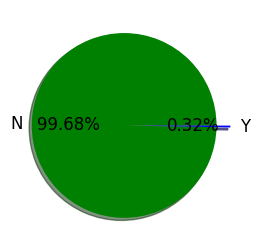

In [57]:
plt.figure(figsize=(4,3))
plt.pie(df['SHOOTING'].value_counts(),labels=df['SHOOTING'].unique(),
    colors=['g','b'],
    shadow=True,
    textprops={
        'size':12,
        'color':'black'
    },
    autopct='%1.2f%%',
    explode=(0.05,0.1))
plt.show()

In [58]:
display(df['SHOOTING'].value_counts(), df['SHOOTING'].value_counts().sum())

N    318018
Y      1019
Name: SHOOTING, dtype: int64

319037

* Field OCCURRED_ON_DATE (DCM-PTF-OOD)

Pada tahap ini kita memastikan seluruh value yang ada pada field OCCURRED_ON_DATE memiliki format 'yyyy-mm-dd hh:mm:ss'

In [59]:

OCCURRED_ON_DATE = ' '.join(list(df['OCCURRED_ON_DATE']))
words = OCCURRED_ON_DATE
pattern = r'\d{4}-\d{2}-\d{2}\s\d{2}:\d{2}:\d{2}'

n_baris = len(re.findall(pattern=pattern, string=words))
print(f"Terdapat {n_baris} row pada field OCCURRED_ON_DATE-nya dengan format 'yyyy-mm-dd hh:mm:ss'")

Terdapat 319037 row pada field OCCURRED_ON_DATE-nya dengan format 'yyyy-mm-dd hh:mm:ss'


Yang tidak kalah penting adalah mengubah tipe data pada field OCCURED_ON_DATE menjadi date_time, hal ini harus diubah karena apabila tipe object akan ada potensi error / tidak kompatibel dengan fungsi tertentu

In [60]:
df['OCCURRED_ON_DATE'] = pd.to_datetime(df['OCCURRED_ON_DATE'])

In [61]:
print(df['OCCURRED_ON_DATE'].dtypes)

datetime64[ns]


* Field UCR_PART (DCM-PTF-UCR)

Pada tahap ini tugas kita adalah memastikan klasifikasi yang terkandung pada field UCR sudah sesuai dengan [FBI](https://www2.fbi.gov/ucr/cius_04/appendices/appendix_02.html).
Pada halaman tersebut menjadi referensi bahwa UCR dibagi pada Part One, Part Two, dan Part Three (untuk pelanggaran selain Part I dan Part II).


Sebelumnya kita tampilkan rekap data pada field UCR_PART, pada proses kali ini harapannya kita dapat migrasi data pada kategori OTHER, masuk ke PART yang memungkinkan.

In [62]:
ucr = df['UCR_PART'].value_counts()
display(ucr, f"Presentase data yang terkandung dalam field 'Other' adalah {ucr[3]/len(df) * 100:.4f} % data")

Part Three    158536
Part Two       97557
Part One       61625
Other           1232
Name: UCR_PART, dtype: int64

"Presentase data yang terkandung dalam field 'Other' adalah 0.3862 % data"

Kemudian mari kita tampilkan jumlah data untuk tiap OFFENSE_CODE_GROUP pada UCR_PART 'Other'

In [63]:
df[df['UCR_PART']=='Other']['OFFENSE_CODE_GROUP'].value_counts()

Auto Theft Recovery                1051
Arson                                94
License Plate Related Incidents      67
Other                                10
Manslaughter                          8
Burglary - No Property Taken          2
Name: OFFENSE_CODE_GROUP, dtype: int64

Tampilkan yang mengandung kata 'Auto'

In [64]:
df[df['OFFENSE_CODE_GROUP'].str.contains('Auto')].groupby(['OFFENSE_CODE_GROUP','UCR_PART']).count()['INCIDENT_NUMBER']

OFFENSE_CODE_GROUP   UCR_PART
Auto Theft           Part One    4850
Auto Theft Recovery  Other       1051
Name: INCIDENT_NUMBER, dtype: int64

Tampilkan yang mengandung kata 'License'

In [65]:
df[df['OFFENSE_CODE_GROUP'].str.contains('License')].groupby(['OFFENSE_CODE_GROUP','UCR_PART']).count()['INCIDENT_NUMBER']

OFFENSE_CODE_GROUP               UCR_PART  
License Plate Related Incidents  Other           67
                                 Part Three     493
License Violation                Part Three    1701
Name: INCIDENT_NUMBER, dtype: int64

Tampilkan yang mengandung kata 'Burglary'

In [66]:
df[df['OFFENSE_CODE_GROUP'].str.contains('Burglary')].groupby(['OFFENSE_CODE_GROUP','UCR_PART']).count()['INCIDENT_NUMBER']

OFFENSE_CODE_GROUP            UCR_PART
Burglary - No Property Taken  Other          2
Commercial Burglary           Part One    1337
Other Burglary                Part One     461
Residential Burglary          Part One    5605
Name: INCIDENT_NUMBER, dtype: int64

Dapat kita simpulkan bahwa :
- 'Auto Theft' adalah UCR 'Part One', maka 'Auto Theft Recovery' dapat kita asumsikan untuk masuk ke dalam UCR 'Part One' juga
- 'License Plate Related Incidents' secara umum masuk pada 'Part Three', maka dari itu bisa kita pindahkan juga dari 'Other' ke 'Part Three'
- Secara umum 'Burglary' masuk ke dalam 'Part One',maka itu kita bisa memasukkan 'Burglary - No Property Taken' ke dalam 'Part One'
- Untuk 'Arson' dan 'Manslaughter' kita masukkan kedalam 'Part One' sesuai dengan domain knowledge berdasarkan sumber [FBI](https://www2.fbi.gov/ucr/cius_04/appendices/appendix_02.html)
- Sedangkan 'Other' akan kita masukkan ke dalam 'Part Three'



In [67]:
code_group = [['Auto Theft Recovery', 'Burglary - No Property Taken', 'Arson', 'Manslaughter'],['License Plate Related Incidents', 'Other']]
ucr = ['Part One', 'Part Three']

for code, part in zip(code_group, ucr) :
    df.loc[df['OFFENSE_CODE_GROUP'].isin(code), 'UCR_PART'] = part

In [68]:
df['UCR_PART'].value_counts()

Part Three    175700
Part Two       80470
Part One       62780
Name: UCR_PART, dtype: int64

Maka kategori Other sudah tidak ada

* Field LAT & LONG (DCM-PTF-LLG)

Pada field ini kita harus handling data yang bernilai -1. karena ini merupakan hal yang tidak mungkin dan berpotensi berpengaruh pada hasil pengamatan

In [69]:
display(df[df['Lat']==-1],df[df['Long']==-1])

,INCIDENT_NUMBER,OFFENSE_CODE,OFFENSE_CODE_GROUP,OFFENSE_DESCRIPTION,DISTRICT,REPORTING_AREA,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,HOUR,UCR_PART,STREET,Lat,Long,Location,districtNumber
20,I182070913,3006,Medical Assistance,SICK/INJURED/MEDICAL - PERSON,Hyde Park,N/A,N,2018-09-03 18:46:00,2018,9,Monday,18,Part Three,WOLCOTT,-1.0,-1.0,"(-1.00000000, -1.00000000)",N/A
126,I182070799,3410,Towed,TOWED MOTOR VEHICLE,Hyde Park,N/A,N,2018-09-03 11:55:00,2018,9,Monday,11,Part Three,CHELSEA,-1.0,-1.0,"(-1.00000000, -1.00000000)",N/A
252,I182070646,3116,Harbor Related Incidents,HARBOR INCIDENT / VIOLATION,Hyde Park,N/A,N,2018-09-02 19:12:00,2018,9,Sunday,19,Part Three,ROWES,-1.0,-1.0,"(-1.00000000, -1.00000000)",N/A
424,I182070455,3006,Medical Assistance,SICK/INJURED/MEDICAL - PERSON,Hyde Park,N/A,N,2018-09-02 00:29:00,2018,9,Sunday,0,Part Three,KELTON,-1.0,-1.0,"(-1.00000000, -1.00000000)",N/A
436,I182070440,3006,Medical Assistance,SICK/INJURED/MEDICAL - PERSON,Hyde Park,N/A,N,2018-09-02 01:01:00,2018,9,Sunday,1,Part Three,NaN,-1.0,-1.0,"(-1.00000000, -1.00000000)",N/A
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
312630,I152056624,1402,Vandalism,VANDALISM,West Roxbury,822,N,2015-07-08 18:00:00,2015,7,Wednesday,18,Part Two,BOUNDARY RD,-1.0,-1.0,"(-1.00000000, -1.00000000)",E5
315060,I152053820,3108,Fire Related Reports,"FIRE REPORT - HOUSE, BUILDING, ETC.",Hyde Park,N/A,N,2015-06-29 17:15:00,2015,6,Monday,17,Part Three,JOHN ELIOT,-1.0,-1.0,"(-1.00000000, -1.00000000)",N/A
315061,I152053820,3114,Investigate Property,INVESTIGATE PROPERTY,Hyde Park,N/A,N,2015-06-29 17:15:00,2015,6,Monday,17,Part Three,JOHN ELIOT,-1.0,-1.0,"(-1.00000000, -1.00000000)",N/A
315296,I152053552,3207,Property Found,PROPERTY - FOUND,Hyde Park,N/A,N,2015-06-28 18:59:00,2015,6,Sunday,18,Part Three,NIXON,-1.0,-1.0,"(-1.00000000, -1.00000000)",N/A


,INCIDENT_NUMBER,OFFENSE_CODE,OFFENSE_CODE_GROUP,OFFENSE_DESCRIPTION,DISTRICT,REPORTING_AREA,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,HOUR,UCR_PART,STREET,Lat,Long,Location,districtNumber
20,I182070913,3006,Medical Assistance,SICK/INJURED/MEDICAL - PERSON,Hyde Park,N/A,N,2018-09-03 18:46:00,2018,9,Monday,18,Part Three,WOLCOTT,-1.0,-1.0,"(-1.00000000, -1.00000000)",N/A
126,I182070799,3410,Towed,TOWED MOTOR VEHICLE,Hyde Park,N/A,N,2018-09-03 11:55:00,2018,9,Monday,11,Part Three,CHELSEA,-1.0,-1.0,"(-1.00000000, -1.00000000)",N/A
252,I182070646,3116,Harbor Related Incidents,HARBOR INCIDENT / VIOLATION,Hyde Park,N/A,N,2018-09-02 19:12:00,2018,9,Sunday,19,Part Three,ROWES,-1.0,-1.0,"(-1.00000000, -1.00000000)",N/A
424,I182070455,3006,Medical Assistance,SICK/INJURED/MEDICAL - PERSON,Hyde Park,N/A,N,2018-09-02 00:29:00,2018,9,Sunday,0,Part Three,KELTON,-1.0,-1.0,"(-1.00000000, -1.00000000)",N/A
436,I182070440,3006,Medical Assistance,SICK/INJURED/MEDICAL - PERSON,Hyde Park,N/A,N,2018-09-02 01:01:00,2018,9,Sunday,1,Part Three,NaN,-1.0,-1.0,"(-1.00000000, -1.00000000)",N/A
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
312630,I152056624,1402,Vandalism,VANDALISM,West Roxbury,822,N,2015-07-08 18:00:00,2015,7,Wednesday,18,Part Two,BOUNDARY RD,-1.0,-1.0,"(-1.00000000, -1.00000000)",E5
315060,I152053820,3108,Fire Related Reports,"FIRE REPORT - HOUSE, BUILDING, ETC.",Hyde Park,N/A,N,2015-06-29 17:15:00,2015,6,Monday,17,Part Three,JOHN ELIOT,-1.0,-1.0,"(-1.00000000, -1.00000000)",N/A
315061,I152053820,3114,Investigate Property,INVESTIGATE PROPERTY,Hyde Park,N/A,N,2015-06-29 17:15:00,2015,6,Monday,17,Part Three,JOHN ELIOT,-1.0,-1.0,"(-1.00000000, -1.00000000)",N/A
315296,I152053552,3207,Property Found,PROPERTY - FOUND,Hyde Park,N/A,N,2015-06-28 18:59:00,2015,6,Sunday,18,Part Three,NIXON,-1.0,-1.0,"(-1.00000000, -1.00000000)",N/A


Maka dari itu kita ubah menjadi NaN

In [70]:
df['Lat'] = df['Lat'].replace(-1, np.nan)
df['Long'] = df['Long'].replace(-1, np.nan)

Cek ulang, kita ketahui bahwa data berhasil terupdate

In [71]:
display(df[df['Lat']==-1],df[df['Long']==-1])

,INCIDENT_NUMBER,OFFENSE_CODE,OFFENSE_CODE_GROUP,OFFENSE_DESCRIPTION,DISTRICT,REPORTING_AREA,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,HOUR,UCR_PART,STREET,Lat,Long,Location,districtNumber


,INCIDENT_NUMBER,OFFENSE_CODE,OFFENSE_CODE_GROUP,OFFENSE_DESCRIPTION,DISTRICT,REPORTING_AREA,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,HOUR,UCR_PART,STREET,Lat,Long,Location,districtNumber


Kemudian kita lakukan perintah di bawah ini untuk menangani missing values.

In [72]:
df['Lat'] = df['Location'].apply(lambda x : float((str(x).replace('(','').replace(')','').split(', ')[0])))

In [73]:
df['Long'] = df['Location'].apply(lambda x : float((str(x).replace('(','').replace(')','').split(', ')[-1])))

Code di bawah ini berguna untuk melihat rekap data missing values, kita dapati bahwa sudah tidak ada missing values pada Lat dan Long

In [74]:

persentase = df.isna().sum()/df.shape[0]*100
persentase[persentase>0].sort_values(ascending=False)

STREET      3.407442
UCR_PART    0.027270
dtype: float64

* Field DISTRICT, REPORTING_AREA, STREET, LOCATION (KOMBINASI) (DCM-PTF-DRS)

Pada tahap ini kita membuat field boolean_loc untuk menampung values 0 dan 1, 0 artinya data kosong, 1 artinya ada data. Tujuan dari proses ini adalah untuk menghapus record yang tidak memiliki ke-4 aspek lokasi , atau 0-0-0-0
dan seterusnya.

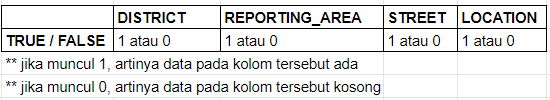

In [75]:
df['boolean_loc'] = df['DISTRICT'].notnull().map({False:'0', True: '1'}) + df['REPORTING_AREA'].notnull().map({False:'0', True: '1'}) + \
                 df['STREET'].notnull().map({False:'0', True: '1'}) +  df['Location'].notnull().map({False:'0', True: '1'})
df.sample(5)


,INCIDENT_NUMBER,OFFENSE_CODE,OFFENSE_CODE_GROUP,OFFENSE_DESCRIPTION,DISTRICT,REPORTING_AREA,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,HOUR,UCR_PART,STREET,Lat,Long,Location,districtNumber,boolean_loc
1223,I182069585,3410,Towed,TOWED MOTOR VEHICLE,South Boston,174,N,2018-08-30 08:36:03,2018,8,Thursday,8,Part Three,DORCHESTER AVE,42.331384,-71.056975,"(42.33138444, -71.05697531)",C6,1111
290253,I152081199,3114,Investigate Property,INVESTIGATE PROPERTY,Roxbury,300,N,2015-09-29 20:00:00,2015,9,Tuesday,20,Part Three,FULDA ST,42.322747,-71.093308,"(42.32274696, -71.09330822)",B2,1111
15808,I182053742,802,Simple Assault,ASSAULT SIMPLE - BATTERY,South Boston,227,N,2018-07-08 19:21:00,2018,7,Sunday,19,Part Two,E FOURTH ST,42.334855,-71.030234,"(42.33485456, -71.03023430)",C6,1111
80468,I172092517,3114,Investigate Property,INVESTIGATE PROPERTY,South End,146,N,2017-11-03 16:30:00,2017,11,Friday,16,Part Three,HUNTINGTON AVE,42.345856,-71.080995,"(42.34585625, -71.08099529)",D4,1111
293571,I152077627,3501,Missing Person Reported,MISSING PERSON,South End,285,N,2015-09-18 10:59:00,2015,9,Friday,10,Part Three,COLUMBUS AVE,42.336394,-71.087740,"(42.33639391, -71.08773968)",D4,1111


Jika ada, di bawah ini adalah code untuk menghapus baris yang kolom DISTRICT, REPORTING_AREA, STREET, dan Locationnya null ('loc_code' = '0000')

In [76]:
df.drop(df[df['boolean_loc'] == '0000'].index, inplace = True)

Bagaiamana untuk sisanya? kita lihat bahwa field STREET dan LOCATION masih terdapat missing value

- Field STREET

Sebelumnya mari kita lihat dulu untuk untuk presentasi null values-nya, terlihat bahwa field STREET masih mengandung missing value, sebanyak 3.4%

In [77]:
persentase = df.isna().sum()/df.shape[0]*100
persentase[persentase>0].sort_values(ascending=False)

STREET      3.407442
UCR_PART    0.027270
dtype: float64

Untuk penanganan Missing Values pada field STREET, kita dapat menggunakan field RA sebagai rujukan, karena tiap 1 STREET harusnya spesifik terhadap 1 REPORTING_AREA, begitu pula dengan suatu fakta bahwa setiap AREA pasti memiliki satu/ lebih dari satu STREET (secara level administrasi REPORTING AREA lebih tinggi dari pada STREET, sehingga STREET adalah bagian dari REPORTING_AREA).

Seperti halnya 1 Kabupaten pasti mengandung beberapa Kecamatan, 1 Kecamatan mengadung beberapa Kelurahan, 1 Kelurahan mengandung beberapa RW, seterusnya hingga level yang terkecil (tergantung konteks dan kebutuhan)


Berikut adalah menampilkan berbagai STREET untuk setiap REPORTING_AREA

In [78]:
df.groupby('REPORTING_AREA').nunique()[['STREET']].rename(columns={'STREET':'BANYAKNYA_NAMA_JALAN'}).describe()

,BANYAKNYA_NAMA_JALAN
count,878.000000
mean,11.454442
std,46.168642
min,1.000000
25%,7.000000
50%,10.000000
75%,13.000000
max,1372.000000


Menampilkan nama jalan yang paling sering muncul pada setiap area

In [79]:
modus = df.groupby(['REPORTING_AREA'])['STREET'].apply(pd.Series.mode).xs(0,level=1).to_frame().reset_index()
modus.head()

,REPORTING_AREA,STREET
0,1,BENNINGTON ST
1,10,LEYDEN ST
2,100,BROAD ST
3,101,MILK ST
4,102,TREMONT ST


Membuat variabel 'jalan' untuk menampung data yang diiterasi dari field REPORTING_AREA

In [80]:
REPORTING_AREA = list(modus['REPORTING_AREA'])
STREET = list(modus['STREET'])

for area, jalan in zip(REPORTING_AREA, STREET) :
    df.loc[(df['REPORTING_AREA'] == area) & (df['STREET'].isnull()), 'STREET'] = jalan

Sekarang kita dapat melihat bahwa jumlah missing value pada STREET sudah berkurang/ tidak ada lagi.

In [81]:

persentase = df.isna().sum()/df.shape[0]*100
persentase[persentase>0].sort_values(ascending=False)

UCR_PART    0.02727
dtype: float64

In [82]:
cek_ulang = df['boolean_loc'].value_counts().sort_index().to_frame().rename(columns={'boolean_loc':'baris1'})
cek_ulang

,baris1
1101,10871
1111,308166


* Field LOCATION (DCM-PTF-LOC)

Untuk penanganan Missing Values pada field LOCATION, kita dapat menggunakan field STREET sebagai rujukan, karena tiap 1 LOCATION harusnya spesifik terhadap 1 STREET / MANY TO ONE, begitu pula dengan suatu fakta bahwa setiap STREET pasti memiliki satu/ lebih dari satu LOCATION (secara level administrasi STREET lebih tinggi dari pada LOCATION, sehingga LOCATION adalah bagian dari STREET).

Seperti halnya 1 Kabupaten pasti mengandung beberapa Kecamatan, 1 Kecamatan mengadung beberapa Kelurahan, 1 Kelurahan mengandung beberapa RW, seterusnya hingga level yang terkecil (tergantung konteks dan kebutuhan)


Pertama tampilkan berbagai LOCATION untuk setiap STREET.

In [83]:
df.groupby('STREET').nunique()[['Location']].rename(columns={'Location':'BANYAKNYA_LOCATION'}).describe()

,BANYAKNYA_LOCATION
count,4657.000000
mean,4.307279
std,14.173578
min,1.000000
25%,1.000000
50%,2.000000
75%,4.000000
max,617.000000


Dari tabel di atas kita menemukan bahwa LOCATION untuk setiap STREET cukup bervariasi dengan mean sekitar 3.9 dan median 2. 
Secara presentase sejumlah 75% data memiliki jumlah STREET di bawah 3.Maka kita dapat mengambil nilai modus yang sering muncul dari LOCATION berdasarkan STREET, untuk mengisi missing value pada field LOCATION.

In [84]:
modus = df.groupby(['STREET'])['Location'].apply(pd.Series.mode).xs(0,level=1).to_frame().reset_index()
modus.head()

,STREET,Location
0,ALBANY ST,"(42.33361000, -71.07337000)"
1,BLUE HILL AVE,"(42.31730370, -71.07799648)"
2,COLUMBUS AVE,"(42.34060371, -71.08174185)"
3,COMMONWEALTH AVE,"(42.35053956, -71.13106722)"
4,MASSACHUSETTS AVE,"(42.33253100, -71.07213000)"


In [85]:
STREET = list(modus['STREET'])
Location = list(modus['Location'])

for jalan, lokasi in zip(STREET, Location) :
    df.loc[(df['STREET'] == jalan) & (df['Location'].isnull()), 'Location'] = lokasi

Missing values pada field Location sudah mengalami penurunan yang signifikan.

In [86]:
persentase = df.isna().sum()/df.shape[0]*100
persentase[persentase>0].sort_values(ascending=False)

UCR_PART    0.02727
dtype: float64

Tahapan selanjutnya adalah mengubah value pada field LOCATION, yang bernilai -1 atau 0

Pada field ini, replace nilai -1 dan 0 dengan nilain NaN

In [87]:
df['Location'] = df['Location'].replace('(-1.00000000, -1.00000000)', np.nan)
df['Location'] = df['Location'].replace('(0.00000000, 0.00000000)', np.nan)

Cek kembali apakah sudah berhasil terupdate atau belum

In [88]:
df[df['Location']=='(0.00000000, 0.00000000)']

,INCIDENT_NUMBER,OFFENSE_CODE,OFFENSE_CODE_GROUP,OFFENSE_DESCRIPTION,DISTRICT,REPORTING_AREA,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,HOUR,UCR_PART,STREET,Lat,Long,Location,districtNumber,boolean_loc


In [89]:
df[df['Location']=='(-1.00000000, -1.00000000)']

,INCIDENT_NUMBER,OFFENSE_CODE,OFFENSE_CODE_GROUP,OFFENSE_DESCRIPTION,DISTRICT,REPORTING_AREA,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,HOUR,UCR_PART,STREET,Lat,Long,Location,districtNumber,boolean_loc


* Konversi / Field Baru (DCM-PTF-KON)

Pada tahap ini kita melakukan konversi sekaligus membuat field baru, agar kita bisa mendapatkan keterangan 'weekend' dan 'weekday', serta keterangan 'Morning', 'Afternoon', atau 'Time'.

In [90]:
df['TIME'] = df['HOUR'].apply(lambda x : 'Morning' if (x >= 4) & (x < 12) else ('Afternoon' if (x >= 12) & (x < 20) else 'Night'))

Field TIME sudah berhasil terbuat.

In [91]:
df[['HOUR', 'TIME']].sample(10)

,HOUR,TIME
237294,17,Afternoon
35301,11,Morning
128491,18,Afternoon
60395,13,Afternoon
131356,16,Afternoon
224381,7,Morning
83286,19,Afternoon
19073,21,Night
310616,18,Afternoon
228006,19,Afternoon


Membuat pengelompokan WEEKEND dan WEEKDAY, kali ini kita tampung dengan field WEEK STATUS.

In [92]:
df['WEEK STATUS'] = df['DAY_OF_WEEK'].apply(lambda x : 'Weekend' if (x == 'Saturday') | (x == 'Sunday') else 'Weekday')

In [93]:
df[['DAY_OF_WEEK', 'WEEK STATUS']].sample(10)

,DAY_OF_WEEK,WEEK STATUS
189146,Sunday,Weekend
77743,Wednesday,Weekday
125960,Saturday,Weekend
193150,Sunday,Weekend
216190,Wednesday,Weekday
180416,Thursday,Weekday
279035,Tuesday,Weekday
143065,Sunday,Weekend
67158,Thursday,Weekday
15430,Tuesday,Weekday


Cek kembali data duplicate

In [94]:
# menghitung banyaknya duplikat dan menampilkan 6 baris contoh data duplikat
display(f'Data duplikat sejumlah: {df.duplicated().sum()}', df[df.duplicated(keep=False)].head(6))

'Data duplikat sejumlah: 0'

,INCIDENT_NUMBER,OFFENSE_CODE,OFFENSE_CODE_GROUP,OFFENSE_DESCRIPTION,DISTRICT,REPORTING_AREA,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,...,HOUR,UCR_PART,STREET,Lat,Long,Location,districtNumber,boolean_loc,TIME,WEEK STATUS


**ANALISA OUTLIER** (DCM-PTF-OUT)

Tabel ini mempunyai 6 buah kolom numerik namun sudah tidak bisa dilakukan fungsi matematis. Maka dari itu, uji outliers tidak diperlukan.

> # EXPLORATORY DATA ANALYSIS

kode: EDA-5

Untuk mempermudah analysis, permasalahan yang ada akan kita bedah menjadi 3 jenis, yaitu analisa berdasarkan waktu kejadian, analisa berdasarkan jenis kejahatan, analisa berdasarkan tempat kejadian, dan analisa berdasarkan tindakan polisi.

**ANALISA BERDASARKAN WAKTU KEJADIAN** (EDA-AWK)

* Tren Kejadian (EDA-AWK-TRE)

In [95]:
df_trend=df.groupby(['YEAR','MONTH']).agg('count')[['INCIDENT_NUMBER']][1:39]

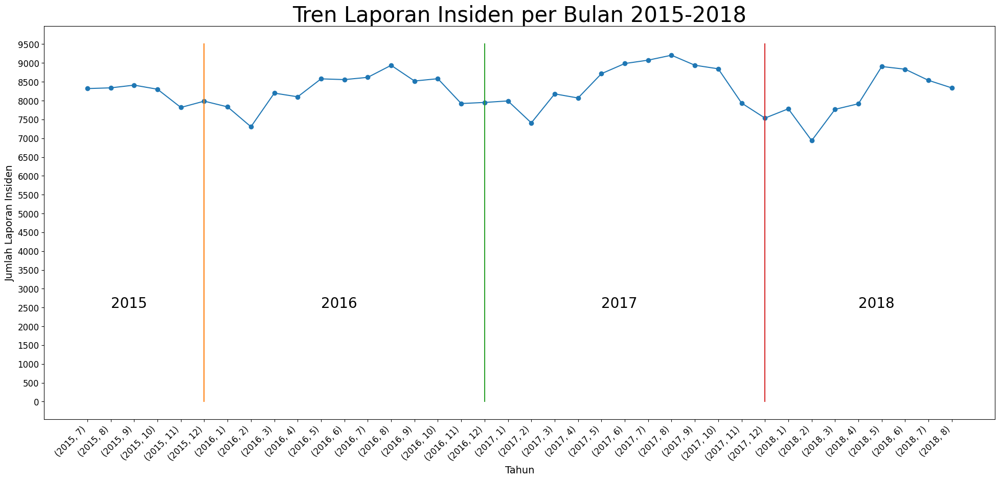

In [96]:
plt.figure(figsize=(24,10))
plt.plot(df_trend.reset_index()['INCIDENT_NUMBER'], 'o-')
plt.plot([5,5], [0,9500])
plt.plot([17,17], [0,9500])
plt.plot([29,29], [0,9500])
plt.text(1,2500,'2015',size=20)
plt.text(10,2500,'2016',size=20)
plt.text(22,2500,'2017',size=20)
plt.text(33,2500,'2018',size=20)
plt.xticks(np.arange(0,38), df_trend.index, rotation=45,ha="right",size=12)
plt.yticks(np.arange(0,10000,500),size=12)
plt.xlabel('Tahun',size=14)
plt.ylabel('Jumlah Laporan Insiden',size=14)
plt.title('Tren Laporan Insiden per Bulan 2015-2018',size=30)
plt.show()

Insight: 
Dari graph di atas terlihat bahwa tren laporan insiden bersifat fluktuatif untuk setiap bulan / interval beberapa bulan, jika dilihat dari tahun ke tahun juga tidak ada ada kenaikan ataupun penurunan yang signifikan. Pada bulan 7 tahun 2015 terdapat 8289 laporan insiden dan pada bulan 8 tahun 2018 terdapat 8241, selisihnya sangat sedikit antara bulan pertama dan bulan terakhir yang ada pada dataset.

Dalam hal kejahatan, tentunya kita berharap laporan insiden terus mengalami penurunan. Namun agar tidak bias, analisa pada tahap ini perlu kita perdalam lagi pada proses selanjutnya.

Analisa:

Jika melihat rujukan / sumber yang bertajuk 'Is Crime Seasonal' (tulisan Carolyn Rebecca), tindak kejahatan di Amerika memiliki suati pola yang musiman, dipengaruhi oleh kondisi ekonomi negara dan musimnya. Hal ini dapat memeperkuat alasan mengapa grafik di atas bersifat fluktuatif, cenderung cepat berubah-ubah baik naik ataupun turun, namun tidak mengalami penurunan / kenaikan yang signifikan dan bertahan dalam jangka waktu yang lama.

Saran: 

Maka pihak kepolisian harus lebih intens dan serius dalam penanganan kejahatan, salah satunya dengan melakukan analisa penyebab naik/turunnya suatu pola. Hal ini menjadi perhatian khusus bagi pemerintah / aparat kota Boston, agar tidak bertahan dalam status quo.

* Tingkat Kejahatan Berdasarkan Jam (EDA-AWK-TBJ)

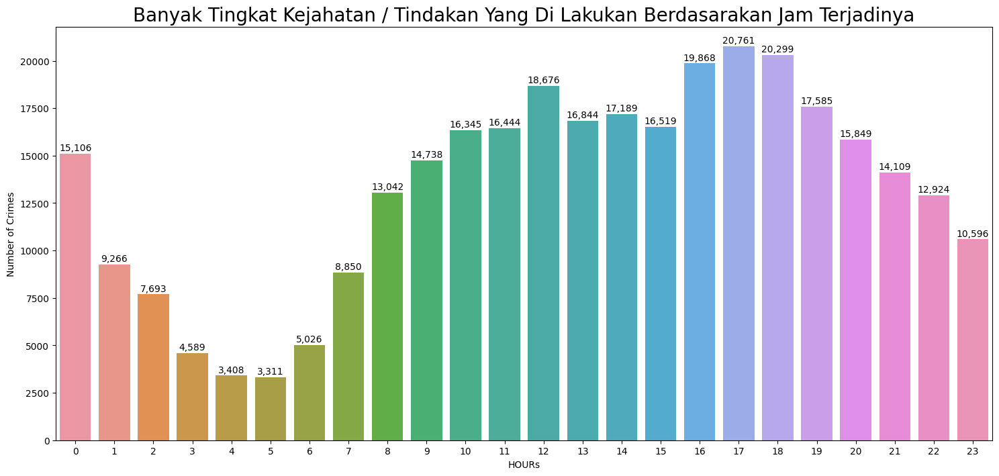

In [97]:
plt.figure(figsize=(18,8)) 
ax=sns.countplot(x='HOUR',data=df)
plt.title('Banyak Tingkat Kejahatan / Tindakan Yang Di Lakukan Berdasarakan Jam Terjadinya',fontsize=20)
plt.xlabel('HOURs')
plt.ylabel('Number of Crimes')
container = ax.containers[0]
ax.bar_label(container , labels=[f'{x:,.0f}' for x in container.datavalues], label_type='edge', padding = 1)
plt.show()

INSIGHT:

Dari graph di atas menunjukan bahwa tindak kejatahan dimulai pada menjelang sore hingga malam hari, yaitu pada pukul 09.00 hingga pukul 19.00, (office hour).

Sedangkan pada jam 3 hingga jam 5 menunjukan tindak kejahatan yang rendah, hal ini dimungkinan karena masih dalam jam / waktu tidur. Kita juga bisa bandingkan melalui heatmap, yaitu pada jam 3 hingga 5 pagi masih berwarna putih.



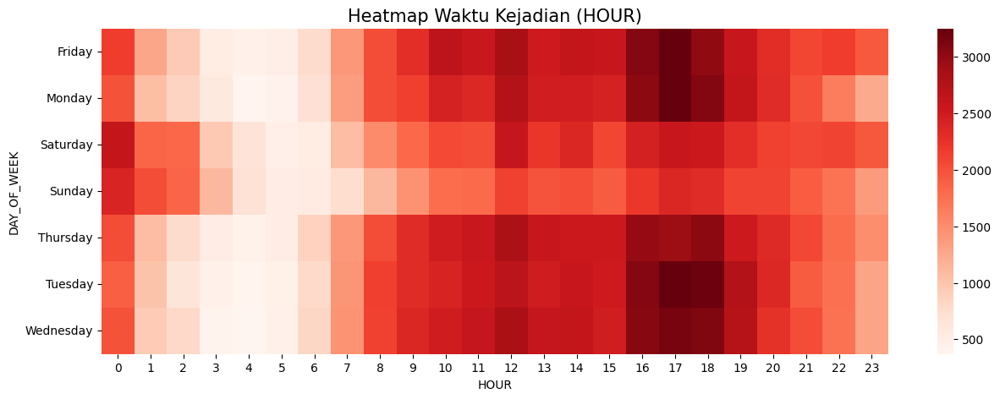

In [98]:

plt.figure(figsize=(15, 5))
plt.title("Heatmap Waktu Kejadian (HOUR)", fontsize = 15)
data = pd.pivot_table(
    data = df, 
    index = "DAY_OF_WEEK", 
    columns = "HOUR", 
    values = "INCIDENT_NUMBER", 
    aggfunc = 'count'
)

sns.heatmap(data, cmap = 'Reds')
plt.show()

In [99]:
#membuat tabel dengan kolom nama jam dan jumlah kasus
crime_jam = df.groupby("HOUR").count()[["DAY_OF_WEEK"]].reset_index()
crime_jam['HOUR'] = crime_jam['HOUR'].replace({0:24})
crime_jam = crime_jam.sort_values('HOUR').reset_index()
crime_jam.drop(columns='index',inplace=True)
crime_jam.rename(columns={"DAY_OF_WEEK":"Jumlah Kasus"},inplace=True)
crime_jam

,HOUR,Jumlah Kasus
0,1,9266
1,2,7693
2,3,4589
3,4,3408
4,5,3311
5,6,5026
6,7,8850
7,8,13042
8,9,14738
9,10,16345


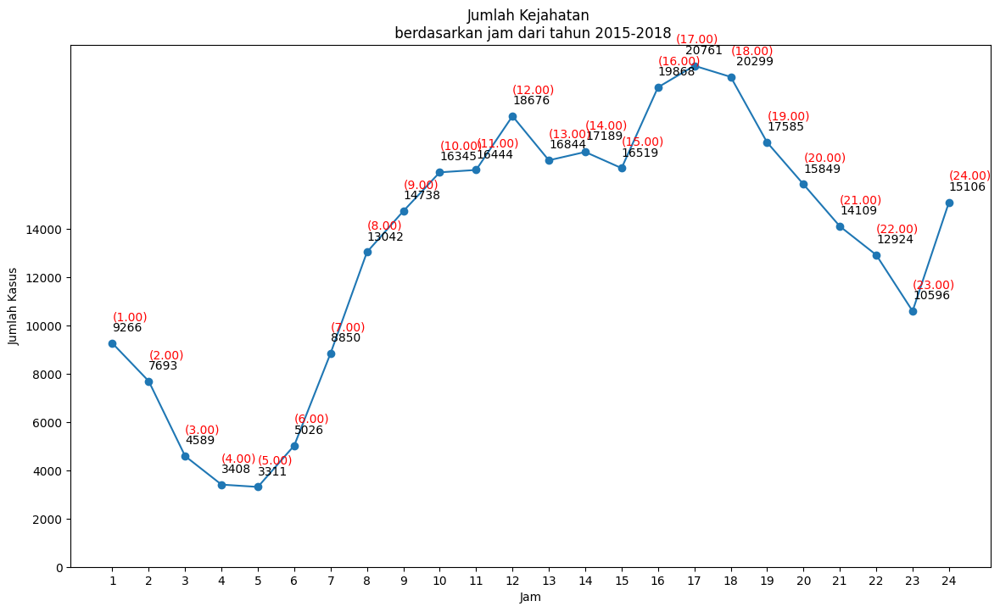

In [100]:
plt.figure(figsize=(14,8))
sns.lineplot(data=crime_jam,x="HOUR",y="Jumlah Kasus")#default akan menampilkan rata2 (agregat) dari jumlah penumpang
plt.scatter(crime_jam['HOUR'],crime_jam["Jumlah Kasus"])
plt.title(f'Jumlah Kejahatan \n berdasarkan jam dari tahun 2015-2018')
for i in range(0,24):
    if i == 17:
        plt.text(crime_jam['HOUR'].iloc[i]+0.15,crime_jam["Jumlah Kasus"].iloc[i]+500,crime_jam["Jumlah Kasus"].iloc[i])
    elif i == 16:
        plt.text(crime_jam['HOUR'].iloc[i]-0.25,crime_jam["Jumlah Kasus"].iloc[i]+500,crime_jam["Jumlah Kasus"].iloc[i])
    else:
        plt.text(crime_jam['HOUR'].iloc[i],crime_jam["Jumlah Kasus"].iloc[i]+500,crime_jam["Jumlah Kasus"].iloc[i])
for i in range(0,24):
    if i == 16:
        plt.text(crime_jam['HOUR'].iloc[i]-0.5,crime_jam["Jumlah Kasus"].iloc[i]+950,f"({i+1}.00)",color='red')
    else:
        plt.text(crime_jam['HOUR'].iloc[i],crime_jam["Jumlah Kasus"].iloc[i]+950,f"({i+1}.00)",color='red')
plt.xlabel("Jam")
plt.ylabel("Jumlah Kasus")
plt.xticks(range(1,25))
plt.yticks(np.arange(0,15001,2000))
plt.show()

ANALISA.

Seperti yang sudah dijelaskan sebelumnya bahwa jumlah kasus kejadian yang tinggi terjadi pada jam produktif/kerja/ramai di setiap kota, pada umumnya yaitu sekitar pukul 09.00 - 20.00.
Hal ini memungkinkan adanya hubungan antara jumlah populasi di jalanan Boston dengan tingkat kriminalitas. Sedangkan untuk jam 3 hingga 6 pagi masih banyak orang yang masih tidur atau sedang istirahat.


SARAN.

Petugas kepolisian agar memperbanyak jadwal patroli polisi di sekitar jam 09.00 - 20.00.

* Tingkat Kejahatan Berdasarkan Hari (EDA-AWK-TKH)

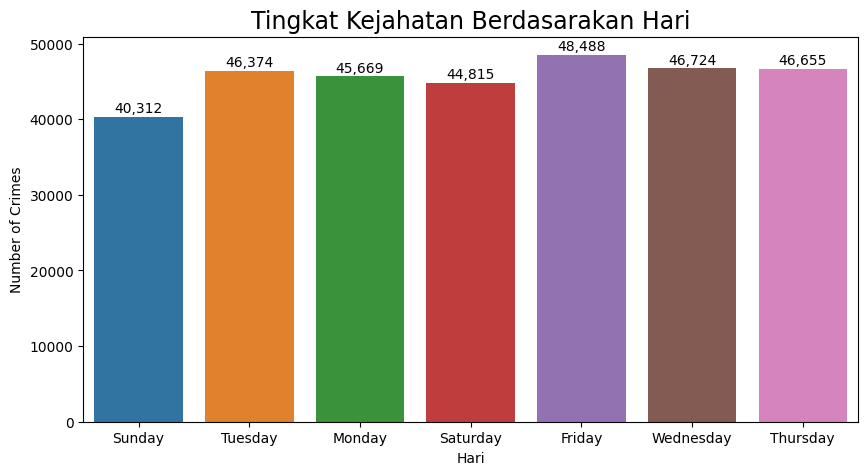

In [101]:
plt.figure(figsize=(10,5))
ax=sns.countplot(x='DAY_OF_WEEK',data=df)
plt.title(f'Tingkat Kejahatan Berdasarakan Hari',fontsize=17)
plt.xlabel('Hari')
plt.ylabel('Number of Crimes')
container = ax.containers[0]
ax.bar_label(container , labels=[f'{x:,.0f}' for x in container.datavalues], label_type='edge', padding = 1)
plt.show()

Insight:

Dari visualisasi di atas dapat kita asumsikan bahwa tindak kejahatan paling tinggi terjadi pada hari Jumat, sedangkan pada hari lain cenderung memiliki intensitas yang hampir sama.
Fakta lain justru ketika hari Sabtu dan Minggu (Weekend) malah mengalami penurunan, yaitu saat kebanyakan orang beristirahat di rumah.
Secara umum jam / hari kerja adalah jam 8 pagi hingga 4 sore. Contohnya jam/hari kerja Kepolisian Boston juga serupa. Kemudian jika kita rujuk pada graph sebelumnya, kejahatan paling sering terjadi pada pagi menjelang siang - malam hari, Maka dapat kita asumsikan bahwa kejahatan justru terjadi saat hari kerja, tidak hanya saat bekerja, namun juga setelah jam kerja seperti saat pegawai sedang lembur ataupun sedang perjalanan pulang kerja. Pada hari kerja juga  banyak aktivitas terjadi, misalnya di pusat perbelanjaan, pusat hiburan, restoran, ataupun sektor lainnya, tentunya adalah aktivitas yang harus dilakukan di luar rumah dan dapat memberikan dampak ekonomi.



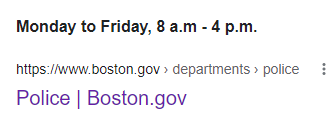

Saran:

Polisi harus mempertimbangkan untuk berjaga pada hari kerja, khususnya pada hari Jumat. Hal ini diperkuat oleh data, bahwa industri di Boston merupakan industri yang perlu dilakukan di luar rumah dan bekerja pada weekdays(perkantoran).
Sumber: https://www.bostonplans.org/getattachment/b9e87163-0b16-44ea-90cd-d42a847b93c9

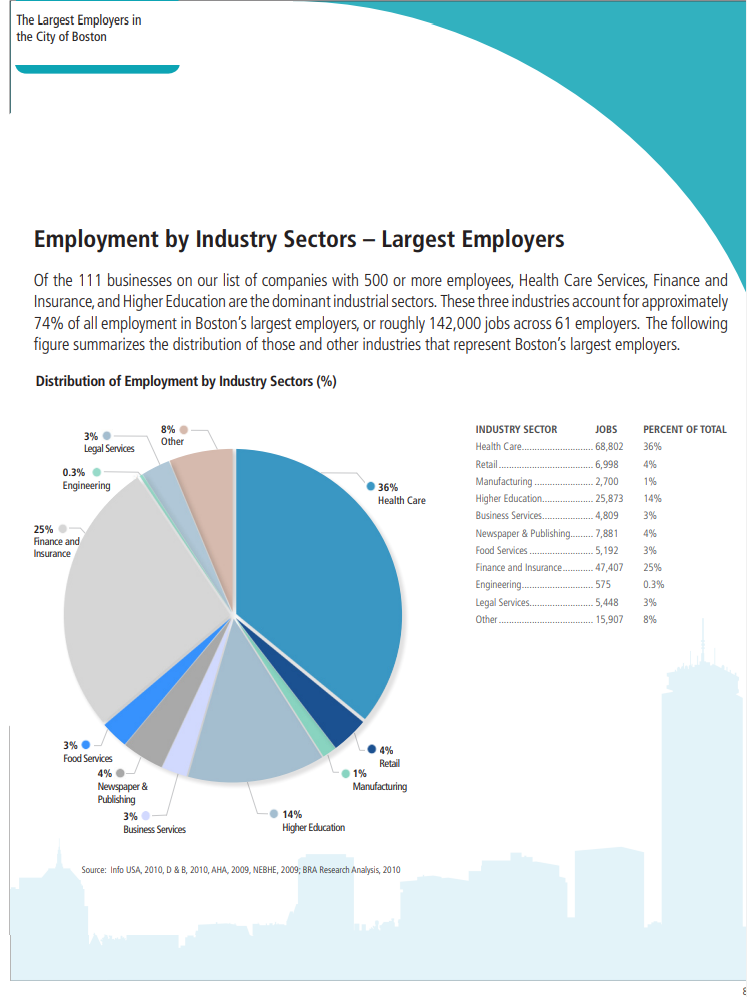


* Pembagian 8 Waktu (EDA-AWK-PBW)

In [102]:
def HOUR_part(x):
    if x<4:
        return 'Night'
    elif x<8:
        return 'Early Morning'
    elif x<11:
        return 'Morning'
    elif x<13:
        return 'Late Morning'
    elif x<15:
        return 'Early Afternoon'
    elif x<17:
        return 'Late Afternoon'
    elif x<20:
        return 'Evening'
    else:
        return 'Night'
df['HOUR_Part']=df['HOUR'].apply(HOUR_part)

In [103]:
HOUR_case=pd.crosstab(index=df['HOUR_Part'],columns='Jumlah_Kasus').sort_values('Jumlah_Kasus',ascending=False)
HOUR_case['%']=(pd.crosstab(index=df['HOUR_Part'],columns='Jumlah_Kasus',normalize=True)*100).round(2)
HOUR_case

col_0,Jumlah_Kasus,%
HOUR_Part,,
Night,90132,28.25
Evening,58645,18.38
Morning,44125,13.83
Late Afternoon,36387,11.41
Late Morning,35120,11.01
Early Afternoon,34033,10.67
Early Morning,20595,6.46


Grafik di bawah untuk memperjelas bahwa kejahatan terjadi pada 'Evening' to 'Night', dengan presentase 18.38 % dan 28.25%, jika digabung sudah melebihi 45%, artinya memiliki pengaruh yang sangat dominan.

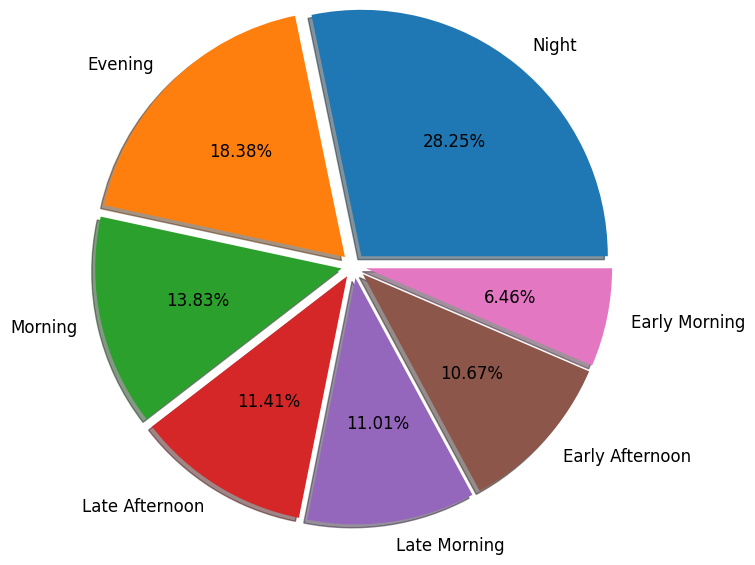

In [104]:
plt.figure(figsize=(5,4))
plt.pie(HOUR_case['%'],labels=HOUR_case.index,
    shadow=True,
    textprops={
        'size':12,
        'color':'k'
    },
    autopct='%1.2f%%',
    explode=(0.1,0.1,0.1,0.1,0.1,0.1,0.1),
    radius=2
)
plt.savefig('crime_time_chart.png')
plt.show()

* Hitung Dari Rata-Rata (EDA-AWK-RRT)

Lalu bagaimana jika dalam penarikan data berdasarkan 'hari' kita menggunakan kalkulasi 'rata - rata'?

Tujuan saya juga mempertimbangkan kalkulasi rata-rata adalah untuk menghindari bias, kita tahu bahwa data yang diambil tidak lengkap, kondisi saat ini data diambil hanya pada range Juni 2015 hingga September 2018, sehingga kita juga bisa menghindari bias yang ada. Gambarannya dapat dilihat pada graph dan listing di bawah ini.

In [105]:

date_awal = df.sort_values(by='OCCURRED_ON_DATE')
date_awal.head(5)

,INCIDENT_NUMBER,OFFENSE_CODE,OFFENSE_CODE_GROUP,OFFENSE_DESCRIPTION,DISTRICT,REPORTING_AREA,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,...,UCR_PART,STREET,Lat,Long,Location,districtNumber,boolean_loc,TIME,WEEK STATUS,HOUR_Part
314676,I152054279,1106,Confidence Games,FRAUD - CREDIT CARD / ATM FRAUD,Mattapan,456,N,2015-06-15,2015,6,...,Part Two,HARLEM ST,42.300217,-71.080979,"(42.30021684, -71.08097940)",B3,1111,Night,Weekday,Night
310350,I152059178,2647,Other,THREATS TO DO BODILY HARM,Dorchester,359,N,2015-06-15,2015,6,...,Part Three,WASHINGTON ST,42.293606,-71.071887,"(42.29360585, -71.07188650)",C11,1111,Night,Weekday,Night
318414,I152049897,3201,Property Lost,PROPERTY - LOST,Roxbury,282,N,2015-06-15,2015,6,...,Part Three,WASHINGTON ST,42.328663,-71.085634,"(42.32866284, -71.08563401)",B2,1111,Night,Weekday,Night
253464,I162013546,3201,Property Lost,PROPERTY - LOST,Mattapan,433,N,2015-06-15,2015,6,...,Part Three,NORFOLK ST,42.283634,-71.082813,"(42.28363434, -71.08281320)",B3,1111,Night,Weekday,Night
129056,I172040657,2629,Harassment,HARASSMENT,Dorchester,397,N,2015-06-15,2015,6,...,Part Two,MELBOURNE ST,42.291093,-71.065945,"(42.29109287, -71.06594539)",C11,1111,Night,Weekday,Night


In [106]:

date_akhir = df.sort_values(by='OCCURRED_ON_DATE', ascending= False)
date_akhir.head(5)

,INCIDENT_NUMBER,OFFENSE_CODE,OFFENSE_CODE_GROUP,OFFENSE_DESCRIPTION,DISTRICT,REPORTING_AREA,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,...,UCR_PART,STREET,Lat,Long,Location,districtNumber,boolean_loc,TIME,WEEK STATUS,HOUR_Part
6,I182070933,724,Auto Theft,AUTO THEFT,Roxbury,330,N,2018-09-03 21:25:00,2018,9,...,Part One,NORMANDY ST,42.306072,-71.082733,"(42.30607218, -71.08273260)",B2,1111,Night,Weekday,Night
3,I182070940,3114,Investigate Property,INVESTIGATE PROPERTY,South End,272,N,2018-09-03 21:16:00,2018,9,...,Part Three,NEWCOMB ST,42.334182,-71.078664,"(42.33418175, -71.07866441)",D4,1111,Night,Weekday,Night
5,I182070936,3820,Motor Vehicle Accident Response,M/V ACCIDENT INVOLVING PEDESTRIAN - INJURY,Dorchester,398,N,2018-09-03 21:09:00,2018,9,...,Part Three,TALBOT AVE,42.290196,-71.071590,"(42.29019621, -71.07159012)",C11,1111,Night,Weekday,Night
4,I182070938,3114,Investigate Property,INVESTIGATE PROPERTY,Mattapan,421,N,2018-09-03 21:05:00,2018,9,...,Part Three,DELHI ST,42.275365,-71.090361,"(42.27536542, -71.09036101)",B3,1111,Night,Weekday,Night
8,I182070931,301,Robbery,ROBBERY - STREET,South Boston,177,N,2018-09-03 20:48:00,2018,9,...,Part One,MASSACHUSETTS AVE,42.331521,-71.070853,"(42.33152148, -71.07085307)",C6,1111,Night,Weekday,Night


List di atas menunjukan bahwa pencatatan paling awal ada pada tanggal 15 Juni 2015, kemudian pencatatan terakhir ada pada tanggal 3 September 2018

Selanjutnya, mari kita visulisasikan perhitungan jumlah kejahatan per hari menggunakan pendekatan rata - rata

In [107]:
kasus_hari = df[['OCCURRED_ON_DATE', 'DAY_OF_WEEK']].copy()
kasus_hari['OCCURRED_ON_DATE'] = pd.to_datetime(kasus_hari['OCCURRED_ON_DATE'].sort_values()).dt.strftime('%d %b %y')
df_A = kasus_hari.groupby('OCCURRED_ON_DATE').count().reset_index().rename(columns={'OCCURRED_ON_DATE' : 'Tanggal', 'DAY_OF_WEEK' : 'Jumlah Kasus'})
df_B = kasus_hari.groupby('OCCURRED_ON_DATE').max().reset_index().rename(columns={'OCCURRED_ON_DATE' : 'Tanggal', 'DAY_OF_WEEK' : 'Hari'})

kasus_hari = df_A.merge(df_B)
kasus_hari.head()

,Tanggal,Jumlah Kasus,Hari
0,01 Apr 16,353,Friday
1,01 Apr 17,296,Saturday
2,01 Apr 18,243,Sunday
3,01 Aug 15,277,Saturday
4,01 Aug 16,330,Monday


In [108]:
rata_hari = kasus_hari.groupby("Hari").mean().reset_index()[['Hari',"Jumlah Kasus"]]
s1 = pd.Series([6,2,7,1,5,3,4])
rata_hari
rata_hari1 = pd.concat([rata_hari,s1],axis=1).sort_values(0).set_index(0)
rata_hari1

C:\Users\andis\AppData\Local\Temp\ipykernel_16928\2681361540.py:1: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  rata_hari = kasus_hari.groupby("Hari").mean().reset_index()[['Hari',"Jumlah Kasus"]]


,Hari,Jumlah Kasus
0,,
1,Sunday,239.952381
2,Monday,270.230769
3,Tuesday,276.035714
4,Wednesday,278.119048
5,Thursday,277.708333
6,Friday,288.619048
7,Saturday,266.755952


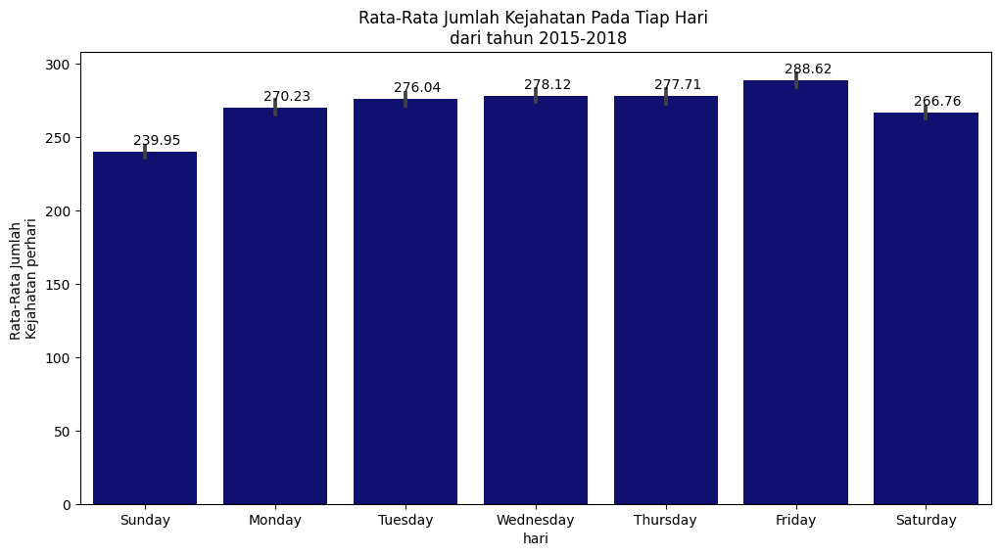

In [109]:
plt.figure(figsize=(12,6))
ax = sns.barplot(data=kasus_hari, x="Hari",y='Jumlah Kasus', color='navy',order=["Sunday",'Monday',"Tuesday","Wednesday","Thursday","Friday","Saturday"])
plt.title(f'Rata-Rata Jumlah Kejahatan Pada Tiap Hari \n dari tahun 2015-2018')
plt.xlabel(f'hari')
plt.ylabel('Jumlah Kasus')
for i in range(7):
    plt.text(-0.0900+i,rata_hari1['Jumlah Kasus'].iloc[i]+5,round(rata_hari1['Jumlah Kasus'].iloc[i],2))
plt.ylabel('Rata-Rata Jumlah \nKejahatan perhari')
plt.show()

Jika menggunakan kalkulasi rata - rata, ternyata tingkat kejahatan terbanyak masih konsisten pada Hari Jumat

* Tingkat Kejahatan Berdasarkan Bulan (EDA-AWK-TKB)

Selanjutnya kita akan melakukan analisa tingkat tindak kejahatan berdasarkan Bulan

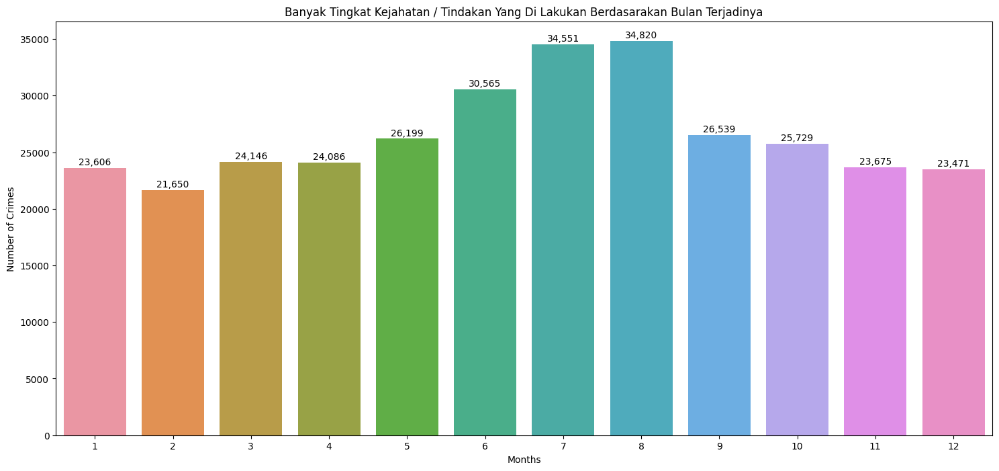

In [110]:
plt.figure(figsize=(18,8))
ax=sns.countplot(x="MONTH",data=df)
plt.title(f'Banyak Tingkat Kejahatan / Tindakan Yang Di Lakukan Berdasarakan Bulan Terjadinya')
plt.xlabel("Months")
plt.ylabel('Number of Crimes')
container = ax.containers[0]
ax.bar_label(container , labels=[f'{x:,.0f}' for x in container.datavalues], label_type='edge', padding = 1)
plt.show()


INSIGHT:

Dari graph di atas kita mendapatkan informasi bahwa tingkat kejahatan pada bulan Juni - Juli - Agustus mengalami peningkatan yang cukup signifikan. Hal ini menjadi perhatian khusus karena berdasarkan informasi yang saya dapat dari https://www.studyusa.com/id/a/258/memahami-sistem-pendidikan-amerika , bahwa perkuliahan di A.S dimulai pada bulan Agustus, dapat diasumsikan pula bahwa persiapan perkuliahan akan cukup padat pada bulan Juli, khususnya untuk student dari luar kota.

SARAN:

Polisi perlu memperketat penjagaan pada bulan Juli dan Agustus, selain karena kenaikan tingkat kejahatan pada bulan tersebut cukup signifikan, juga banyak pendatang dari luar kota / luar negeri untuk mengikuti perkuliahan di Kota Boston, meskipun tidak permanen namun hal ini menambah jumlah penduduk di Kota Boston

Lalu bagaimana jika menggunakan kalkulasi rata - rata?

In [111]:
kasus_bulanan = df[['OCCURRED_ON_DATE', 'MONTH']].copy()
kasus_bulanan['OCCURRED_ON_DATE'] = pd.to_datetime(kasus_bulanan['OCCURRED_ON_DATE'].sort_values()).dt.strftime('%d %b %y')
df_A = kasus_bulanan.groupby('OCCURRED_ON_DATE').count().reset_index().rename(columns={'OCCURRED_ON_DATE' : 'Tanggal', 'MONTH' : 'Jumlah Kasus'})
df_B = kasus_bulanan.groupby('OCCURRED_ON_DATE').max().reset_index().rename(columns={'OCCURRED_ON_DATE' : 'Tanggal', 'MONTH' : 'Bulan'})

kasus_bulanan = df_A.merge(df_B)
kasus_bulanan.head()

,Tanggal,Jumlah Kasus,Bulan
0,01 Apr 16,353,4
1,01 Apr 17,296,4
2,01 Apr 18,243,4
3,01 Aug 15,277,8
4,01 Aug 16,330,8


C:\Users\andis\AppData\Local\Temp\ipykernel_16928\1814884938.py:2: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=('ci', 0)` for the same effect.

  ax = sns.barplot(data=kasus_bulanan, x='Bulan', y = 'Jumlah Kasus', ci=0, palette=['navy', 'red'])


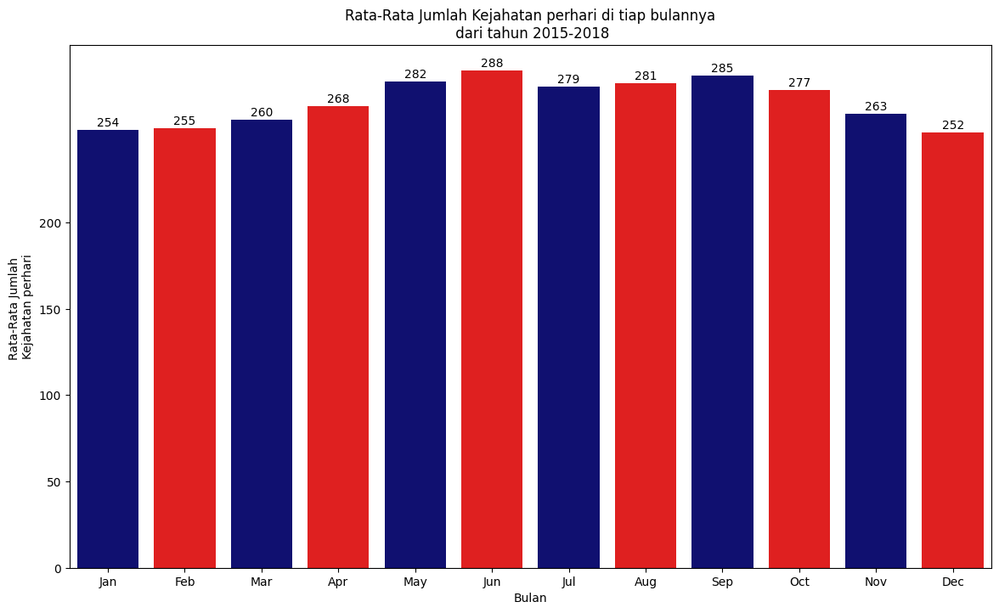

In [112]:
plt.figure(figsize=(14,8))
ax = sns.barplot(data=kasus_bulanan, x='Bulan', y = 'Jumlah Kasus', ci=0, palette=['navy', 'red'])
plt.title(f'Rata-Rata Jumlah Kejahatan perhari di tiap bulannya\n dari tahun 2015-2018')
container = ax.containers[0]
ax.bar_label(container , labels=[f'{x:,.0f}' for x in container.datavalues], label_type='edge', padding = 1)
months = ['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug','Sep','Oct','Nov','Dec']
plt.yticks(range(0,201,50))
plt.xticks(range(0,12),months)
plt.ylabel('Rata-Rata Jumlah \nKejahatan perhari')
ax;

Jika menggunakan pendekatan rata - rata, terlihat bahwa kejadian tertinggi terjadi pada Bulan Juni, meskipun tidak sama persis dengan graph sebelumnya, namun masih menunjukan indikasi bahwa kenaikan yang signifikan juga dimulai pada bulan Juni. 

* Tingkat Kejahatan Berdasarkan Tahun (EDA-AWK-TKT)

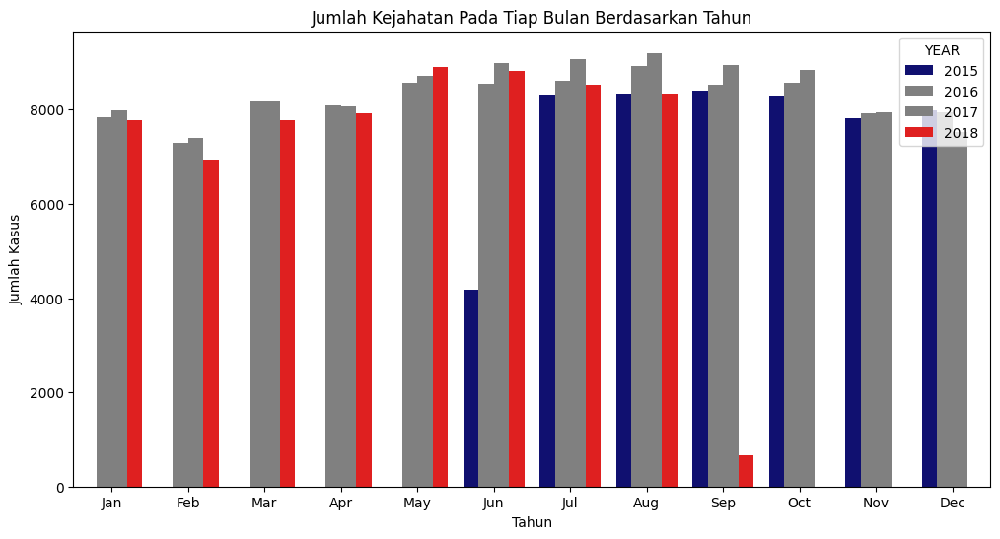

In [113]:
plt.figure(figsize=(12,6))
my_palette ={2015: "navy", 2016 : "gray", 2017 : "gray", 2018 : "red"}
ax = sns.countplot(data=df, x='MONTH', hue='YEAR', palette=my_palette)
plt.title(f'Jumlah Kejahatan Pada Tiap Bulan Berdasarkan Tahun')
plt.xlabel('Tahun')
plt.ylabel('Jumlah Kasus')
months = ['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug','Sep','Oct','Nov','Dec']
plt.xticks(np.arange(12), months)
ax;

Seperti yang sudah dijelaskan sebelumnya bahwa pengambilan data pada tahun 2015 hingga 2018 tidaklah lengkap, maka dari itu teruntuk analisa berdasarkan tahun saya hanya menggunakan pendekatan / perhitungan rata-rata.

Di bawah ini adalah listing pengambilan data awal dan akhir pada tiap tahun.

In [114]:
display(df.groupby("YEAR").min()["OCCURRED_ON_DATE"],df.groupby("YEAR").max()["OCCURRED_ON_DATE"])


C:\Users\andis\AppData\Local\Temp\ipykernel_16928\849775367.py:1: FutureWarning: Dropping invalid columns in DataFrameGroupBy.min is deprecated. In a future version, a TypeError will be raised. Before calling .min, select only columns which should be valid for the function.
  display(df.groupby("YEAR").min()["OCCURRED_ON_DATE"],df.groupby("YEAR").max()["OCCURRED_ON_DATE"])
C:\Users\andis\AppData\Local\Temp\ipykernel_16928\849775367.py:1: FutureWarning: Dropping invalid columns in DataFrameGroupBy.max is deprecated. In a future version, a TypeError will be raised. Before calling .max, select only columns which should be valid for the function.
  display(df.groupby("YEAR").min()["OCCURRED_ON_DATE"],df.groupby("YEAR").max()["OCCURRED_ON_DATE"])


YEAR
2015   2015-06-15
2016   2016-01-01
2017   2017-01-01
2018   2018-01-01
Name: OCCURRED_ON_DATE, dtype: datetime64[ns]

YEAR
2015   2015-12-31 23:54:00
2016   2016-12-31 23:40:00
2017   2017-12-31 23:57:00
2018   2018-09-03 21:25:00
Name: OCCURRED_ON_DATE, dtype: datetime64[ns]

In [115]:
caseByYear = df[['OCCURRED_ON_DATE', 'YEAR']].copy()
caseByYear['OCCURRED_ON_DATE'] = pd.to_datetime(caseByYear['OCCURRED_ON_DATE'].sort_values()).dt.strftime('%d %b %y')
df_A = caseByYear.groupby('OCCURRED_ON_DATE').count().reset_index().rename(columns={'OCCURRED_ON_DATE' : 'Tanggal', 'YEAR' : 'Jumlah Kasus'})
df_B = caseByYear.groupby('OCCURRED_ON_DATE').max().reset_index().rename(columns={'OCCURRED_ON_DATE' : 'Tanggal', 'YEAR' : 'Tahun'})

caseByYear = df_A.merge(df_B)
caseByYear.head()

,Tanggal,Jumlah Kasus,Tahun
0,01 Apr 16,353,2016
1,01 Apr 17,296,2017
2,01 Apr 18,243,2018
3,01 Aug 15,277,2015
4,01 Aug 16,330,2016


* Hitung Dari Rata-Rata per Tahun (EDA-AWK-RPT)

In [116]:
yearAverage = caseByYear.groupby('Tahun').mean().reset_index()
yearAverage.head()

C:\Users\andis\AppData\Local\Temp\ipykernel_16928\3245173170.py:1: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  yearAverage = caseByYear.groupby('Tahun').mean().reset_index()


,Tahun,Jumlah Kasus
0,2015,266.815000
1,2016,270.781421
2,2017,276.391781
3,2018,267.012195


Berikut adalah visualiasi untuk melihat rata - rata kasus kejahatan per hari setiap tahun 2015 - 2018

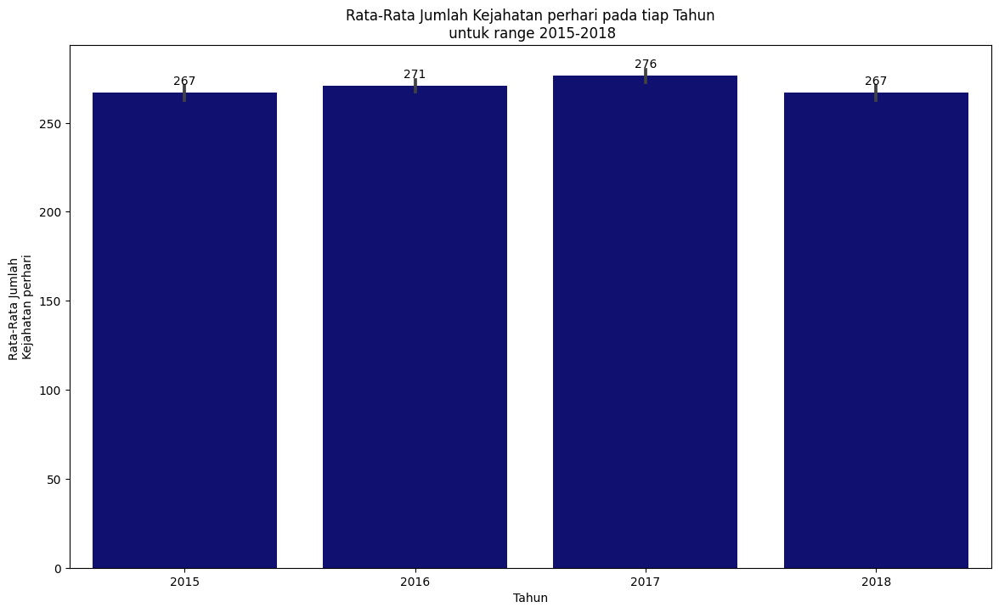

In [117]:

plt.figure(figsize=(14,8))
sns.barplot(data=caseByYear, x='Tahun', y = 'Jumlah Kasus', palette=['navy'])
plt.title(f'Rata-Rata Jumlah Kejahatan perhari pada tiap Tahun\n untuk range 2015-2018')
for i in range(4):
    plt.text(-0.0491+i,yearAverage["Jumlah Kasus"].iloc[i]+4.5,round(yearAverage["Jumlah Kasus"].iloc[i]))
plt.ylabel("Rata-Rata Jumlah \nKejahatan perhari")
plt.show()

INSIGHT:

Jika kita hanya melihat dari data yang lengkap saja, yakni pada tahun 2016 - 2017, maka kita mendapatkan bahwa terjadi peningkatan tindak kejahtan dari tahun 2016 ke 2017, dengan nilai rata-rata 271 ke 276.

* Sering Terjadi di Weekdays atau Weekend? (EDA-AWK-WAW)

Pada tahap ini kita coba melihat pola yang terjadi, tindak kejahatan lebih sering pada weekend atau weekday.

In [118]:
kasus_harian = df[['OCCURRED_ON_DATE', 'WEEK STATUS']].copy()
kasus_harian['OCCURRED_ON_DATE'] = pd.to_datetime(kasus_harian['OCCURRED_ON_DATE'].sort_values()).dt.strftime('%d %b %y')
df_A = kasus_harian.groupby('OCCURRED_ON_DATE').count().reset_index().rename(columns={'OCCURRED_ON_DATE' : 'Tanggal', 'WEEK STATUS' : 'Jumlah Kasus'})
df_B = kasus_harian.groupby('OCCURRED_ON_DATE').max().reset_index().rename(columns={'OCCURRED_ON_DATE' : 'Tanggal', 'WEEK STATUS' : 'Pekan'})

kasus_harian = df_A.merge(df_B)
kasus_harian.head()

,Tanggal,Jumlah Kasus,Pekan
0,01 Apr 16,353,Weekday
1,01 Apr 17,296,Weekend
2,01 Apr 18,243,Weekend
3,01 Aug 15,277,Weekend
4,01 Aug 16,330,Weekday


C:\Users\andis\AppData\Local\Temp\ipykernel_16928\2908268907.py:1: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=('ci', 0)` for the same effect.

  ax = sns.barplot(data=kasus_harian, x='Pekan', y = 'Jumlah Kasus', ci=0, palette=['Blue', 'Yellow'])


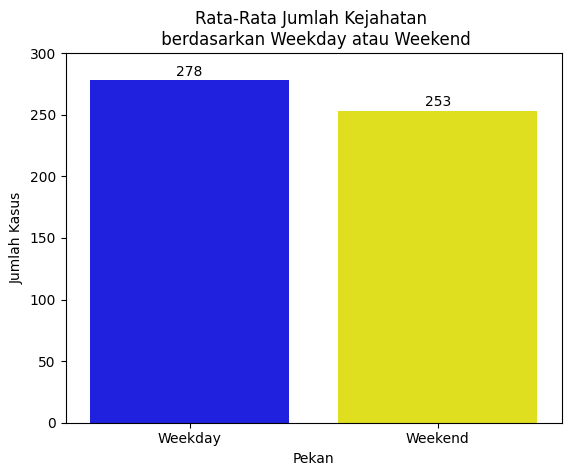

In [119]:
ax = sns.barplot(data=kasus_harian, x='Pekan', y = 'Jumlah Kasus', ci=0, palette=['Blue', 'Yellow'])
plt.title(f'Rata-Rata Jumlah Kejahatan \n berdasarkan Weekday atau Weekend')
container = ax.containers[0]
ax.bar_label(container , labels=[f'{x:,.0f}' for x in container.datavalues], label_type='edge', padding = 1)
plt.yticks(range(0,301,50))
ax;

In [120]:
from scipy.stats import normaltest

stat, pvalue = normaltest(kasus_harian['Jumlah Kasus'])

pvalue

if pvalue > 0.05 :
    print(f'pvalue={pvalue}, data terdistribusi normal')
else :
    print(f'pvalue={pvalue}, data tidak terdistribusi normal')

pvalue=3.998281239694929e-06, data tidak terdistribusi normal


Untuk mengujinya, kita menggunakan uji normalitas, ternyata kita dapatkan bahwa data tidak terdistribusi normal (p value < 0.05)

Hipotesa:

    * Ho: Median tingkat kejahatan saat 'Weekday' sama dengan  Median jumlah kasus pada 'Weekend'
    * Ha: Median tingkat kejahatan pada 'Weekday' tidak sama dengan Median jumlah kasus pada 'Weekend'

Selanjutnya mari kita buat code untuk terima /tolak Ho

In [121]:
from scipy.stats import mannwhitneyu

stat, pvalue = mannwhitneyu(
    kasus_harian[kasus_harian['Pekan']=='Weekday']['Jumlah Kasus'],
    kasus_harian[kasus_harian['Pekan']=='Weekend']['Jumlah Kasus']
)


if pvalue > 0.05:
    print(f'''
    Didapatkan bahwa p value= {pvalue}. ketika pvalue > 0.05 maka kita terima  Ho. 
    Dengan kata lain kita tidak punya cukup bukti bahwa median tingkat kejahatan pada 'Weekday'
    tidak sama dengan median tingkat kejahatan pada saat 'Weekend'.
    ''')
else:
    print(f'''
    Didapatkan bahwa p value= {pvalue}. ketika <= 0.05 maka kita tolak Ho. 
    Kita punya cukup bukti bahwa median tingkat kejahatan pada 'Weekday'
    TIDAK SAMA DENGAN median tingkat kejahatan pada saat 'Weekend'.
    ''')


    Didapatkan bahwa p value= 1.2633655751511277e-33. ketika <= 0.05 maka kita tolak Ho. 
    Kita punya cukup bukti bahwa median tingkat kejahatan pada 'Weekday'
    TIDAK SAMA DENGAN median tingkat kejahatan pada saat 'Weekend'.
    


Dari hasil kalkulasi di atas kita mendapatkan bahwa median tingkat kejahatan pada saat weekday tidak sama dengan median tingkat kejahatan pada saat weekend.

**ANALISA BERDASARKAN TEMPAT KEJADIAN** (EDA-ABT)

* Kejahatan Pada Tiap Distrik (EDA-ABT-KTD)

Lalu pada tahap ini kita akan melakukan analisa berdasarkan tempat kejadian / dari prespektif geografis.

In [122]:
urutan_distrik = list(df['DISTRICT'].value_counts().reset_index()['index'])

In [123]:
def countplot_crime(time, judul, urutan, labeling=0) :  
    plt.figure(figsize=(12,6))
    ax = sns.countplot(data=df, x=time, color='navy', order=urutan)
    plt.title(f'Jumlah Kejahatan Pada Tiap {judul}')
    plt.xlabel(f'{judul}')
    plt.ylabel('Jumlah Kasus')
    if labeling == 1:
        container = ax.containers[0]
        ax.bar_label(container , labels=[f'{x:,.0f}' for x in container.datavalues], label_type='edge', padding = 1)
    return ax

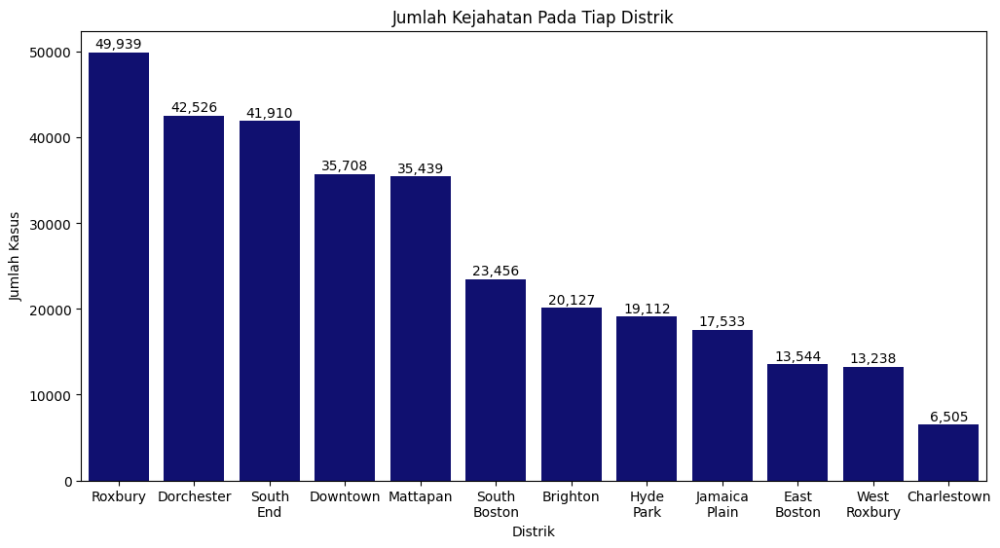

In [124]:
countplot_crime('DISTRICT', 'Distrik', urutan_distrik, 1);
distrik = ['Roxbury','Dorchester','South\nEnd','Downtown','Mattapan','South\nBoston',
 'Brighton','Hyde\nPark','Jamaica\nPlain','East\nBoston','West\nRoxbury','Charlestown']
plt.xticks(np.arange(12), distrik);

Dari graph di atas kita mendapatkan bahwa tingkat kejahatan tertinggi terjadi di Roxbury, sedangkan yang terendah terjadi di Charlestown

* Korelasi Area Dengan Tingkat Kejahatan (EDA-ABT-KOR)

In [125]:
#  list untuk menampilkan banyaknya area yang unik pada stiap district
df_C = df.groupby('DISTRICT').nunique()[['REPORTING_AREA']].reset_index().rename(columns={'DISTRICT':'Distrik','REPORTING_AREA':'Jumlah Area'})

# list untuk menampilkan banyaknya jumlah kasus pada setiap district
df_D = df['DISTRICT'].value_counts().to_frame().reset_index().rename(columns={'index' : 'Distrik','DISTRICT':'Jumlah Kasus'})

# membuat tabel berisi Nama Distrik, Jumlah Area dan Jumlah Kasus pada setiap District
tabel_distrik = df_C.merge(df_D)


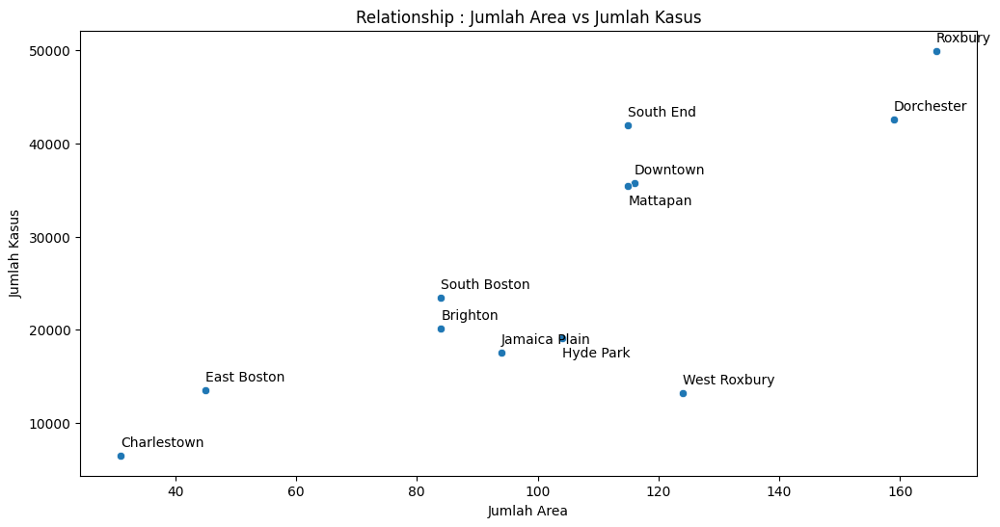

In [126]:
plt.figure(figsize=(12,6))
sns.scatterplot(data=tabel_distrik, x='Jumlah Area', y='Jumlah Kasus');
plt.title('Relationship : Jumlah Area vs Jumlah Kasus')
geser = [1000, 1000, 1000, 1000, 1000, -2000, 1000, -2000, 1000, 1000, 1000, 1000]
for i, txt in enumerate(tabel_distrik['Distrik']):
    plt.annotate(txt, (tabel_distrik['Jumlah Area'][i], tabel_distrik['Jumlah Kasus'][i]+ geser[i]))

Kemudian kita hitung nilai korelasi dengan metode spearman

In [127]:
tabel_distrik[['Jumlah Area', 'Jumlah Kasus']].corr(method='spearman')

,Jumlah Area,Jumlah Kasus
Jumlah Area,1.000000,0.677197
Jumlah Kasus,0.677197,1.000000


INSIGHT:

Dari graph di atas terlihat bahwa semakin tinggi jumlah area, maka tingkat kejahatan juga semakin tinggi(berkorelasi positif)

Contohnya bisa kita lihat pada kota Roxbury, dengan kasus sekitar 50000 kasus, memiliki 160 wilayah,
sedangkan pada kota Charlestown dengan kasus dibawah 10000 kasus, hanya memiliki sekitar 10 hingga 40 wilayah

Secara teknis, melalui uji korelasi Spearman didapat nilai r = 0.676, jal ini menunjukan korelasi positif ketika jumlah area tinggi, maka tingkat kejahatan juga tinggi (nilai r = 0.67 menunjukan bahwa jumlah area dan tingkat kejahatan memiliki hubungan yang kuat)


- Peta Sebaran Kejahatan (EDA-ABT-PSK)

Selanjutnya mari melihat peta sebaran kejahatan,

pertama kita mulai dari District Roxbury terlebih dahulu, karena dari informasi yang saya himpun dari https://en.wikipedia.org/wiki/Boston#:~:text=The%20geographical%20center%20of%20Boston,Boston%20is%20the%20North%20End , bahwa Roxbury merupakan pusat geografis di kota Boston.

Maka sari itu dalam pembuatan graph folium, saya mempertimbangkan untuk menggunakan koordinat dari Roxbury

In [128]:

import folium
from folium.plugins import HeatMap

boston_coor = folium.Map(
    location=(42.315198, -71.091375),
    zoom_start=12, min_zoom=12,
)

# heatmap untuk seluruh insiden kejahatan
heat_df = df[['Lat', 'Long']]
heat_df = [[row['Lat'],row['Long']] for index, row in heat_df.iterrows()]

# marker 

distrik = ['Roxbury','Mattapan','Dorchester','Jamaica Plain','South End','South Boston','Hyde Park','Brighton','West Roxbury','East Boston','Downtown','Charlestown']
lat_boston = [42.315198, 42.277142, 42.30163, 42.3097365, 42.338811, 42.3381437, 42.256529, 42.34635, 42.279755, 42.370214, 42.355709, 42.3782065]
long_boston = [-71.091375, -71.091375, -71.067605, -71.1151431, -71.076519, -71.0475773, -71.124056, -71.162676, -71.162676, -71.03886, -71.057205,-71.0602131]
warna = ['red', 'blue', 'blue', 'blue', 'blue', 'blue', 'blue', 'blue', 'blue', 'blue', 'blue', 'blue']
for i in range(len(distrik)) :
    district_boston = folium.Marker(
        location=(lat_boston[i], long_boston[i]),
        popup= folium.Popup(f"<b>{distrik[i]}</b>", max_width=300),
        tooltip= f"{distrik[i]}",
        icon = folium.Icon(color=warna[i], icon='home')
        )
    boston_coor.add_child(district_boston)

HeatMap(heat_df,
        gradient={0.1: 'blue', 0.3: 'lime', 0.5: 'yellow', 0.7: 'orange', 1: 'red'}, 
        min_opacity=0.05, 
        max_opacity=0.9, radius=22).add_to(boston_coor)

boston_coor

INSIGHT:

Dari peta di atas, kita mendapatkan fakta bahwa 3 kota dengan kejahatan tertinggi, yaitu Roxbury, Dorchester, dan South Boston saling berdekatan, dan ketiganya mendekat dengan tengah kota boston, sehingga melalui kondisi geografis di atas bisa menunjukan indikasi bahwa kejahatan juga terjadi sering pada daerah sekitarnya/ yang paling dekat.

terkait kejahatan di kota Roxbury, saya juga mendapatkan referensi pendukung, bahwa kota ini merupakan kota yang paling berbahaya, https://estatousa.com/bad-neighborhoods-in-boston/

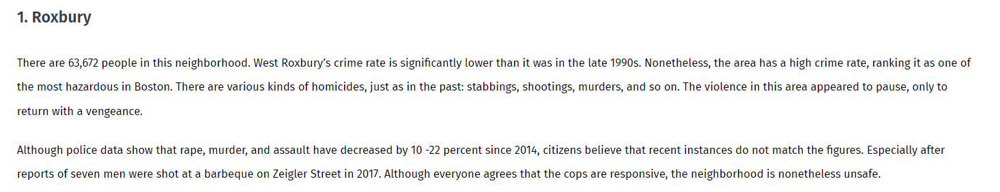

SARAN:
Maka dari bagi pendatang dari luar kota / manca negara, perlu berhati-hati ketika berkunjung / tinggal di area tersebut. Pengunjung dan pelancong wanita disarankan untuk membatasi jalan kaki dan bersepeda hanya pada siang hari, karena malam hari mungkin berbahaya.

* District Berdasarkan Kasus Penembakan (EDA-ABT-DKP)

Pada tahap ini kita akan mencari informasi district dengan kasus penembakan tertinggi

In [129]:
shooting = df[df['SHOOTING']=='Y'][['DISTRICT']]

shooting_by_district = shooting.value_counts().reset_index().rename(columns={'DISTRICT':'Distrik',0 :'Jumlah Kasus Penembakan'})

urutan_distrik = list(shooting_by_district['Distrik'])


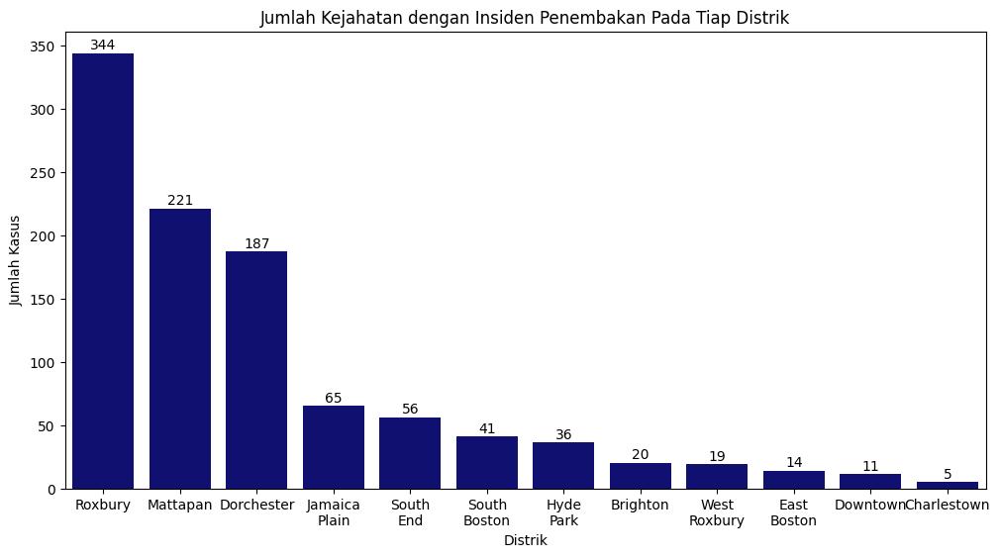

In [130]:
plt.figure(figsize=(12,6))
ax = sns.countplot(data=shooting, x='DISTRICT', color='navy', order=urutan_distrik)
plt.title(f'Jumlah Kejahatan dengan Insiden Penembakan Pada Tiap Distrik')
plt.xlabel(f'Distrik')
plt.ylabel('Jumlah Kasus')
container = ax.containers[0]
ax.bar_label(container , labels=[f'{x:,.0f}' for x in container.datavalues], label_type='edge', padding = 1)
distrik = ['Roxbury','Mattapan','Dorchester','Jamaica\nPlain','South\nEnd','South\nBoston','Hyde\nPark',
 'Brighton','West\nRoxbury','East\nBoston','Downtown','Charlestown']
plt.xticks(np.arange(12), distrik);
ax;

INSIGHT:

Dari graph di atas, khususnya pada Roxbury, selain tingkat kejahatannya sangat tinggi, ternyata kejahatan yang melibatkan penembakan juga paling tinggi.

* Jenis Kejahatan Tertinggi Berdasarkan District (EDA-ABT-JKD)

In [131]:
top = ['Larceny', 'Larceny From Motor Vehicle', 'Aggravated Assault', 'Drug Violation', 'Simple Assault', 'Vandalism', 'Motor Vehicle Accident Response', 'Medical Assistance', 'Investigate Person']
df_top = df[df['OFFENSE_CODE_GROUP'].isin(top)]

In [132]:
df_top_by_district = df_top.groupby(['OFFENSE_CODE_GROUP', 'DISTRICT']).count()['INCIDENT_NUMBER'].to_frame().reset_index()

In [133]:
df_max = df_top_by_district.groupby(['OFFENSE_CODE_GROUP']).max().reset_index().drop(columns='DISTRICT')
df_max

,OFFENSE_CODE_GROUP,INCIDENT_NUMBER
0,Aggravated Assault,1644
1,Drug Violation,2269
2,Investigate Person,2747
3,Larceny,7312
4,Larceny From Motor Vehicle,2023
5,Medical Assistance,3353
6,Motor Vehicle Accident Response,6407
7,Simple Assault,2510
8,Vandalism,2436


In [134]:
df_max.merge(df_top_by_district, on=['OFFENSE_CODE_GROUP', 'INCIDENT_NUMBER'])

,OFFENSE_CODE_GROUP,INCIDENT_NUMBER,DISTRICT
0,Aggravated Assault,1644,Roxbury
1,Drug Violation,2269,Roxbury
2,Investigate Person,2747,Roxbury
3,Larceny,7312,South End
4,Larceny From Motor Vehicle,2023,South End
5,Medical Assistance,3353,Roxbury
6,Motor Vehicle Accident Response,6407,Roxbury
7,Simple Assault,2510,Roxbury
8,Vandalism,2436,Roxbury


Dari table summary di atas kita dapat melihat bahwa jumlah kasus tertinggi untuk jenis kejahatan yang utama seperti 'Aggravated Assault', 'Drug Violation', 'Simple Assault', 'Vandalism', 'Motor Vehicle Accident Response', 'Medical Assistance', dan 'Investigate Person' terjadi di distrik Roxbury.
Sedangkan jumlah kasus tertinggi untuk jenis kejahatan 'Larceny' dan 'Larceny From Motor Vehicle' terjadi di distrik South End.

**ANALISA BERDASARKAN JENIS KEJAHATAN**

* Berdasarkan Jenis Kejahatan (EDA-AJK-BJK)

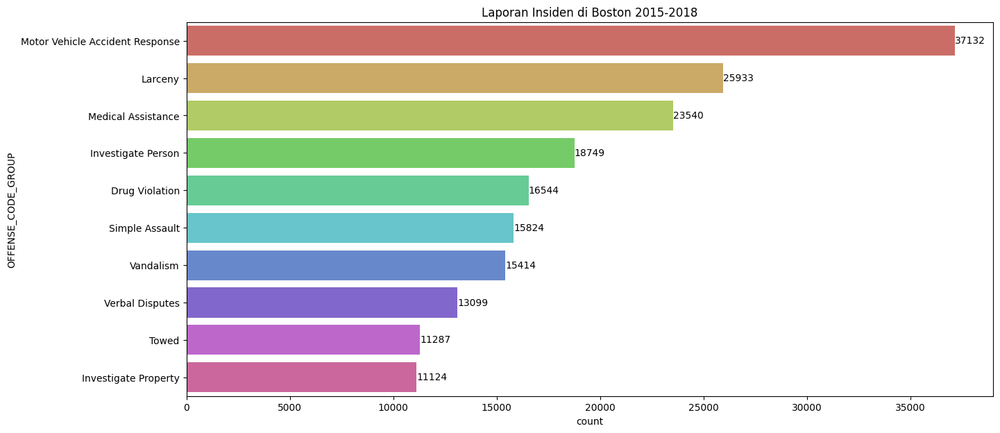

In [135]:
plt.figure(figsize=(15,7))
ax=sns.countplot(y="OFFENSE_CODE_GROUP", data=df, palette="hls",order = df[df['OFFENSE_CODE_GROUP']!='Other']['OFFENSE_CODE_GROUP'].value_counts().head(10).index)
ax.bar_label(ax.containers[0], label_type='edge')
plt.title('Laporan Insiden di Boston 2015-2018')
plt.show()

Jika dilihat berdarkan semua UCR, dapat kita simpulkan bahwa insiden terbanyak di kota Boston adalah kecelakaan kendaraan bermotor, agar lebih akurat, mari kita selection berdasarkan Part One Crime saja.

In [136]:
one_df=df[df['UCR_PART']=='Part One'].value_counts('OFFENSE_CODE_GROUP').rename_axis('Offense').to_frame('Count').reset_index()

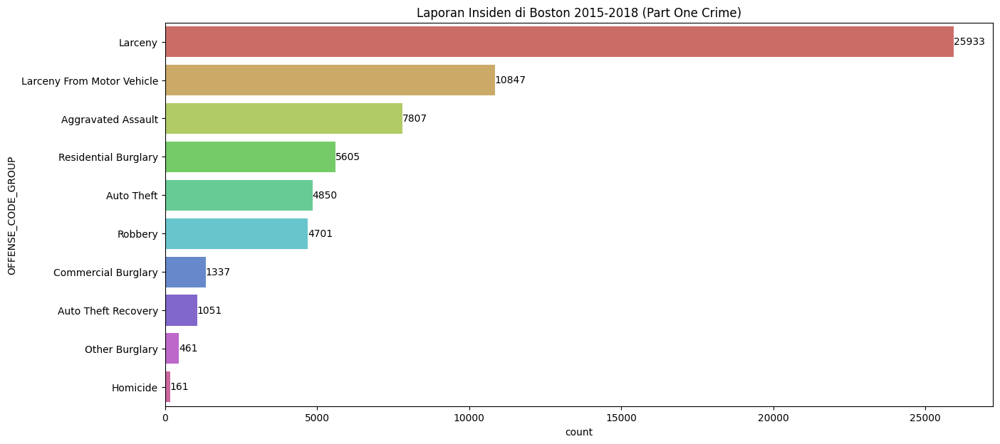

In [137]:
plt.figure(figsize=(15,7))
ax=sns.countplot(y="OFFENSE_CODE_GROUP", data=df, palette="hls",order = df[(df['OFFENSE_CODE_GROUP']!='Other')&(df['UCR_PART']=='Part One')]['OFFENSE_CODE_GROUP'].value_counts().head(10).index)
ax.bar_label(ax.containers[0], label_type='edge')
plt.title('Laporan Insiden di Boston 2015-2018 (Part One Crime)')
plt.show()

Dari graph di atas, jika kita selection berdasarkan Part One saja maka kita dapati bawha pelanggaran yang paling banyak terjadi adalah terkait pencurian, sangat jauh dibandingkan dengan jenis kejahatan lainnya, belum lagi ditambah dengan pencurian kejahatan bermotor di peringkat ke dua.

Selanjutnya kita juga perlu melihat grafik pareto untuk mengetahui jenis laporan insiden apa yang perlu menjadi fokus bagi pihak kepolisian.

In [138]:
one_df["cumpercentage"] = one_df["Count"].cumsum()/one_df["Count"].sum()*100

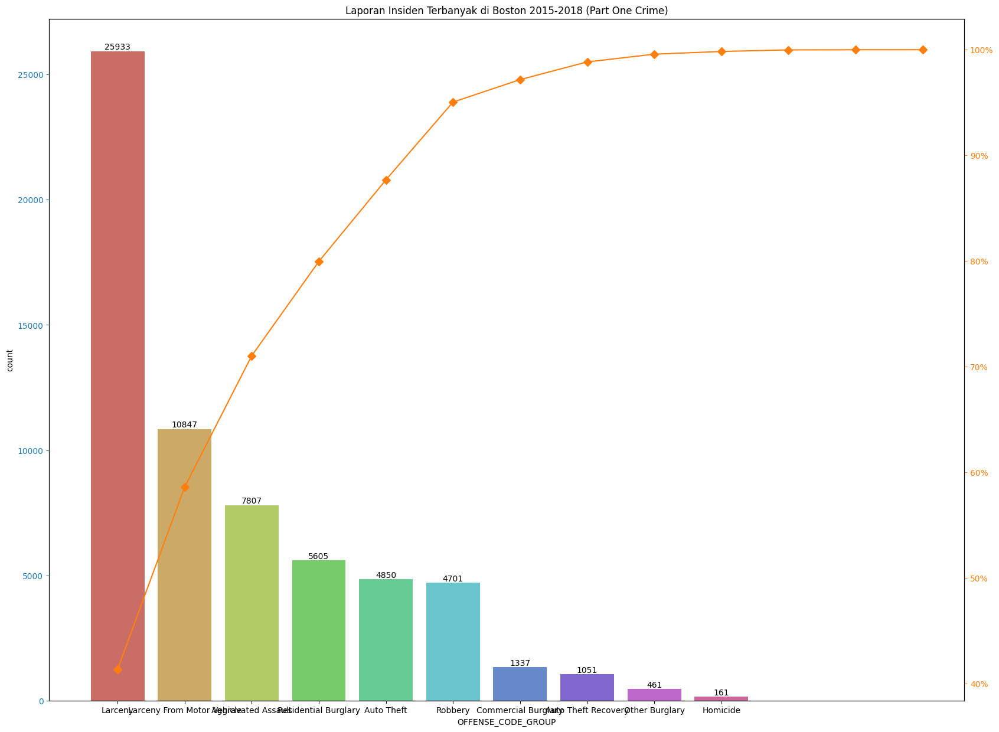

In [139]:
plt.figure(figsize=(20,15))
ax=sns.countplot(x="OFFENSE_CODE_GROUP", data=df, palette="hls",order = df[(df['OFFENSE_CODE_GROUP']!='Other')&(df['UCR_PART']=='Part One')]['OFFENSE_CODE_GROUP'].value_counts().head(10).index)
ax.bar_label(ax.containers[0], label_type='edge')
ax2 = ax.twinx()
ax2.plot(one_df.index, one_df["cumpercentage"], color="C1", marker="D", ms=7)
ax2.yaxis.set_major_formatter(PercentFormatter())
ax.tick_params(axis="y", colors="C0")
ax2.tick_params(axis="y", colors="C1")
plt.title('Laporan Insiden Terbanyak di Boston 2015-2018 (Part One Crime)')
plt.show()

INSIGHT:

Jika kita menggunakan prinsip pareto, bahwa 20% object memilki hubungan sebab akibat dengan 80% object lainnya, maka kita bisa relevansikan dengan kasus yang ada, yakni 80% kasus yang ada didominasi oleh kasus Larcency, Larcency From Motor Vehicle dan Aggravated Assault, jika kita bisa menyelesaikan ketiga masalah tersebut, maka akan memberikan dampak yang signifikan dalam hal menurunkan tingkat kejahatan di Boston.

Selanjutnya graph di bawah ini adalah untuk memperjelas apa yang sudah saya jabarkan sebelumnya, namun dalam graph treemap.

In [140]:
total_per_crime = df["OFFENSE_CODE_GROUP"].value_counts().rename_axis("OFFENSE_CODE_GROUP").reset_index(name= "JUMLAH")
total_per_crime.head(10)

,OFFENSE_CODE_GROUP,JUMLAH
0,Motor Vehicle Accident Response,37132
1,Larceny,25933
2,Medical Assistance,23540
3,Investigate Person,18749
4,Other,18073
5,Drug Violation,16544
6,Simple Assault,15824
7,Vandalism,15414
8,Verbal Disputes,13099
9,Towed,11287


In [141]:

def treemap(categories, title, path, values):
    fig = px.treemap(categories, 
                     path = path, 
                     values = values, 
                     height = 700, 
                     title = title, 
                     color_discrete_sequence = px.colors.sequential.RdBu)
    fig.data[0].textinfo = 'label+text+value'
    fig.show()

treemap(total_per_crime, "Mayoritas Insiden Kota Boston", ["OFFENSE_CODE_GROUP"], total_per_crime["JUMLAH"])

* Kejahatan yang Melibatkan Penembakan (EDA-AJK-KMP)

Hal yang tidak kalah penting adalah mengetahui kejahatan yang melibatkan penembakan, karena jenis kejahata ini sangat berbahaya bagi masyarakat.

In [142]:
df_shooting = df.groupby('SHOOTING').size().reset_index(name = 'counts').set_index('SHOOTING')

In [143]:
df_shooting

,counts
SHOOTING,
N,318018
Y,1019


In [144]:
shooting_rate = df_shooting.loc['Y', 'counts']/df.shape[0]

In [145]:
shooting_rate

0.0031939869043402487

Text(0.5, 1.0, 'What percentage of crimes involve shooting?')

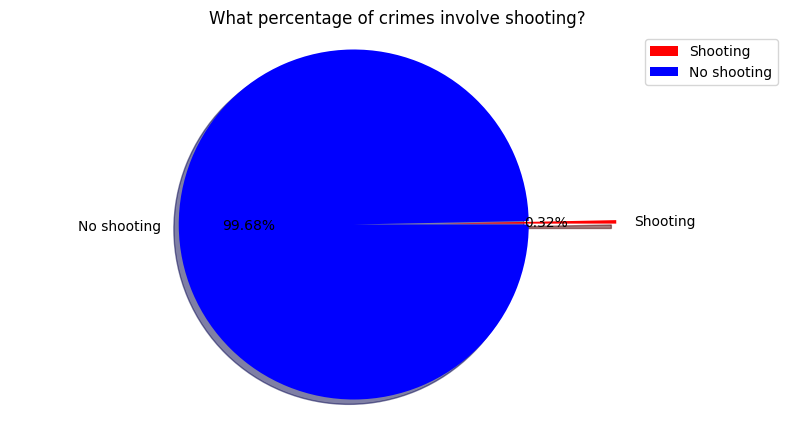

In [146]:
fig7 = plt.figure(figsize = (10,5))
labels = ['Shooting', 'No shooting']
ax7 = plt.subplot(111)
size = [shooting_rate, 1 - shooting_rate]
ax7.pie(size, explode = [0.5,0], labels = labels, autopct = '%1.2f%%', shadow = True, colors = ['red','blue'])
ax7.axis('equal')
ax7.legend()
ax7.set_title('What percentage of crimes involve shooting?')

INSIGHT:

Ternyata kita mendapatkan bahwa shooting rate masih cukup rendah, bila menggunakan prinsip pareto, masih jauh di bawah 20%, namun mengingat berbahayanya kasus penembakan, hal ini tetap menjadi perhatian yang serius

In [147]:
shootings = df[df['SHOOTING'] == 'Y']
shootings.head()

,INCIDENT_NUMBER,OFFENSE_CODE,OFFENSE_CODE_GROUP,OFFENSE_DESCRIPTION,DISTRICT,REPORTING_AREA,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,...,UCR_PART,STREET,Lat,Long,Location,districtNumber,boolean_loc,TIME,WEEK STATUS,HOUR_Part
1295,I182069509,413,Aggravated Assault,ASSAULT - AGGRAVATED - BATTERY,Hyde Park,540,Y,2018-08-29 23:19:00,2018,8,...,Part One,HILLIS RD,42.250405,-71.131737,"(42.25040550, -71.13173740)",E18,1111,Night,Weekday,Night
1860,I182068876,413,Aggravated Assault,ASSAULT - AGGRAVATED - BATTERY,Roxbury,183,Y,2018-08-27 22:56:00,2018,8,...,Part One,DUDLEY ST,42.321042,-71.072153,"(42.32104169, -71.07215291)",B2,1111,Night,Weekday,Night
3259,I182067317,111,Homicide,"MURDER, NON-NEGLIGIENT MANSLAUGHTER",Roxbury,312,Y,2018-08-22 15:00:00,2018,8,...,Part One,HOLLANDER ST,42.315689,-71.089514,"(42.31568920, -71.08951391)",B2,1111,Afternoon,Weekday,Late Afternoon
3260,I182067317,2662,Ballistics,BALLISTICS EVIDENCE/FOUND,Roxbury,312,Y,2018-08-22 15:00:00,2018,8,...,Part Two,HOLLANDER ST,42.315689,-71.089514,"(42.31568920, -71.08951391)",B2,1111,Afternoon,Weekday,Late Afternoon
4107,I182066420,413,Aggravated Assault,ASSAULT - AGGRAVATED - BATTERY,Charlestown,900,Y,2018-08-19 22:46:00,2018,8,...,Part One,MCNULTY CT,42.378085,-71.057841,"(42.37808452, -71.05784115)",A15,1111,Night,Weekend,Night


In [148]:
def offense_groups_countplot(data, title, xlabel, ylabel, size):
    plt.figure(figsize=size)
    ax = sns.countplot(y=data['OFFENSE_CODE_GROUP'], palette='viridis', order=data['OFFENSE_CODE_GROUP'].value_counts().index)
    ax.xaxis.set_major_locator(MaxNLocator(integer=True))
    plt.title(title, fontsize=16, fontweight='bold', pad=10)
    plt.xlabel(xlabel, weight='bold')
    plt.ylabel(ylabel, weight='bold')
    plt.tight_layout()
    plt.show()


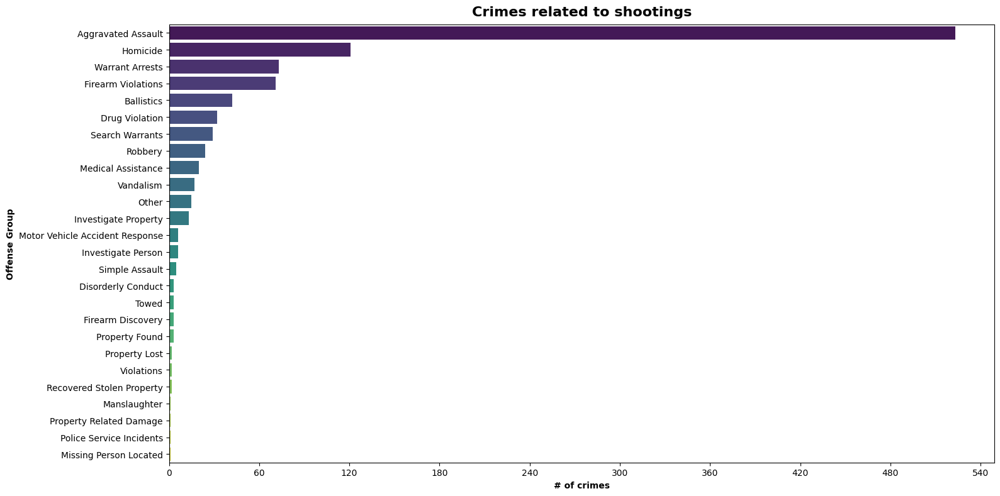

In [149]:
offense_groups_countplot(shootings, 'Crimes related to shootings', '# of crimes', 'Offense Group', (16,8))

In [150]:
def heatmap_plot(data, title):
    plt.figure(figsize=(10,3))
    ax = sns.heatmap(data, cmap='BuPu')
    ax.xaxis.set_ticks_position('top')
    _ = plt.xlabel('')
    _ = plt.ylabel('')
    _ = plt.title(title, fontsize=16, fontweight='bold', pad=10)
    plt.tight_layout()
    plt.show()


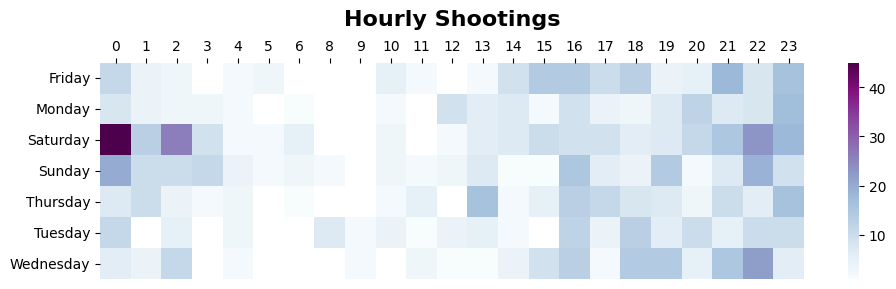

In [151]:
shootings_dow = shootings.pivot_table(index='DAY_OF_WEEK', columns='HOUR', values='INCIDENT_NUMBER', aggfunc='count')
heatmap_plot(shootings_dow, 'Hourly Shootings')

INSIGHT:

Dari graph tersebut terlihat bahwa kejadian ejahatan yang melibatkan penembakan terjadi pada hari Sabtu dini hari, diasumsikan pada jam-jam tersebut banyak orang yang keluar malam hari / melakukan refreshinkg setelah 5 hari bekerja, apalagi keesokan harinya adalah hari libur.

Salah satu faktor yang memungkinan adalah karena mabuk, ketika mabuk orang menjadi lebih sembrono

SARAN:

Pihak kepolisian harus berjaga di sektar bar / ataupun tempat hiburan malam lainnya, khususnya pada Jumat malam hingga Sabtu dini hari.

Mari kita lihat apa yang menyebabkan penembakan oleh offense group pada Sabtu malam

In [152]:
display(shootings['DISTRICT'].value_counts() / len(shootings))
print((shootings['DISTRICT'].value_counts() / len(shootings))[:3].sum())

Roxbury          0.337586
Mattapan         0.216879
Dorchester       0.183513
Jamaica Plain    0.063788
South End        0.054956
South Boston     0.040236
Hyde Park        0.035329
Brighton         0.019627
West Roxbury     0.018646
East Boston      0.013739
Downtown         0.010795
Charlestown      0.004907
Name: DISTRICT, dtype: float64

0.7379784102060845


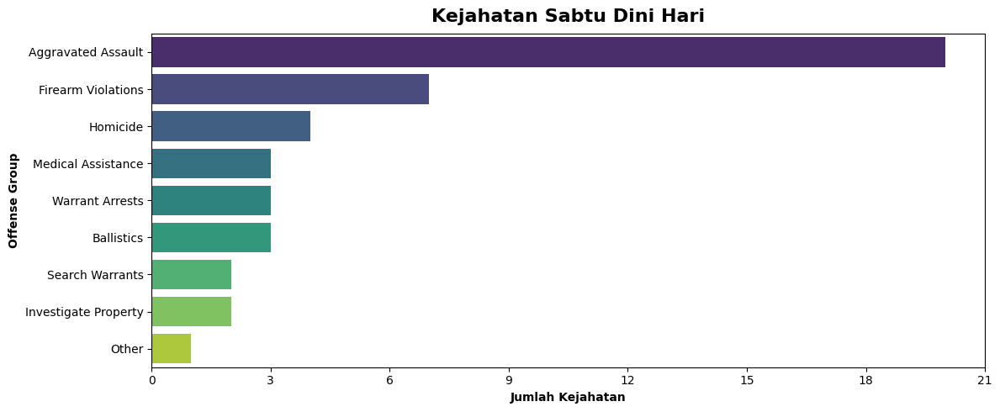

In [153]:
shootings_sat = shootings[shootings['DAY_OF_WEEK'].eq('Saturday') & shootings['HOUR'].eq(0)]
offense_groups_countplot(shootings_sat, "Kejahatan Sabtu Dini Hari", 'Jumlah Kejahatan', 'Offense Group', (12,5))

INSIGHT:

Jenis kejahatan yang melibatkan penembakan, paling banyak terjadi pada jenis Aggravated Assault, yaitu serangan terhadap orang lain yang bertujuan untuk menimbulkan luka pada tubuh. Diikuti dengan penyalahgunaan senjata, dan selanjutnya adalah pembunuhan

SARAN:

Pihak pemerintah harus membatasi peredaran senjata secara ketat. Jika kita lihat gejolak politik di U.S, kebijakan terkait kepemilikan senjata api memang masih belum mendapatkan kesepakatan yang terbaik, masih maju mundur, dan terus terjadi dialektika antara pemerintah dengan pihak yang menentang, misalnya dari Asosiasi Senapan Nasional (NSA), dengan dalih bahwa dengan memiliki senjata api, justru membuat AS lebih aman sebagai perlindungan diri. Bahkan dukungan terhadap larangan senpi juga belum menunjukan hasil yang sesuai

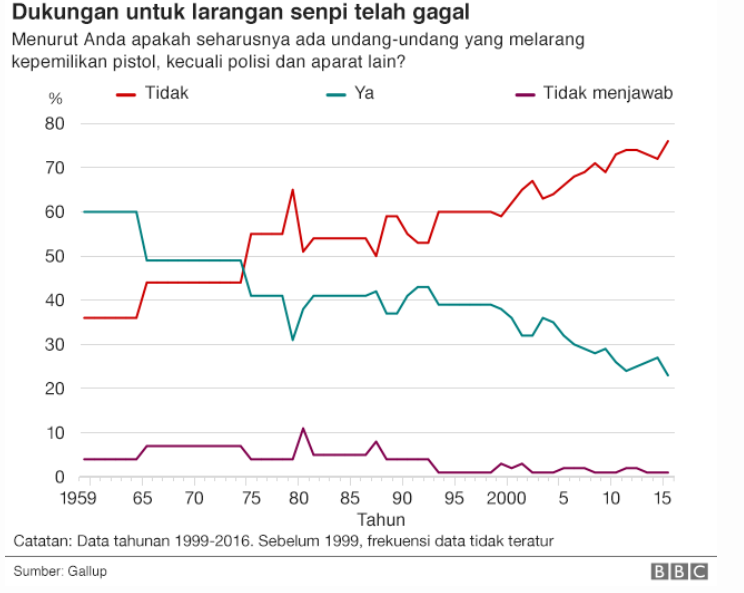

Untuk selengkapnya dapat dibaca di https://www.bbc.com/indonesia/dunia-41497615

In [154]:
display(shootings['DISTRICT'].value_counts() / len(shootings))
print((shootings['DISTRICT'].value_counts() / len(shootings))[:3].sum())

Roxbury          0.337586
Mattapan         0.216879
Dorchester       0.183513
Jamaica Plain    0.063788
South End        0.054956
South Boston     0.040236
Hyde Park        0.035329
Brighton         0.019627
West Roxbury     0.018646
East Boston      0.013739
Downtown         0.010795
Charlestown      0.004907
Name: DISTRICT, dtype: float64

0.7379784102060845


Dari tabel di atas, penembakan paling banyak terjadi di kota Roxbury, lalu dikuti dengan Mattapan, dan Dorchester.

* Kejahatan yang Muncul Bersamaan (EDA-AJK-KMB)

Berikutnya kita akan melakukan analisa terhadap kejahatan yang muncul secara bersamaan.

In [155]:
# membuat tabel yang berisi duplikat incident number sekaligus Ofeense description.
simultant_crime = df[df.duplicated(subset=['INCIDENT_NUMBER'], keep=False)][['INCIDENT_NUMBER','OFFENSE_DESCRIPTION']].sort_values(['INCIDENT_NUMBER','OFFENSE_DESCRIPTION'])

# membuat kolom number_and_offense menggabungkan INCIDENT_NUMBER dan 'OFFENSE_DESCRIPTION' 
simultant_crime['number_and_offense'] = list(zip(simultant_crime['INCIDENT_NUMBER'], simultant_crime['OFFENSE_DESCRIPTION']))
simultant_crime

,INCIDENT_NUMBER,OFFENSE_DESCRIPTION,number_and_offense
319046,I030217815,"MURDER, NON-NEGLIGIENT MANSLAUGHTER","(I030217815, MURDER, NON-NEGLIGIENT MANSLAUGHTER)"
319047,I030217815,WARRANT ARREST,"(I030217815, WARRANT ARREST)"
319043,I060168073,DRUGS - POSS CLASS D - INTENT MFR DIST DISP,"(I060168073, DRUGS - POSS CLASS D - INTENT MFR DIST DISP)"
319044,I060168073,WARRANT ARREST,"(I060168073, WARRANT ARREST)"
319042,I080542626,"DRUGS - POSS CLASS B - COCAINE, ETC.","(I080542626, DRUGS - POSS CLASS B - COCAINE, ETC.)"
...,...,...,...
41,I182070889,DRUGS - POSS CLASS A - INTENT TO MFR DIST DISP,"(I182070889, DRUGS - POSS CLASS A - INTENT TO MFR DIST DISP)"
39,I182070889,DRUGS - POSS CLASS B - INTENT TO MFR DIST DISP,"(I182070889, DRUGS - POSS CLASS B - INTENT TO MFR DIST DISP)"
40,I182070889,WARRANT ARREST,"(I182070889, WARRANT ARREST)"
27,I182070904,ASSAULT SIMPLE - BATTERY,"(I182070904, ASSAULT SIMPLE - BATTERY)"


In [156]:
number_and_offense = list(simultant_crime['number_and_offense'])

# pada listing ini kita menggabungkan offense code dengan incident number
from collections import defaultdict

offense_by_incident_number = defaultdict(list)

for incident_number, offense in number_and_offense:
    offense_by_incident_number[incident_number].append(offense)

dict(offense_by_incident_number) 

# mengambil value offense_code
offense_description = list(offense_by_incident_number.values())
offense_description

[['MURDER, NON-NEGLIGIENT MANSLAUGHTER', 'WARRANT ARREST'],
 ['DRUGS - POSS CLASS D - INTENT MFR DIST DISP', 'WARRANT ARREST'],
 ['DRUGS - POSS CLASS B - COCAINE, ETC.',
  'DRUGS - POSS CLASS D - INTENT TO MFR DIST DISP',
  'WARRANT ARREST'],
 ['ASSAULT & BATTERY D/W - OTHER', 'WARRANT ARREST'],
 ['VAL - OPERATING AFTER REV/SUSP.', 'VAL - OPERATING AFTER REV/SUSP.'],
 ['ROBBERY - UNARMED - STREET', 'WARRANT ARREST'],
 ['LARCENY OTHER $50 TO $199', 'WARRANT ARREST'],
 ['ASSAULT SIMPLE - BATTERY', 'WARRANT ARREST'],
 ['LARCENY ALL OTHERS', 'WARRANT ARREST'],
 ['ASSAULT & BATTERY D/W - OTHER', 'WARRANT ARREST'],
 ['LARCENY SHOPLIFTING $50 TO $199', 'WARRANT ARREST'],
 ['INVESTIGATE PERSON', 'PROSTITUTION - COMMON NIGHTWALKER', 'WARRANT ARREST'],
 ['TRESPASSING', 'WARRANT ARREST'],
 ['ASSAULT SIMPLE - BATTERY', 'WARRANT ARREST'],
 ['DRUGS - POSS CLASS A - INTENT TO MFR DIST DISP',
  'SEARCH WARRANT',
  'WARRANT ARREST'],
 ['LARCENY ALL OTHERS', 'THREATS TO DO BODILY HARM', 'WARRANT ARREST'

In [157]:
# membuat pasangan offese desc untuk setiap list kejahatan, dengan incident number yang sama.
import itertools

pasangan_kejahatan = []

for offense in offense_description :
    for pair in itertools.combinations(offense,2):
        pasangan_kejahatan.append(pair)

pasangan_kejahatan

[('MURDER, NON-NEGLIGIENT MANSLAUGHTER', 'WARRANT ARREST'),
 ('DRUGS - POSS CLASS D - INTENT MFR DIST DISP', 'WARRANT ARREST'),
 ('DRUGS - POSS CLASS B - COCAINE, ETC.',
  'DRUGS - POSS CLASS D - INTENT TO MFR DIST DISP'),
 ('DRUGS - POSS CLASS B - COCAINE, ETC.', 'WARRANT ARREST'),
 ('DRUGS - POSS CLASS D - INTENT TO MFR DIST DISP', 'WARRANT ARREST'),
 ('ASSAULT & BATTERY D/W - OTHER', 'WARRANT ARREST'),
 ('VAL - OPERATING AFTER REV/SUSP.', 'VAL - OPERATING AFTER REV/SUSP.'),
 ('ROBBERY - UNARMED - STREET', 'WARRANT ARREST'),
 ('LARCENY OTHER $50 TO $199', 'WARRANT ARREST'),
 ('ASSAULT SIMPLE - BATTERY', 'WARRANT ARREST'),
 ('LARCENY ALL OTHERS', 'WARRANT ARREST'),
 ('ASSAULT & BATTERY D/W - OTHER', 'WARRANT ARREST'),
 ('LARCENY SHOPLIFTING $50 TO $199', 'WARRANT ARREST'),
 ('INVESTIGATE PERSON', 'PROSTITUTION - COMMON NIGHTWALKER'),
 ('INVESTIGATE PERSON', 'WARRANT ARREST'),
 ('PROSTITUTION - COMMON NIGHTWALKER', 'WARRANT ARREST'),
 ('TRESPASSING', 'WARRANT ARREST'),
 ('ASSAULT SIMPL

In [158]:

#tabel untuk menampilkan pasangan offense.
df_pasangan_kejahatan = pd.Series(pasangan_kejahatan).value_counts().to_frame().reset_index().rename(columns={'index' : 'Jenis Kejahatan', 0 : 'Jumlah Kasus'})
df_pasangan_kejahatan

,Jenis Kejahatan,Jumlah Kasus
0,"(MISSING PERSON, MISSING PERSON - LOCATED)",2729
1,"(LARCENY THEFT FROM MV - NON-ACCESSORY, VANDALISM)",751
2,"(LARCENY SHOPLIFTING, WARRANT ARREST)",517
3,"(DRUGS - POSS CLASS B - COCAINE, ETC., WARRANT ARREST)",502
4,"(ASSAULT - AGGRAVATED - BATTERY, ASSAULT SIMPLE - BATTERY)",496
...,...,...
3760,"(DRUGS - POSS CLASS D, RECOVERED - MV RECOVERED IN BOSTON (STOLEN OUTSIDE BOSTON))",1
3761,"(DISTURBING THE PEACE, SUDDEN DEATH)",1
3762,"(INVESTIGATE PROPERTY, LIQUOR - DRINKING IN PUBLIC)",1
3763,"(BURGLARY - COMMERICAL - NO FORCE, FORGERY / COUNTERFEITING)",1


C:\Users\andis\AppData\Local\Temp\ipykernel_16928\2253860775.py:4: FutureWarning:



The `ci` parameter is deprecated. Use `errorbar=('ci', 0)` for the same effect.




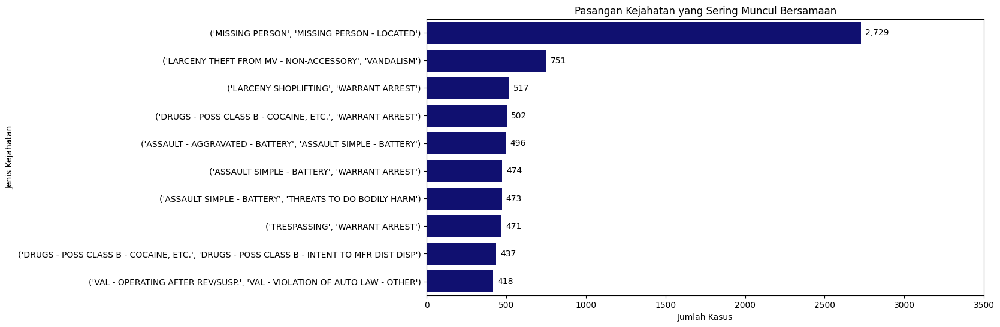

In [159]:
#visualisasi data.

plt.figure(figsize=(12,6))
ax = sns.barplot(data=df_pasangan_kejahatan.head(10), x = 'Jumlah Kasus', y ='Jenis Kejahatan', ci=0, order=df_pasangan_kejahatan.head(10)['Jenis Kejahatan'], palette=['navy'])
plt.title(f'Pasangan Kejahatan yang Sering Muncul Bersamaan')
container = ax.containers[0]
ax.bar_label(container , labels=[f'{x:,.0f}' for x in container.datavalues], label_type='edge', padding = 5)
plt.xticks(range(0,3501,500))
ax;

Maka didapatkan bahwa offense_description yang sering terjadi bersamaan yaitu :
Missing Person dan Missing Person - Located, lalu Larceny Theft From MV - Non Accesory dan Vandalism, diikuti Larceny Shoplifting dan Warrant Arrest.

    Namun, karena 'Missing Person - Located'  dan 'Warrant Arrest'  adalah aksi yang dilakukan langsung oleh kepolisian, maka pasangan kejahatan yang sering terjadi bersamaan yaitu: 
    1. Larceny Theft From MV - Non Accesory dan Vandalism
    2. Assault-Aggravated-Battery dan Assault Simple-Battery
    3. Assault Simple-Battery dan Threats To Do Bodily Harm

* Jenis Kejahatan Tertinggi Berdasarkan UCR Part (EDA-AJK-UCR)

Pertama-tama kita perlu melihat jenis tindakan kriminal apa yang paling sering terjadi pada selang waktu 2015-2018

In [160]:
df[df['UCR_PART']=='Part One'].value_counts('OFFENSE_CODE_GROUP').rename_axis('Offense').to_frame('Count').reset_index()
# df.groupby('OFFENSE_CODE_GROUP').agg('count')

,Offense,Count
0,Larceny,25933
1,Larceny From Motor Vehicle,10847
2,Aggravated Assault,7807
3,Residential Burglary,5605
4,Auto Theft,4850
5,Robbery,4624
6,Commercial Burglary,1337
7,Auto Theft Recovery,1051
8,Other Burglary,461
9,Homicide,161


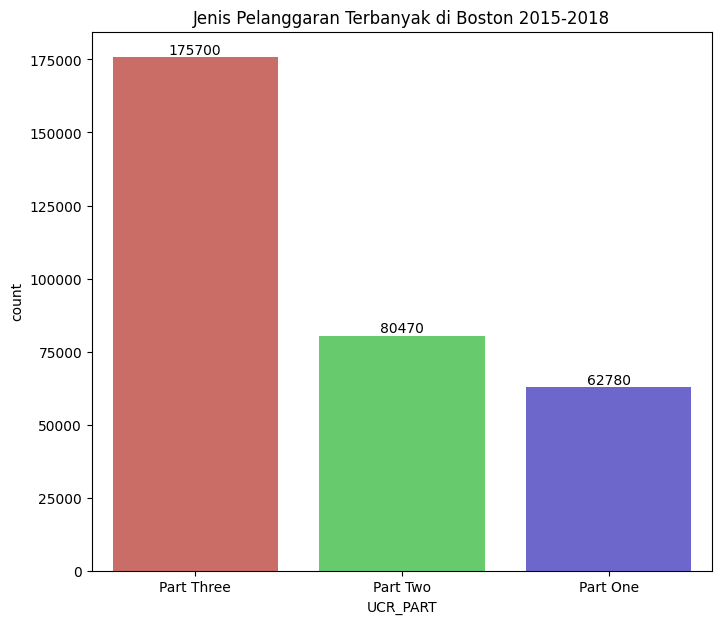

In [161]:
plt.figure(figsize=(8,7))
ax=sns.countplot(x="UCR_PART", data=df, palette="hls", order = df[df['UCR_PART']!='Other']['UCR_PART'].value_counts().index)
ax.bar_label(ax.containers[0], label_type='edge')
plt.title('Jenis Pelanggaran Terbanyak di Boston 2015-2018')
plt.show()

UCR adalah upaya statistik kooperatif nasional yang mencakup lebih dari 18.000 institusi di Amerika Serikat. Data ini masuk ke Biro Investigasi Federal (FBI) untuk membuat database tentang kejahatan yang terjadi di tingkat lokal, negara, negara bagian, dan federal.

Tujuan utama UCR adalah untuk menghasilkan informasi yang andal untuk digunakan dalam administrasi kegiatan penegakan hukum

INSIGHT:

Dari graph di atas kita dapat menyimpulkan bahwa UCR part tertinggi adalah Part Three.

SARAN:

Maka dapat saya sarankan pada pihak kepolisian, secara organisasi mereka dapat membaginya pada 3 tim / unit, yaitu ada tim/unit yang secara khusus melakukan pengamatan dan penanganan pada masing-masing UCR Part, agar lebih muda untuk dimonitoring.

Selain itu kebijakan UCR part juga harus dikembangkan, karena masih memiliki kekurangan:

1. Hanya memberikan informasi tentang kejahatan spesifik yang terjadi di suatu komunitas berdasarkan aturan hierarkinya, tidak ada data tentang individu yang terlibat
2. UCR tidak memasukkan beberapa data tentang pemerkosaan karena cara pengumpulan informasi dalam laporan tersebut. Karena yang dicatat hanya kasus pemaksaan laki - laki terhadap wanita
3. Jika orang yang sama melakukan banyak kejahatan secara bersamaan, maka kejahatan yang paling signifikan adalah satu-satunya yang dicatat statistik di UCR
4. Bersifat sukarela, jadi bukan gambaran sebenarnya
5. Bergantung pada keakuratan informasi

Maka dari itu regulasi terkait UCR juga harus dikembangkan

**ANALISA BERDASARKAN PENANGANAN POLISI** (EDA-APP)

In [162]:
df_offense

,CODE,NAME
0,612,LARCENY PURSE SNATCH - NO FORCE
1,613,LARCENY SHOPLIFTING
2,615,LARCENY THEFT OF MV PARTS & ACCESSORIES
3,1731,INCEST
4,3111,LICENSE PREMISE VIOLATION
...,...,...
571,1806,DRUGS - CLASS B TRAFFICKING OVER 18 GRAMS
572,1807,DRUGS - CLASS D TRAFFICKING OVER 50 GRAMS
573,1610,HUMAN TRAFFICKING - COMMERCIAL SEX ACTS
574,2010,HOME INVASION


In [163]:
df_offense['OFFENSE_CODE']=df_offense['CODE']
df_offense.drop('CODE',axis=1,inplace=True)
df_offense.sort_values('OFFENSE_CODE',inplace=True)

In [164]:
df_mix=pd.merge(df,df_offense,on='OFFENSE_CODE',how='left').sort_values('OFFENSE_CODE')
df_mix.head(5)

,INCIDENT_NUMBER,OFFENSE_CODE,OFFENSE_CODE_GROUP,OFFENSE_DESCRIPTION,DISTRICT,REPORTING_AREA,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,...,STREET,Lat,Long,Location,districtNumber,boolean_loc,TIME,WEEK STATUS,HOUR_Part,NAME
255709,I172028088,111,Homicide,"MURDER, NON-NEGLIGIENT MANSLAUGHTER",South End,285,N,2017-04-11 10:28:00,2017,4,...,WINDSOR ST,42.334738,-71.083574,"(42.33473803, -71.08357423)",D4,1111,Morning,Weekday,Morning,"MURDER, NON-NEGLIGIENT MANSLAUGHTER"
186391,I172068857,111,Homicide,"MURDER, NON-NEGLIGIENT MANSLAUGHTER",Roxbury,298,Y,2017-08-20 21:39:00,2017,8,...,WALNUT AVE,42.323209,-71.084330,"(42.32320895, -71.08432965)",B2,1111,Night,Weekend,Night,MURDER NON-NEGLIGIENT MANSLAUGHTER
186392,I172068857,111,Homicide,"MURDER, NON-NEGLIGIENT MANSLAUGHTER",Roxbury,298,Y,2017-08-20 21:39:00,2017,8,...,WALNUT AVE,42.323209,-71.084330,"(42.32320895, -71.08432965)",B2,1111,Night,Weekend,Night,"MURDER, NON-NEGLIGIENT MANSLAUGHTER"
530509,I152078371,111,Homicide,"MURDER, NON-NEGLIGIENT MANSLAUGHTER",East Boston,24,N,2015-09-20 10:30:00,2015,9,...,TRENTON ST,42.378878,-71.036434,"(42.37887838, -71.03643423)",A7,1111,Morning,Weekend,Morning,MURDER NON-NEGLIGIENT MANSLAUGHTER
29382,I182053414,111,Homicide,"MURDER, NON-NEGLIGIENT MANSLAUGHTER",Roxbury,316,Y,2018-07-07 15:06:00,2018,7,...,HOMESTEAD ST,42.312421,-71.091549,"(42.31242132, -71.09154902)",B2,1111,Afternoon,Weekend,Late Afternoon,MURDER NON-NEGLIGIENT MANSLAUGHTER


In [165]:
jumlah_kasus=pd.crosstab(index=[df_mix['OFFENSE_CODE'],df_mix['OFFENSE_CODE_GROUP'],df_mix['NAME']],columns='Jumlah_Kasus').sort_values('Jumlah_Kasus',ascending=False)
jumlah_kasus_pct=(pd.crosstab(index=[df_mix['OFFENSE_CODE'],df_mix['OFFENSE_CODE_GROUP'],df_mix['NAME']],columns='Jumlah_Kasus(%)',normalize=True)*100).round(2).sort_values('Jumlah_Kasus(%)',ascending=False)


In [166]:
pd.merge(jumlah_kasus,jumlah_kasus_pct,on=['OFFENSE_CODE','OFFENSE_CODE_GROUP','NAME']).head(10)

,,col_0,Jumlah_Kasus,Jumlah_Kasus(%)
OFFENSE_CODE,OFFENSE_CODE_GROUP,NAME,,
3006,Medical Assistance,SICK/INJURED/MEDICAL - PERSON,37566,6.50
3115,Investigate Person,INVESTIGATE PERSON,37498,6.49
1402,Vandalism,VANDALISM,30306,5.24
3301,Verbal Disputes,VERBAL DISPUTE,26198,4.53
3410,Towed,TOWED MOTOR VEHICLE,22574,3.91
3114,Investigate Property,INVESTIGATE PROPERTY,22248,3.85
2647,Other,THREATS TO DO BODILY HARM,18084,3.13
3201,Property Lost,PROPERTY - LOST,17786,3.08
3125,Warrant Arrests,WARRANT ARREST,16784,2.90


INSIGHT:

Dari tabel di atas, Medical Assistance mendapati posisi tertinggi, dengan arti lain adalah bantuan medis kepada korban di TKP.

SARAN:

Oleh karena itu saya menyarankan untuk meningkatkan kemampuan penanganan pertama melalui pelatihan, dll, ataupun menambah tenaga medis di titik - titik rawan terjadinya kejahatan.
Polisi juga perlu memiliki ahli medis yang mumpuni dan selalu standby setiap waktu (entah melalui sistem shift ataupun lainnya), akan lebih baik apabila ada sekolah kedokteran / kesehatan yang secara kurikulum beririsan dengan pengetahuan tentang Kepolisian / kriminalitas, sehingga tenaga medis memiliki added value kemampuan / kewaspadaan seperti Polisi pada umumnya.

Terakhir, pembangunan pos kesehatan / rumah sakit juga perlu ditingkatkan pada daerah rawan kejahatan.


**ANALISA BERDASARKAN FAKTOR LAIN** (EDA-AFL)

* Berdasarkan Musim (EDA-AFL-MUS)

Pada tahapan ini kita akan melihat, kapan kejahatan lebih sering terjadi, ketika summers atau winters?

In [167]:
df_1618 = df.loc[(df['YEAR'] > 2015) & (df['YEAR'] < 2019)]

In [168]:
df_summer = df_1618.groupby('MONTH').size().reset_index(name = 'counts').set_index('MONTH')

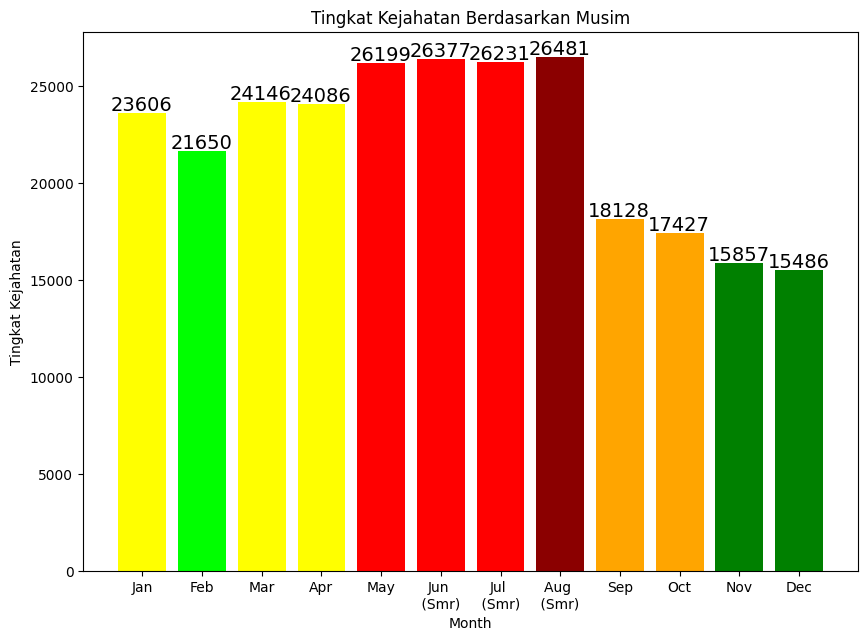

In [169]:
fig3 = plt.figure(figsize = (10,7))
ind3 = np.arange(12)
ax3 = plt.subplot(111)
rects = ax3.bar(ind3, df_summer['counts'], width = 0.8,color = ['yellow','lime','yellow','yellow','red','red','red','darkred','orange','orange','green','green'])
ax3.set_xticks(ind3)
ax3.set_xticklabels(['Jan','Feb','Mar','Apr','May','Jun \n (Smr) ','Jul \n (Smr) ','Aug \n (Smr) ','Sep','Oct','Nov','Dec'])
ax3.set_xlabel('Month')
ax3.set_ylabel('Tingkat Kejahatan')
ax3.set_title('Tingkat Kejahatan Berdasarkan Musim')
for rect in rects:
    height = rect.get_height()
    ax3.text(rect.get_x() - 0.13, height + 150, height, fontsize = 14)

INSIGHT:

Dari graph di atas terlihat bahwa tingkat kejahatan lebih tinggi pada saat summer.

Berdasarkan referensi yang ada, tingkat kejahatan semakin meningkat saat musim panas. Penyebabnya karena banyak yang vacation, otomatis penjagaan mereka terhadap rumah menjadi lengah, sekalipun sedang di rumah, mereka cenderung membiarkan jendela dan pintunya terbuka (karena panas / gerah), selanjutnya karena faktor alkohol, pada saat musim panas banyak penduduk yang melakukan gathering / kumpul bersama untuk menikmati alkohol, hal tersebut menyebabkan orang menjadi kehilangan kontrol pada saat mabuk.
Yang terakhir karena ketidaknyamanan, akibat suhu yang panas, orang menjadi lebih mudah emosi, dan menjadi trigger untuk melakukan tindak kejahatan,

Selengkapnya dapat dibaca melalui referensi berikut https://www.guardiansecurity.co/b/why-do-crime-rates-go-up-in-the-summer


SARAN:

Penjagaan harus semakin ketat pada saat musim panas, kemudian terus melakukan sosialisasi pentingnya menjaga keamanan di rumah, misalnya untuk memastikan pintu terkunci dengan benar, atau menerapkan smart home dengan adanya CCTV, door alarm, ataupun deteksi lainnya.

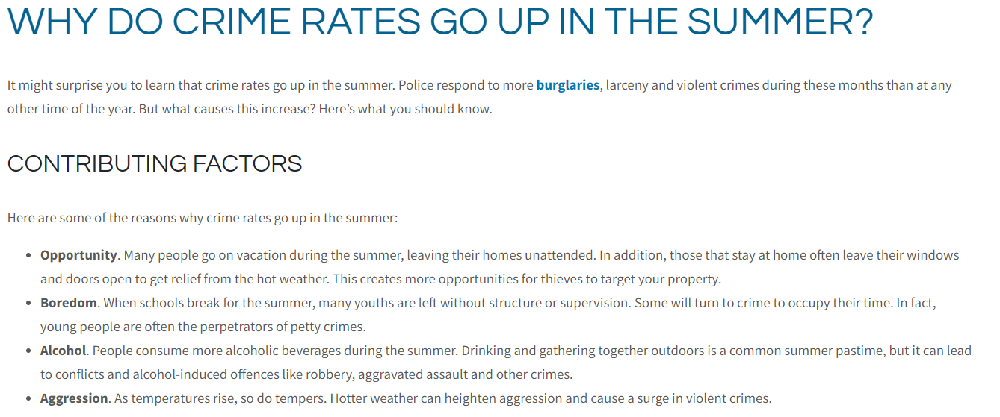

* Berdasarkan Cuaca (EDA-AFL-CUA)

Pada tahap ini saya melakukan analisa berdasarkan cuaca, data saya ambil dari US Climate, https://www.usclimatedata.com/climate/boston/massachusetts/united-states/usma0046/{ano}/{mes}#history 

Maka saya dapatkan suatu insight seperti di bawah ini:

In [170]:
weather = pd.read_csv('G:/DS/boston-weather.csv', parse_dates=['Day'], index_col='Day')
weather = weather.reindex(pd.date_range(df['OCCURRED_ON_DATE'].min(), df['OCCURRED_ON_DATE'].max()))
weather = pd.to_numeric(weather['High(°F)'], errors='coerce').interpolate()

In [171]:
window = 30

In [172]:
crimes_daily = df.groupby(df['OCCURRED_ON_DATE'].dt.date)['INCIDENT_NUMBER'].count() \
    .reindex(pd.date_range(df['OCCURRED_ON_DATE'].min(), df['OCCURRED_ON_DATE'].max())) \
    .rolling(window).mean().dropna()
w = weather.rolling(window).mean().reindex(crimes_daily.index)
print(f'Pearson Correlation Coefficient: {np.corrcoef(crimes_daily, w)[1,0] * 100:.2f}%')

Pearson Correlation Coefficient: 81.26%


C:\Users\andis\AppData\Local\Temp\ipykernel_16928\166165898.py:5: UserWarning:

FixedFormatter should only be used together with FixedLocator



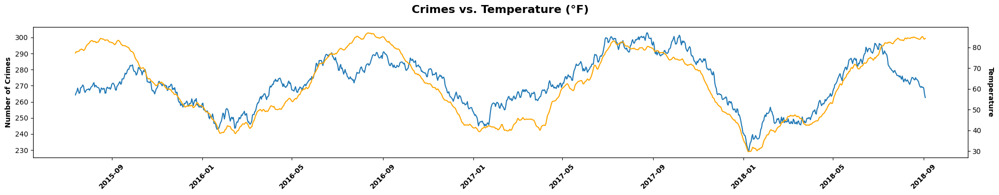

In [173]:
plt.figure(figsize=(20,4))
plt.title('Crimes vs. Temperature (°F)', fontsize=16, weight='bold', pad=20)
ax = sns.lineplot(data=crimes_daily)
plt.ylabel('Number of Crimes', rotation=90, weight='bold')
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, fontweight='bold')

ax2 = ax.twinx()
sns.lineplot(data=w, ax=ax2, color='orange')
ax2.xaxis.set_ticks_position('none')
ax2.yaxis.set_ticks_position('right')
plt.ylabel('Temperature', rotation=-90, weight='bold', labelpad=18)
ax2.grid(False)

plt.tight_layout()
plt.show()

INSIGHT:

Berdasarkan analisa di atas,
terlihat bahwa  temperature dan kejahatan berjalan nyaris beriringan.

SARAN:

Setelah melihat data di atas, saya menyarankan pihak Kepolisian untuk memantau prediksi / prakiraan cuaca, sehinga dapat berjaga - jaga terhadap potensi kejahatan yang ada, misalnya Kepolisian dapat bekerja sama dengan Instansi yang memiliki tupoksi untuk memantau cuaca di Boston (jika di Indonesia contohnya adalah BMKG)

> # KESIMPULAN & ACTIONABLE RECOMMENDATION

code: KES-6


BERDASARKAN WAKTU:

Secara umum, jika dilihat dari prepektif waktu kejadian, kejahatan sering terjadi pada jam kerja / hari sibuk, dan puncaknya adalah hari Jumat malam hingga dini hari,

ACTION

Pihak kepolisian harus mengerahkan personilnya untuk berjaga pada jam – jam tersebut, khususnya di area kampus, area perkantoran, ataupun pusat keramaian / bisnis lainnya.
Terkait tingkat kejahatan pada Jumat malam / sabtu dini hari, polisi harus sering melaukan patrol, dan memusatkan pada titik hiburan malam, seperti bar, karaoke, dll. Karena ketika mabuk orang menjadi lebih tidak terkontrol.
Kemudian jika melihat pola yang terjadi, penjagaan polisi harus semakin ketat pada bulan Juni – Juli –Agustus, karena merupakan masa ajaran baru / masuk perkuliahan

____
BERDASARKAN TEMPAT

Polisi harus berjaga pada daerah yang rawan kejahatan, misalnya Roxbury, Dorchester, dan Soutboston, dan daerah lainnya yang berdekatan, ataupun daerah yang mobilisasinya menuju ke area rawan tersebut (jika di Indonesia contohnya adalah Jakarat – Bekasi, Jakarat Tangerang, dll). Karena berdasarkan referensi, Roxbury memang kota yang berbahaya. 

ACTION

Pihak keamanan harus mengingatkan pada pengunjung / pelancong wanita, ataupun penduduk sekitar agar membatasi jalan kaki dan bersepeda sendiri.

___
BERDASARKAN JENIS KEJAHATAN

Tingkat kejahatan tertinggi didominasi oleh pencurian / penyerangan hingga membuat tubuh terluka, penyalahgunaan senjata, dan pembunuhan. Maka dengan memfokuskan pada permasalahan tersebut, berpotensi menurunkan tingkat kejahatan secara signifikan. Meskipun presentase kejahatan penembakan hanya 0.32% dari seluruh data, hal tersebut tetap perlu menjadi perhatian khusus

ACTION

Salah satu solusinya adalah memperketat peredaran senjata, melalui regulasi yang mengikat. Terkait UCR,secara organsasi, polisi perlu membuat tim khusus yang berfokus pada setiap UCR, sehingga tiap jenis UCR dapat termonitoring dengan baik, selain itu kebijakan tentang UCR juga harus dikembangkan

___
BERDASARKAN PENANGANAN POLISI

Dari hasil analisa, Medical Assistance/ bantuan medis kepada korban di TKP
mendapati posisi tertinggi,

ACTION

Peningkatan kapasitas terkait ilmu medis harus ditingkatkan, baik dengan menambahkan kurikulum tentang penanganan pada pertolongan pertama pada pendidikan kepolisian, atau membangun pusat kesehatan pada daerah rawan.

___
BERDASARKAN FAKTOR LAIN

Musim dan cuaca memiliki pengaruh pada tingkat kejahatan

ACTION

Sosialisasi tentang pentingnya menjaga keamanan rumah saat musim panas, dan menerapkan alat keamanan (smart home) di rumah masing-masing.
Pihak kepolisian juga harus bekerja sama dengan instansi yang memiliki tupoksi terkait cuaca, agar memiliki data prakiraan cuaca dan menjadi dasar untuk pengerahan personil.

___
KONKLUSI UTAMA:

Secara pragmatis, pihak kepolisian perlu berjaga pada kota Roxbury dan sekitarnya, khususnya pada jam kerja dan hari jumat malam – hingga dini hari. Lalu memaksimalkan personil pada bulan Juni – Juli –Agustus, karena selain musim panas, juga masa perkuliahan dimulai.
(namun ini hanya solusi instant, berdasarkan tingkat urgensi yang paling tinggi saja, untuk memaksimalkannya perlu mempertimbangkan hasil analisa secara komprehensif)
 





